# **Imports do Projeto**

In [873]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from scipy.stats import fisher_exact
import seaborn as sns

# **Anos análisado**

In [874]:
anos = ['2019', '2020', '2021', '2022', '2023']

# **Funções para normalização**

## **Função para normalização (Min-Max Scaling)**

In [875]:
def normalizar_max_min(coluna, minimo, maximo):
    return (coluna - minimo) / (maximo - minimo)

## **Função para calcular os casos normalizados por 100 mil habitantes.**

In [876]:
def calcular_casos_normalizados(casos, populacao_total):
    return casos / (populacao_total / 100000)

# **Pré-processamento de Dados**


**Gera uma tabela consolidada a partir dos arquivos CSV na pasta especificada.**

***
    A função realiza as seguintes etapas:
    1. Lê todos os arquivos CSV na pasta fornecida.
    2. Extrai o total de casos notificados e as informações de ano e região de cada arquivo.
    3. Mapeia as siglas das regiões para seus nomes e códigos correspondentes.
    4. Cria um DataFrame consolidado com os dados extraídos.
    5. Salva o DataFrame consolidado em um arquivo CSV chamado 'tabela_consolidada.csv'.

    Parâmetros:
    pasta_csv (str): O caminho da pasta que contém os arquivos CSV.
***

In [877]:
def gerar_tabela_consolidada(pasta_csv):
   
    mapa_regioes = {
        'AR': {'cidade': 'Angra dos Reis', 'COD_CIDADE': 32},
        'RJ': {'cidade': 'Rio de Janeiro', 'COD_CIDADE': 33},
        'CG': {'cidade': 'Campos de Goytacazes', 'COD_CIDADE': 34},
        'VA': {'cidade': 'Valença', 'COD_CIDADE': 35}
    }

    consolidados = []

    for arquivo in os.listdir(pasta_csv):
        if arquivo.endswith(".csv"):
            caminho_arquivo = os.path.join(pasta_csv, arquivo)
            
            try:
                df = pd.read_csv(caminho_arquivo, encoding='latin1')
            except UnicodeDecodeError:
                df = pd.read_csv(caminho_arquivo, encoding='utf-8')
            
            total = df['Casos notificados'].iloc[-1]
            
            nome, _ = os.path.splitext(arquivo)
            partes = nome.split('_')
            ano = partes[0][-4:]
            sigla_regiao = partes[1]
            
            regiao_info = mapa_regioes.get(sigla_regiao)
            if regiao_info:
                cidade = regiao_info['cidade']
                cod_cidade = regiao_info['COD_CIDADE']
                
                consolidados.append({
                    'Nome do Arquivo': arquivo,
                    'Total': total,
                    'Ano': ano,
                    'Região': cidade,
                    'COD_CIDADE': cod_cidade
                })

    df_consolidado = pd.DataFrame(consolidados)

    df_consolidado.to_csv('tabela_consolidada.csv', index=False)

    print("Tabela consolidada salva como 'tabela_consolidada.csv'.")


In [878]:
gerar_tabela_consolidada('casos_dengue_rj')

Tabela consolidada salva como 'tabela_consolidada.csv'.


**Atualiza a tabela de saúde com os totais de casos de dengue da tabela consolidada.**
***
    Parâmetros:
    anos (list): Lista de anos a serem considerados para atualização.
***

In [879]:
def atualizar_tabela_saude(anos):
  
    df_consolidado = pd.read_csv('tabela_consolidada.csv')
    df_saude = pd.read_csv('2019-2023-casos de dengue.csv')
    df_saude.columns = df_saude.columns.str.strip()
    df_saude.columns = df_saude.columns.astype(str)

    for ano in anos:
        if ano in df_saude.columns:
            df_saude[ano] = pd.to_numeric(df_saude[ano], errors='coerce')

    for _, row in df_consolidado.iterrows():
        ano = str(row['Ano'])
        total = row['Total']
        cod_cidade = row['COD_CIDADE']
        
        print(f"Processando COD_CIDADE: {cod_cidade}, Ano: {ano}, Total: {total}")

        if cod_cidade in df_saude['COD_CIDADE'].values:
            if ano in df_saude.columns:
                current_value = df_saude.loc[df_saude['COD_CIDADE'] == cod_cidade, ano].values[0]
                if pd.isna(current_value):
                    current_value = 0
                
                new_value = current_value + total
                df_saude.loc[df_saude['COD_CIDADE'] == cod_cidade, ano] = new_value
                
                print(f"Atualizando {ano} para COD_CIDADE {cod_cidade}: novo valor é {new_value}")
            else:
                print(f"Ano '{ano}' não encontrado nas colunas da tabela de saúde.")
        else:
            print(f"COD_CIDADE '{cod_cidade}' não encontrado na tabela de saúde.")

    df_saude.to_csv('tabela_saude_atualizada.csv', index=False)

    print("Tabela de saúde atualizada salva como 'tabela_saude_atualizada.csv'.")


In [880]:
atualizar_tabela_saude(anos)

Processando COD_CIDADE: 32, Ano: 2019, Total: 1764
Atualizando 2019 para COD_CIDADE 32: novo valor é 1764
Processando COD_CIDADE: 34, Ano: 2019, Total: 177
Atualizando 2019 para COD_CIDADE 34: novo valor é 177
Processando COD_CIDADE: 33, Ano: 2019, Total: 22046
Atualizando 2019 para COD_CIDADE 33: novo valor é 22046
Processando COD_CIDADE: 35, Ano: 2019, Total: 190
Atualizando 2019 para COD_CIDADE 35: novo valor é 190
Processando COD_CIDADE: 32, Ano: 2020, Total: 187
Atualizando 2020 para COD_CIDADE 32: novo valor é 187
Processando COD_CIDADE: 34, Ano: 2020, Total: 18
Atualizando 2020 para COD_CIDADE 34: novo valor é 18
Processando COD_CIDADE: 33, Ano: 2020, Total: 1536
Atualizando 2020 para COD_CIDADE 33: novo valor é 1536
Processando COD_CIDADE: 35, Ano: 2020, Total: 104
Atualizando 2020 para COD_CIDADE 35: novo valor é 104
Processando COD_CIDADE: 32, Ano: 2021, Total: 104
Atualizando 2021 para COD_CIDADE 32: novo valor é 104
Processando COD_CIDADE: 34, Ano: 2021, Total: 94
Atualizan

**Este código tem como objetivo limpar e ajustar os dados de população de um arquivo CSV. Primeiro, ele remove quaisquer símbolos ou letras que possam estar misturados nos números da população. Depois, transforma esses valores em números e descarta os dados inválidos. Em seguida, o código encontra o valor mais baixo e o mais alto da população e ajusta todos os números para uma escala de 0 a 1, para facilitar comparações. No final, ele salva esses novos valores em um novo arquivo e mostra o resultado.**
**Lê um arquivo CSV com dados de população, normaliza a coluna 'População Total' e salva os dados normalizados em um novo arquivo CSV.**

***
    Parâmetros:
    - input_file (str): O caminho do arquivo CSV de entrada (padrão: 'habitantes-cidades.csv').
    - output_file (str): O caminho do arquivo CSV de saída (padrão: 'habitantes_normalizados.csv').
***

In [881]:
def normalizar_populacao(input_file='habitantes-cidades.csv', output_file='habitantes_normalizados.csv'):
    
    df = pd.read_csv(input_file)
    df['População Total'] = df['População Total'].astype(str).str.replace(r'\D', '', regex=True)
    df['População Total'] = pd.to_numeric(df['População Total'], errors='coerce')
    df = df.dropna(subset=['População Total'])
    
    min_pop = df['População Total'].min()
    max_pop = df['População Total'].max()
    
    df['População Normalizada'] = (df['População Total'] - min_pop) / (max_pop - min_pop)

    df.to_csv(output_file, index=False)

    print(f"\nDados normalizados salvos em '{output_file}'.")
    print(df)

In [882]:
normalizar_populacao()


Dados normalizados salvos em 'habitantes_normalizados.csv'.
    COD_CIDADE       Região de Saúde  População Total Estado  \
0            1              Cruzeiro          3151400     DF   
1            2            Lago Norte          3582100     DF   
2            3              Lago Sul          2937700     DF   
3            4          Plano Piloto         20618300     DF   
4            5    Sudoeste Octogonal          5003300     DF   
5            6                Varjão           879300     DF   
6            7        Candangolândia          1601900     DF   
7            8            Estrutural          3068700     DF   
8            9                 Guará         10784700     DF   
9           10    Núcleo Bandeirante          2313400     DF   
10          11              Park Way          2034500     DF   
11          12        Riacho Fundo I          3529100     DF   
12          13       Riacho Fundo II          3710800     DF   
13          14                   SIA       

**Pegado somente as colunas necessárias**

In [883]:
# Colunas que queremos filtrar nos arquivos CSV
colunas_desejadas = [
    'Data', 
    'Hora UTC', 
    'PRECIPITAÇÃO TOTAL, HORÁRIO (mm)', 
    'TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)', 
    'TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)', 
    'UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)', 
    'UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'
]

def processar_csv(diretorio, arquivo, diretorio_novo):
    caminho_arquivo = os.path.join(diretorio, arquivo)
    df = pd.read_csv(caminho_arquivo)

    df.columns = df.columns.str.strip()

    colunas_presentes = [coluna for coluna in colunas_desejadas if coluna in df.columns]
    df_filtrado = df[colunas_presentes]

    novo_caminho = os.path.join(diretorio_novo, arquivo)
    df_filtrado.to_csv(novo_caminho, index=False)

    print(f'Arquivo {arquivo} processado. Novo arquivo salvo como {novo_caminho}.')

for ano in anos:
    diretorio = ano
    diretorio_novo = f'{ano}-formatado'
    
    os.makedirs(diretorio_novo, exist_ok=True)

    arquivos_csv = [f for f in os.listdir(diretorio) if f.endswith('.csv')]

    for arquivo in arquivos_csv:
        processar_csv(diretorio, arquivo, diretorio_novo)


Arquivo 1-2019-BRAZLANDIA.csv processado. Novo arquivo salvo como 2019-formatado\1-2019-BRAZLANDIA.csv.
Arquivo 2-2019-AGUAS EMENDADAS.csv processado. Novo arquivo salvo como 2019-formatado\2-2019-AGUAS EMENDADAS.csv.
Arquivo 3-2019-BRASILIA.csv processado. Novo arquivo salvo como 2019-formatado\3-2019-BRASILIA.csv.
Arquivo 4-2019-GAMA.csv processado. Novo arquivo salvo como 2019-formatado\4-2019-GAMA.csv.
Arquivo 5-2019-PARANOA.csv processado. Novo arquivo salvo como 2019-formatado\5-2019-PARANOA.csv.
Arquivo 6-2019-CAMPOSDOSGOYTACAZES.csv processado. Novo arquivo salvo como 2019-formatado\6-2019-CAMPOSDOSGOYTACAZES.csv.
Arquivo 7-2019-ANGRADOSREIS.csv processado. Novo arquivo salvo como 2019-formatado\7-2019-ANGRADOSREIS.csv.
Arquivo 8-2019-RIODEJANEIRO.csv processado. Novo arquivo salvo como 2019-formatado\8-2019-RIODEJANEIRO.csv.
Arquivo 9-2019-VALENCA.csv processado. Novo arquivo salvo como 2019-formatado\9-2019-VALENCA.csv.
Arquivo 1-2020-BRAZLANDIA.csv processado. Novo arquivo s

**Criando a média, os estremos e a normalização: O código processa dados climáticos de arquivos CSV organizados por ano. Ele define funções para calcular médias e extremos, normalizar os dados usando Min-Max Scaling e criar arquivos CSV com os resultados. Para cada ano, lê os arquivos, acumula as informações, calcula as estatísticas e salva os dados em arquivos separados para médias, extremos e normalização, finalizando com uma mensagem de conclusão do processamento.**

In [884]:
diretorios_anos = ['2019-formatado', '2020-formatado', '2021-formatado', '2022-formatado', '2023-formatado']

def calcular_medias(arquivo, diretorio):
    df = pd.read_csv(os.path.join(diretorio, arquivo))
    
    df.columns = df.columns.str.strip()
    df.replace(',', '.', regex=True, inplace=True)
    df['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)'] = pd.to_numeric(df['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)'], errors='coerce')
    df['TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)'] = pd.to_numeric(df['TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)'], errors='coerce')
    df['TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)'] = pd.to_numeric(df['TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)'], errors='coerce')
    df['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'] = pd.to_numeric(df['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'], errors='coerce')
    df['UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'] = pd.to_numeric(df['UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'], errors='coerce')

    # Calcula as médias
    medias = {
        'COD_REG': arquivo[0],
        'Arquivo': arquivo,
        'Média de Precipitação': df['PRECIPITAÇÃO TOTAL, HORÁRIO (mm)'].mean(),
        'Média de Temperatura Máxima': df['TEMPERATURA MÁXIMA NA HORA ANT. (AUT) (°C)'].mean(),
        'Média de Temperatura Mínima': df['TEMPERATURA MÍNIMA NA HORA ANT. (AUT) (°C)'].mean(),
        'Média de Umidade Relativa Máxima': df['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'].mean(),
        'Média de Umidade Relativa Mínima': df['UMIDADE REL. MIN. NA HORA ANT. (AUT) (%)'].mean(),
    }

    return medias

def processar_ano(diretorio):
    arquivos_csv = [f for f in os.listdir(diretorio) if f.endswith('.csv')]

    medias_data = []

    for arquivo in arquivos_csv:
        medias = calcular_medias(arquivo, diretorio)
        medias_data.append(medias)

    return medias_data

def criar_csv(csv_data, nome_arquivo):
    df_csv = pd.DataFrame(csv_data)
    df_csv.to_csv(nome_arquivo, index=False)

for diretorio in diretorios_anos:
    ano = diretorio.split('-')[0]
    medias_data = processar_ano(diretorio)
    
    criar_csv(medias_data, f'medias_{ano}.csv')

print("Processamento concluído para todos os anos.")

arquivos_medias = {
    '2019': 'medias_2019.csv',
    '2020': 'medias_2020.csv',
    '2021': 'medias_2021.csv',
    '2022': 'medias_2022.csv',
    '2023': 'medias_2023.csv'
}

def calcular_max_min(dfs):
    prec_min = min([df['Média de Precipitação'].min() for df in dfs])
    prec_max = max([df['Média de Precipitação'].max() for df in dfs])
    
    temp_max_min = min([df['Média de Temperatura Máxima'].min() for df in dfs])
    temp_max_max = max([df['Média de Temperatura Máxima'].max() for df in dfs])
    
    temp_min_min = min([df['Média de Temperatura Mínima'].min() for df in dfs])
    temp_min_max = max([df['Média de Temperatura Mínima'].max() for df in dfs])
    
    umidade_max_min = min([df['Média de Umidade Relativa Máxima'].min() for df in dfs])
    umidade_max_max = max([df['Média de Umidade Relativa Máxima'].max() for df in dfs])
    
    umidade_min_min = min([df['Média de Umidade Relativa Mínima'].min() for df in dfs])
    umidade_min_max = max([df['Média de Umidade Relativa Mínima'].max() for df in dfs])

    return {
        'prec_min': prec_min, 'prec_max': prec_max,
        'temp_max_min': temp_max_min, 'temp_max_max': temp_max_max,
        'temp_min_min': temp_min_min, 'temp_min_max': temp_min_max,
        'umidade_max_min': umidade_max_min, 'umidade_max_max': umidade_max_max,
        'umidade_min_min': umidade_min_min, 'umidade_min_max': umidade_min_max
    }

dfs = [pd.read_csv(arquivo) for arquivo in arquivos_medias.values()]
max_min = calcular_max_min(dfs)

for ano, arquivo in arquivos_medias.items():
    df = pd.read_csv(arquivo)
    
    # Normalizando as colunas
    df['PRECIPITAÇÃO NORMALIZADA'] = df['Média de Precipitação'].apply(normalizar_max_min, minimo=max_min['prec_min'], maximo=max_min['prec_max'])
    df['TEMP MAX NORMALIZADA'] = df['Média de Temperatura Máxima'].apply(normalizar_max_min, minimo=max_min['temp_max_min'], maximo=max_min['temp_max_max'])
    df['TEMP MIN NORMALIZADA'] = df['Média de Temperatura Mínima'].apply(normalizar_max_min, minimo=max_min['temp_min_min'], maximo=max_min['temp_min_max'])
    df['UMIDADE MAX NORMALIZADA'] = df['Média de Umidade Relativa Máxima'].apply(normalizar_max_min, minimo=max_min['umidade_max_min'], maximo=max_min['umidade_max_max'])
    df['UMIDADE MIN NORMALIZADA'] = df['Média de Umidade Relativa Mínima'].apply(normalizar_max_min, minimo=max_min['umidade_min_min'], maximo=max_min['umidade_min_max'])

    df_normalizado = pd.DataFrame({
        'COD_REG': df['COD_REG'], 
        'Arquivo': df['Arquivo'],
        'PRECIPITAÇÃO NORMALIZADA': df['PRECIPITAÇÃO NORMALIZADA'],
        'TEMP MAX NORMALIZADA': df['TEMP MAX NORMALIZADA'],
        'TEMP MIN NORMALIZADA': df['TEMP MIN NORMALIZADA'],
        'UMIDADE MAX NORMALIZADA': df['UMIDADE MAX NORMALIZADA'],
        'UMIDADE MIN NORMALIZADA': df['UMIDADE MIN NORMALIZADA']
    })

    nome_arquivo_normalizado = f'normalizacao_{ano}.csv'
    df_normalizado.to_csv(nome_arquivo_normalizado, index=False)
    print(f"Arquivo normalizado salvo: {nome_arquivo_normalizado}")

print("Processamento de normalização concluído para todos os anos.")


Processamento concluído para todos os anos.
Arquivo normalizado salvo: normalizacao_2019.csv
Arquivo normalizado salvo: normalizacao_2020.csv
Arquivo normalizado salvo: normalizacao_2021.csv
Arquivo normalizado salvo: normalizacao_2022.csv
Arquivo normalizado salvo: normalizacao_2023.csv
Processamento de normalização concluído para todos os anos.


**Gera tabelas de saúde por ano a partir dos arquivos CSV de saúde e população normalizada.**
***
    A função realiza as seguintes etapas:
    1. Carrega os arquivos CSV de saúde e população normalizada.
    2. Mescla os dados utilizando a coluna COD_CIDADE.
    3. Para cada ano especificado, seleciona as colunas desejadas e renomeia a coluna de casos.
    4. Salva os DataFrames resultantes em arquivos CSV separados para cada ano.

    Parâmetros:
    arquivo_saude (str): O caminho do arquivo CSV com os dados de saúde.
    arquivo_populacao (str): O caminho do arquivo CSV com os dados de população normalizada.
    anos (list): Uma lista de anos (ex: [2019, 2020, 2021]) para os quais as tabelas serão geradas.
 ***


In [885]:
def gerar_tabelas_por_ano(arquivo_saude, arquivo_populacao, anos):
    saude_df = pd.read_csv(arquivo_saude)
    pop_df = pd.read_csv(arquivo_populacao)

    merged_df = pd.merge(saude_df, pop_df[['COD_CIDADE', 'População Total', 'População Normalizada']], on='COD_CIDADE')

    for ano in anos:
        ano_df = merged_df[['COD_CIDADE', 'COD_REG', 'Região de Saúde', ano, 'População Total', 'População Normalizada']]
        
        ano_df = ano_df.copy()
        ano_df.rename(columns={ano: 'Casos'}, inplace=True)

        ano_df['casos_normalizados'] = ano_df.apply(
            lambda row: calcular_casos_normalizados(row['Casos'], row['População Total']), axis=1
        )

        ano_df.to_csv(f'tabela_saude_{ano}.csv', index=False)

    print("Arquivos CSV gerados com sucesso!")

In [886]:
gerar_tabelas_por_ano('tabela_saude_atualizada.csv', 'habitantes_normalizados.csv', anos)

Arquivos CSV gerados com sucesso!


**Gera tabelas de saúde com dados de normalização para cada ano fornecido.**
***
    Para cada ano na lista de anos, a função:
    1. Carrega os arquivos CSV de saúde e normalização correspondentes ao ano.
    2. Seleciona apenas as colunas relevantes da tabela de normalização.
    3. Mescla os dados de saúde com os dados de normalização usando a coluna COD_REG.
    4. Salva o resultado em um novo arquivo CSV, indicando que os dados de normalização foram adicionados.
    
    Parâmetros:
    anos (list): Uma lista de anos para os quais as tabelas serão geradas.
   ***

In [887]:
def gerar_tabelas_com_normalizacao(anos):
   
    for ano in anos:
        tabela_saude_path = f'tabela_saude_{ano}.csv'
        normalizacao_path = f'normalizacao_{ano}.csv'
        
        tabela_saude_df = pd.read_csv(tabela_saude_path)
        normalizacao_df = pd.read_csv(normalizacao_path)
        
        normalizacao_df = normalizacao_df[[
             'COD_REG', 
             'PRECIPITAÇÃO NORMALIZADA', 
             'TEMP MAX NORMALIZADA',         
             'TEMP MIN NORMALIZADA', 
             'UMIDADE MAX NORMALIZADA', 
             'UMIDADE MIN NORMALIZADA' 
        ]]
        
        tabela_completa_df = pd.merge(tabela_saude_df, normalizacao_df, on='COD_REG', how='left')
        
        tabela_completa_path = f'tabela_saude_com_normalizacao_{ano}.csv'
        tabela_completa_df.to_csv(tabela_completa_path, index=False)

        print(f"Arquivo gerado: {tabela_completa_path}")

**Processa os dados de saúde para um determinado ano, realizando análise descritiva,matriz de correlação e gráficos de dispersão.**
***
    Parâmetros:
    ano (int): O ano a ser processado.
***

In [888]:
gerar_tabelas_com_normalizacao(anos)

Arquivo gerado: tabela_saude_com_normalizacao_2019.csv
Arquivo gerado: tabela_saude_com_normalizacao_2020.csv
Arquivo gerado: tabela_saude_com_normalizacao_2021.csv
Arquivo gerado: tabela_saude_com_normalizacao_2022.csv
Arquivo gerado: tabela_saude_com_normalizacao_2023.csv


# **Análise Estátistica**

## **Funções**

**Realiza uma análise descritiva básica para o DataFrame fornecido e imprime as estatísticas descritivas.**

In [889]:
def analise_descritiva(df, regiao, ano):
    descricao = df.describe().round(2)

    def highlight_max(s):
        return ['background-color: yellow' if v == s.max() else '' for v in s]

    styled = descricao.style \
        .apply(highlight_max) \
        .set_properties(**{
            'background-color': '#f9f9f9',
            'color': '#333',
            'border-color': '#ddd',
            'border-width': '1px',
            'border-style': 'solid',
            'font-size': '14px',
            'text-align': 'center'
        }) \
        .set_table_styles([{
            'selector': 'th',
            'props': [('background-color', '#4CAF50'), ('color', 'white'), ('font-weight', 'bold')]
        }, {
            'selector': 'caption',
            'props': [('font-size', '16px'), ('font-weight', 'bold')]
        }]) \
        .set_caption(f"Análise Descritiva para {regiao} - Ano {ano}")
    
    return styled


**Calcula a matriz de correlação para as colunas numéricas do DataFrame e a visualiza como um gráfico de calor.**

In [890]:
def calcular_correlacao(df, regiao, ano):
    numerical_df = df.select_dtypes(include=[np.number])
    correlation_matrix = numerical_df.corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True)
    plt.title(f'Matriz de Correlação para {regiao} ({ano})', fontsize=16)
    plt.show()

**Gera gráficos de dispersão para as características especificadas em relação aos casos normalizados de dengue para o Distrito Federal e Rio de Janeiro.**

In [891]:
def gerar_graficos(df, features, ano, cidade):
    for feature in features:
        plt.figure(figsize=(10, 6))
        
        # Scatter plot
        sns.scatterplot(
            data=df,
            x=feature,
            y='casos_normalizados',
            label=cidade,
            color='blue' if cidade == 'Distrito Federal' else 'red',
            alpha=0.6,
            s=100
        )
        
        sns.regplot(
            data=df,
            x=feature,
            y='casos_normalizados',
            scatter=False,
            color='orange',
            ci=None, 
            line_kws={'linestyle': '--', 'linewidth': 2}
        )
        
        corr = df[[feature, 'casos_normalizados']].corr().iloc[0, 1]

        plt.title(f'Relação entre Casos de Dengue e {feature} em {cidade} ({ano})', fontsize=16)
        plt.xlabel(feature, fontsize=14) 
        plt.ylabel('Casos de Dengue Normalizados', fontsize=14)
        
        plt.legend()

        # Adiciona um grid
        plt.grid(True, linestyle='--', alpha=0.7)

        plt.text(0.95, 0.05, f'Correlação: {corr:.2f}', transform=plt.gca().transAxes,
                 fontsize=12, verticalalignment='bottom', horizontalalignment='right',
                 bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        plt.tight_layout()
        
        plt.show()

**Processa os dados de um ano específico, realizando a leitura do arquivo CSV, separação dos dados do Rio de Janeiro e do Distrito Federal, e executando análises descritivas, cálculos de correlação e geração de gráficos.**

In [892]:
tabelas_dengue_df = []
tabelas_dengue_rio = []

def processar_ano_distintos(ano):
    file_path_resultados = f'tabela_saude_com_normalizacao_{ano}.csv'  # Ajusta para múltiplos anos
    df = pd.read_csv(file_path_resultados)

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    analise_descritiva(df_rio, "Rio de Janeiro", ano)
    analise_descritiva(df_df, "Distrito Federal", ano)

    calcular_correlacao(df_rio, "Rio de Janeiro", ano)
    calcular_correlacao(df_df, "Distrito Federal", ano)

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

    gerar_graficos_df(df_df, features, ano)
    gerar_graficos_rio(df_rio, features, ano)

    df_df.loc[:, 'Ano'] = ano
    df_rio.loc[:, 'Ano'] = ano
    tabelas_dengue_df.append(df_df)
    tabelas_dengue_rio.append(df_rio)

In [893]:
# for ano in anos:
#     processar_ano_distintos(ano)

**Processa os dados de um ano específico, lendo o arquivo CSV, realizando análises descritivas, cálculos de correlação, e gerando gráficos de dispersão para as características relacionadas aos casos de dengue.**


In [894]:
tabelas_dengue = []

def processar_ano(ano):
    file_path_resultados = f'tabela_saude_com_normalizacao_{ano}.csv'  # Ajusta para múltiplos anos
    df = pd.read_csv(file_path_resultados)

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    # print(f"Análise descritiva para o ano {ano}:")
    # print(df_relevante.describe())

    numerical_df = df_relevante.select_dtypes(include=[np.number])

    # correlation_matrix = numerical_df.corr()
    # print(f"\nMatriz de correlação para {ano}:")
    # print(correlation_matrix)

    # plt.figure(figsize=(10, 8))
    # sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
    # plt.title(f'Matriz de Correlação para {ano}')
    # plt.show()

    # Separa os dados do Rio de Janeiro e do restante do DF
    df_rio = df_relevante.iloc[-4:]  # Últimos 4 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4]    # Todos os registros menos os últimos 4

    # features = [
    #     'População_Normalizada',
    #     'PRECIPITAÇÃO_NORMALIZADA', 
    #     'TEMP_MAX_NORMALIZADA',
    #     'TEMP_MIN_NORMALIZADA', 
    #     'UMIDADE_MAX_NORMALIZADA',
    #     'UMIDADE_MIN_NORMALIZADA'
    # ]

    # for feature in features:
    #     plt.figure(figsize=(10, 6))
        
    #     sns.scatterplot(data=df_df, x=feature, y='casos_normalizados', label='Distrito Federal', color='blue', alpha=0.6)
    #     sns.scatterplot(data=df_rio, x=feature, y='casos_normalizados', label='Rio de Janeiro', color='red', alpha=0.6)
        
    #     plt.title(f'Casos de Dengue vs. {feature} ({ano})')
    #     plt.xlabel(feature)
    #     plt.ylabel('Casos de Dengue')
    #     plt.legend()
    #     plt.show()

    df_relevante['Ano'] = ano
    tabelas_dengue.append(df_relevante)

In [895]:
for ano in anos:
    processar_ano(ano)

# **Análise Estátistica de 2019** 

In [896]:
    file_path_resultados = f'tabela_saude_com_normalizacao_2019.csv'
    df = pd.read_csv(file_path_resultados)
    ano = '2019'

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

## **Distrito Federal(DF)**

In [897]:
analise_descritiva(df_df, "Distrito Federal", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,1386.770000,8350006.450000,0.010000,21.360000,0.110000,0.290000,0.270000,0.170000,0.150000
std,1313.200000,8444581.370000,0.010000,18.220000,0.020000,0.070000,0.050000,0.070000,0.060000
min,6.000000,435600.000000,0.000000,1.380000,0.080000,0.220000,0.200000,0.030000,0.030000
25%,403.000000,3110050.000000,0.000000,9.150000,0.090000,0.240000,0.250000,0.130000,0.130000
50%,862.000000,5208900.000000,0.010000,13.760000,0.120000,0.240000,0.250000,0.130000,0.130000
75%,1973.000000,11376900.000000,0.020000,25.450000,0.120000,0.350000,0.320000,0.210000,0.180000
max,5667.000000,40593200.000000,0.060000,75.290000,0.150000,0.400000,0.370000,0.310000,0.270000


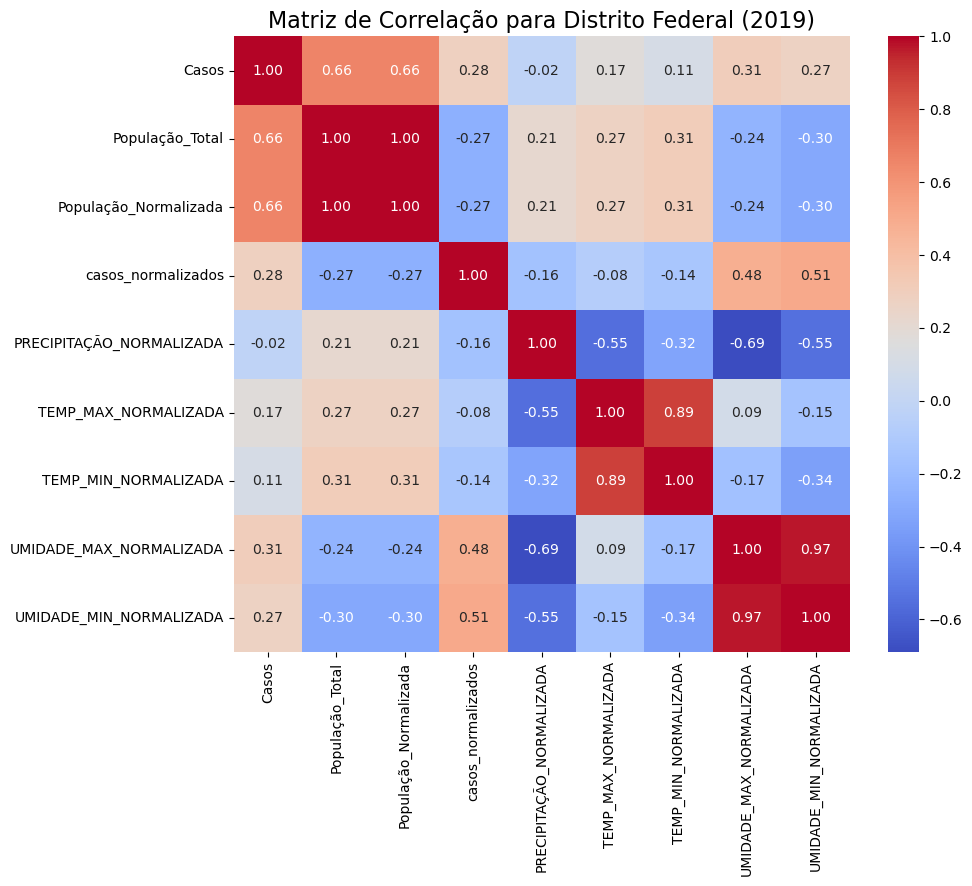

In [898]:
calcular_correlacao(df_df, "Distrito Federal", ano)

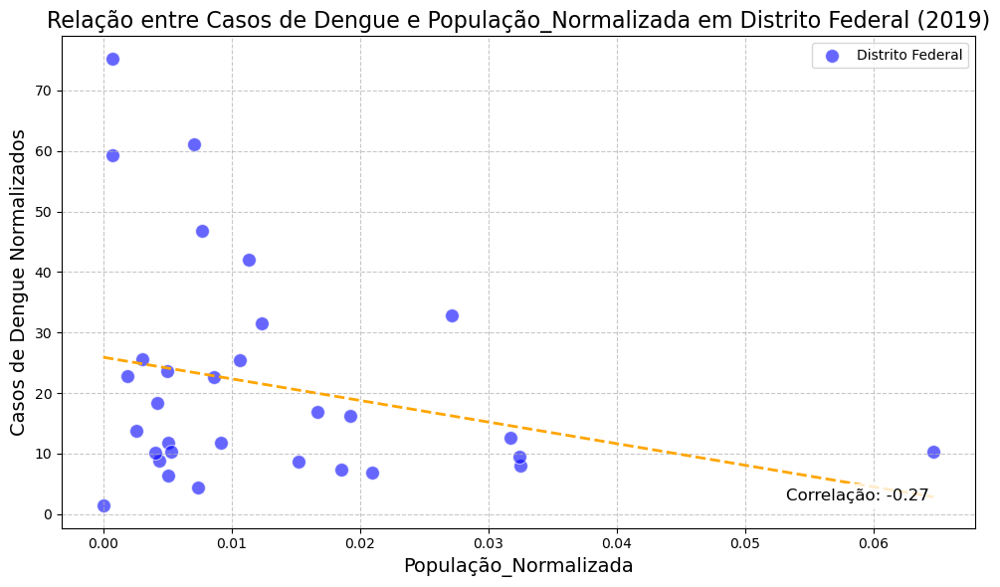

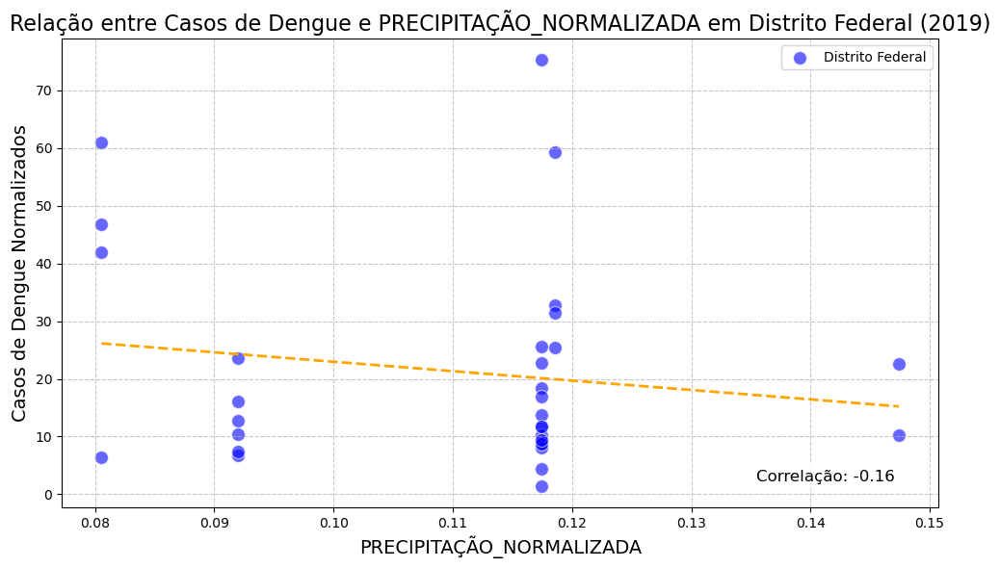

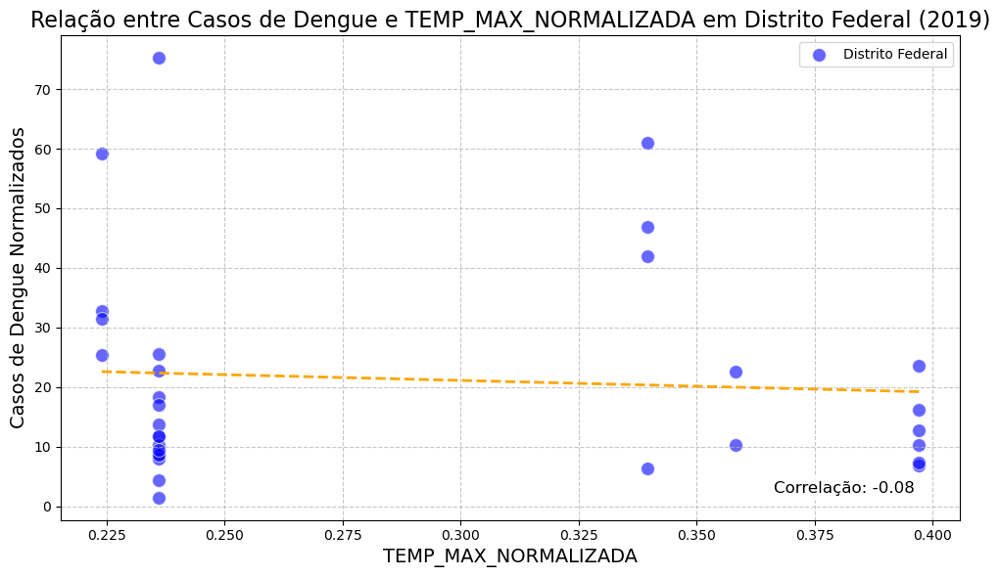

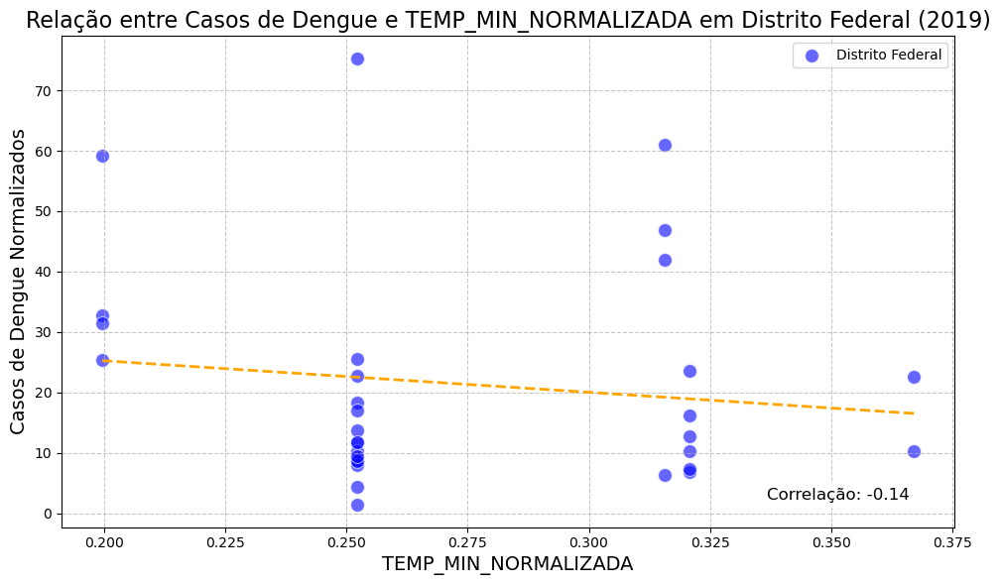

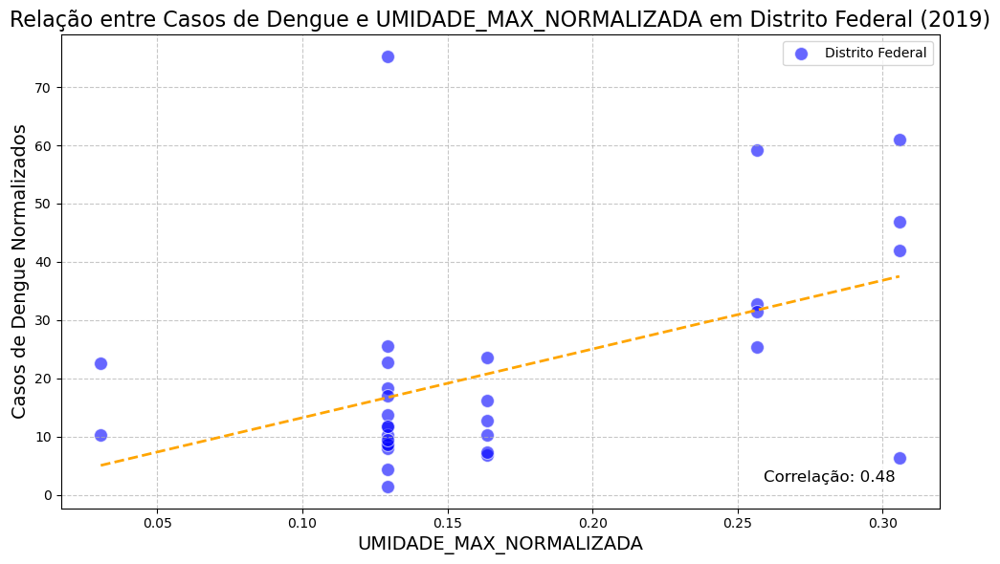

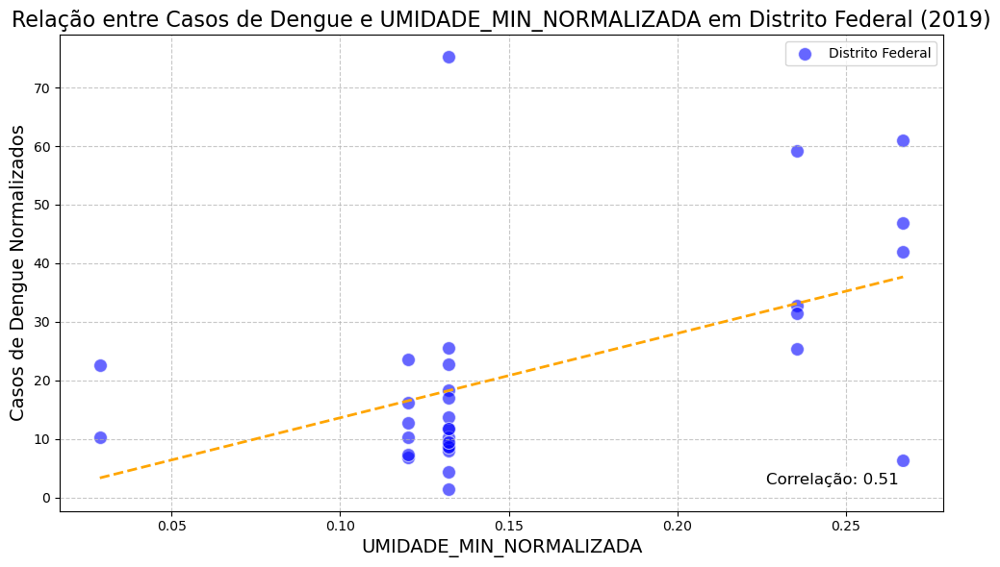

In [899]:
gerar_graficos(df_df, features, ano, 'Distrito Federal')

## **Rio de Janeiro(RJ)**

In [900]:
analise_descritiva(df_rio, "Rio de Janeiro", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,6044.250000,162377475.000000,0.260000,5.130000,0.150000,0.670000,0.740000,0.730000,0.750000
std,10693.820000,305874274.990000,0.490000,3.620000,0.140000,0.270000,0.260000,0.160000,0.140000
min,177.000000,4835400.000000,0.010000,2.790000,0.020000,0.300000,0.370000,0.590000,0.620000
25%,186.750000,6315450.000000,0.010000,3.360000,0.050000,0.590000,0.660000,0.650000,0.670000
50%,977.000000,11776100.000000,0.020000,3.600000,0.130000,0.750000,0.830000,0.680000,0.710000
75%,6834.500000,167838125.000000,0.270000,5.380000,0.230000,0.840000,0.910000,0.750000,0.790000
max,22046.000000,621122300.000000,1.000000,10.540000,0.330000,0.900000,0.930000,0.960000,0.950000


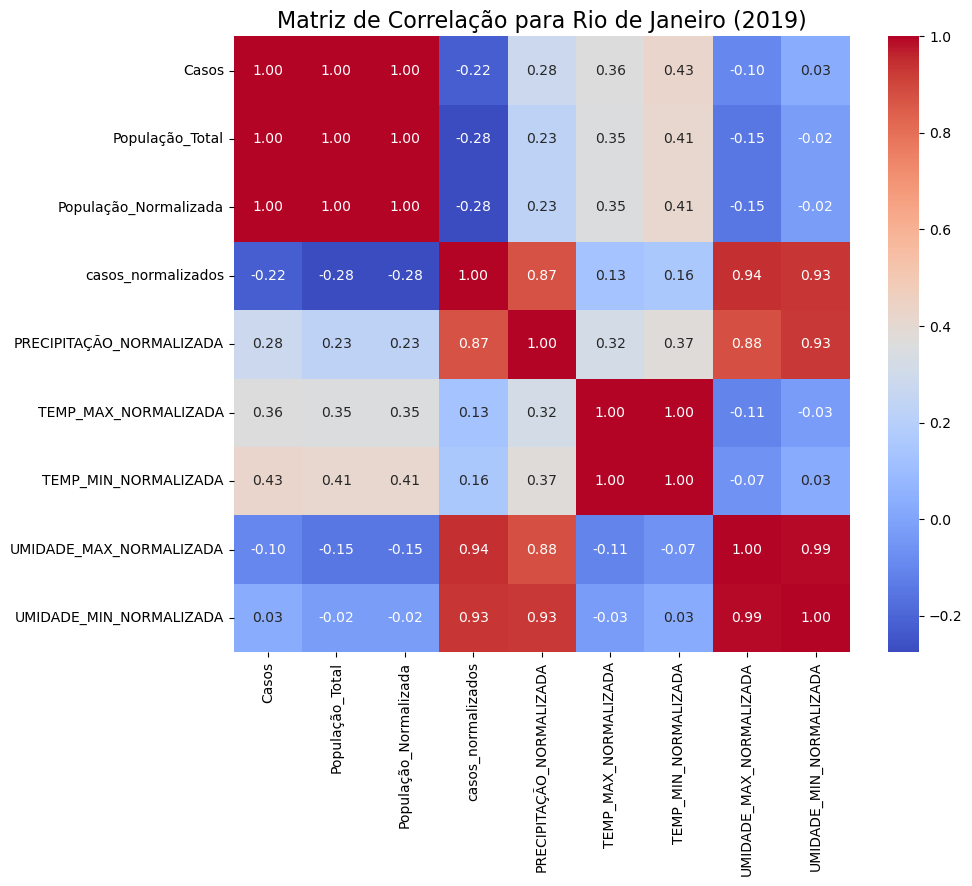

In [901]:
calcular_correlacao(df_rio, "Rio de Janeiro", ano)

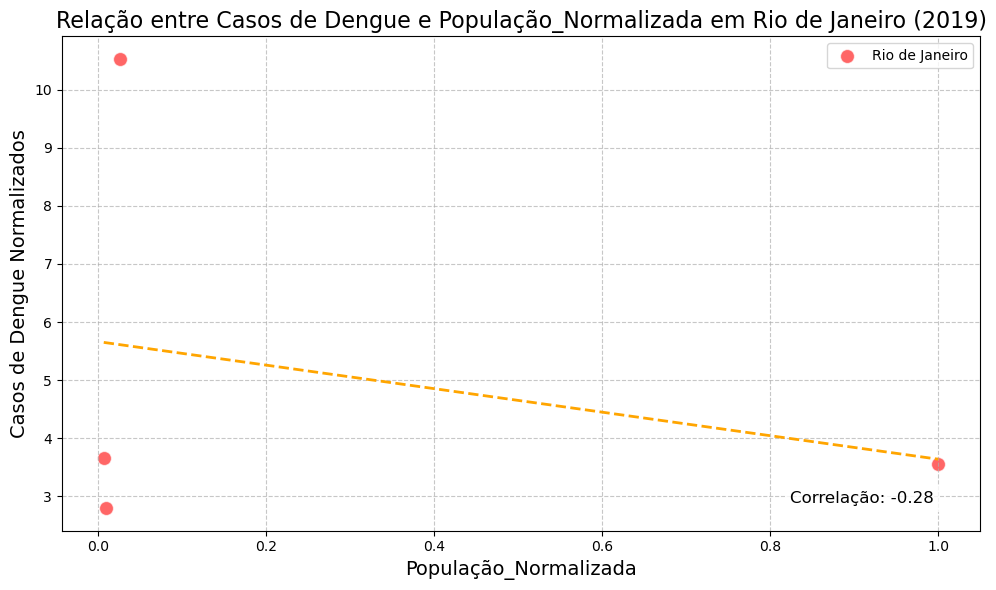

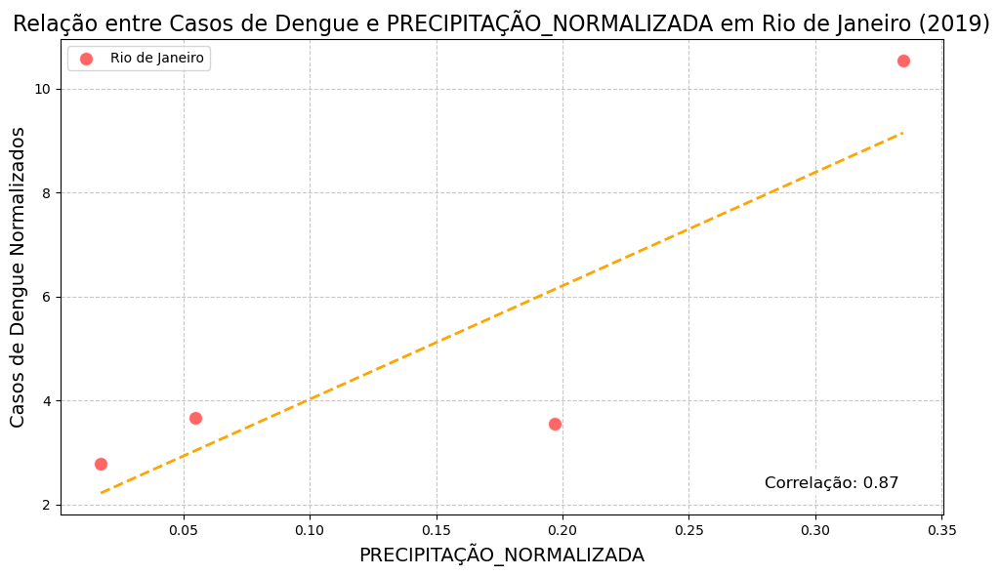

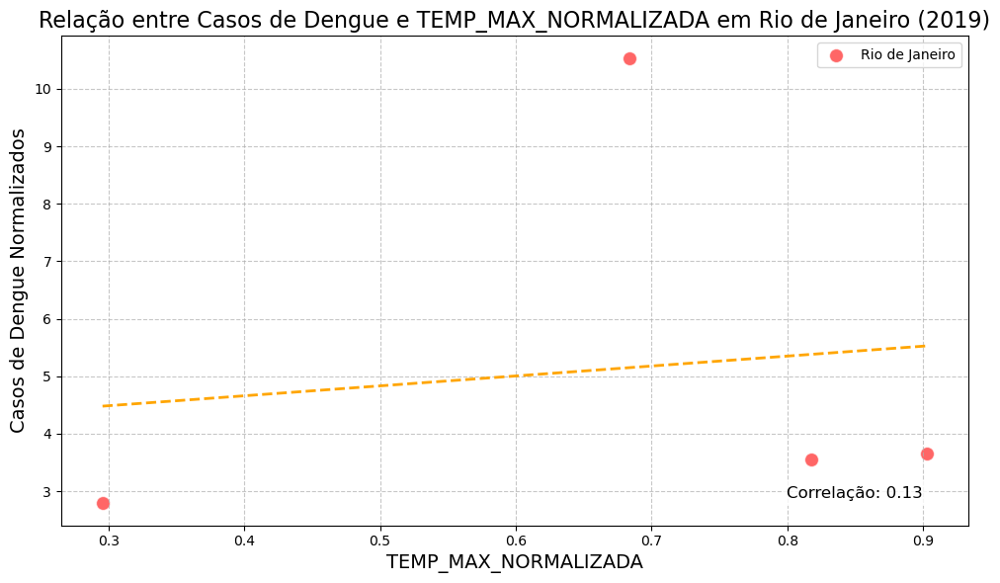

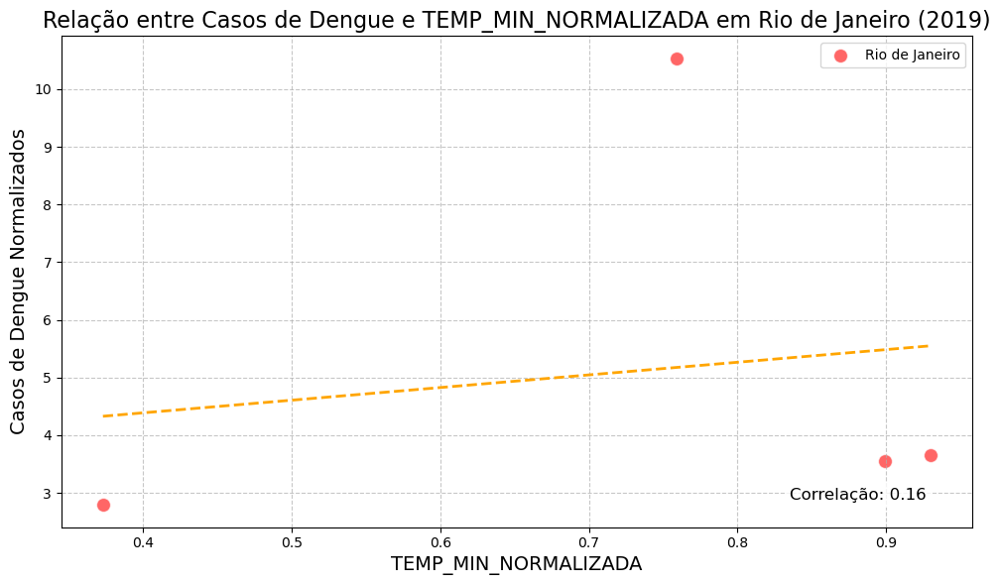

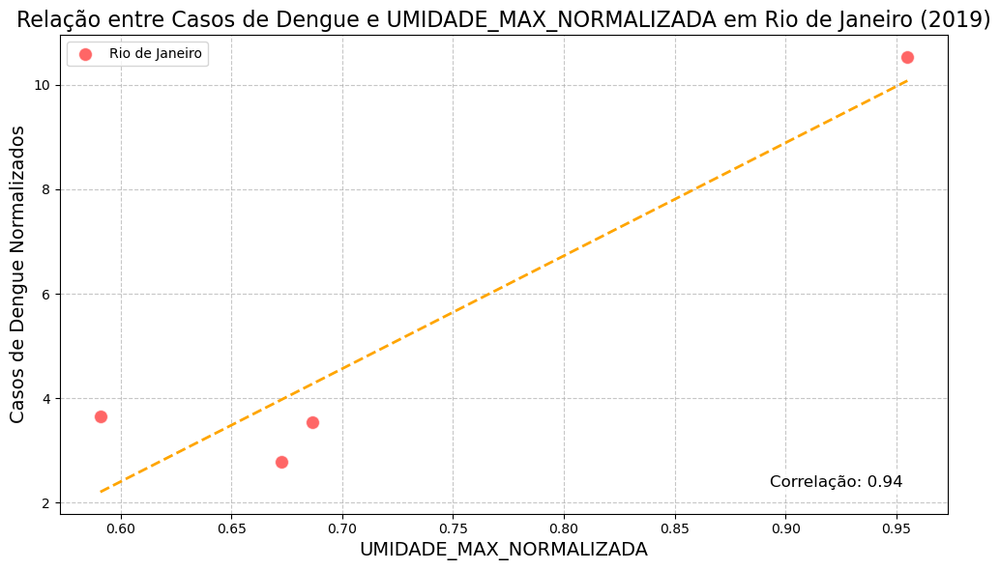

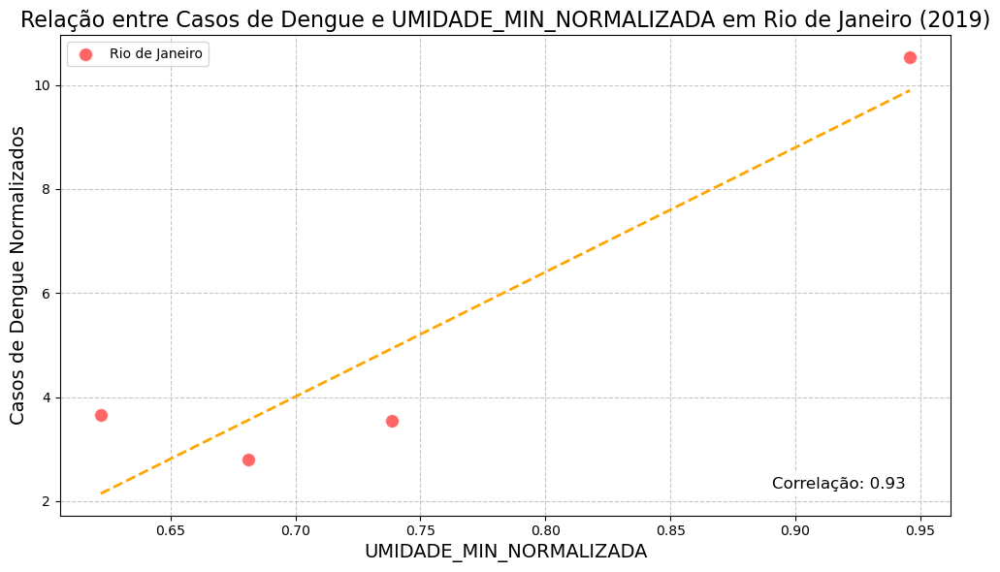

In [902]:
gerar_graficos(df_rio, features, ano, 'Rio de Janeiro')

## **Rio de Janeiro(RJ) e Distrito Federal(DF)**

In [903]:
analise_descritiva(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1919.060000,25953145.710000,0.040000,19.510000,0.110000,0.330000,0.330000,0.230000,0.220000
std,3724.560000,103876187.800000,0.170000,17.930000,0.050000,0.160000,0.170000,0.200000,0.210000
min,6.000000,435600.000000,0.000000,1.380000,0.020000,0.220000,0.200000,0.030000,0.030000
25%,374.500000,3340250.000000,0.000000,8.380000,0.090000,0.240000,0.250000,0.130000,0.130000
50%,862.000000,5797400.000000,0.010000,11.810000,0.120000,0.240000,0.250000,0.160000,0.130000
75%,1973.000000,12165300.000000,0.020000,24.490000,0.120000,0.380000,0.320000,0.260000,0.240000
max,22046.000000,621122300.000000,1.000000,75.290000,0.330000,0.900000,0.930000,0.960000,0.950000


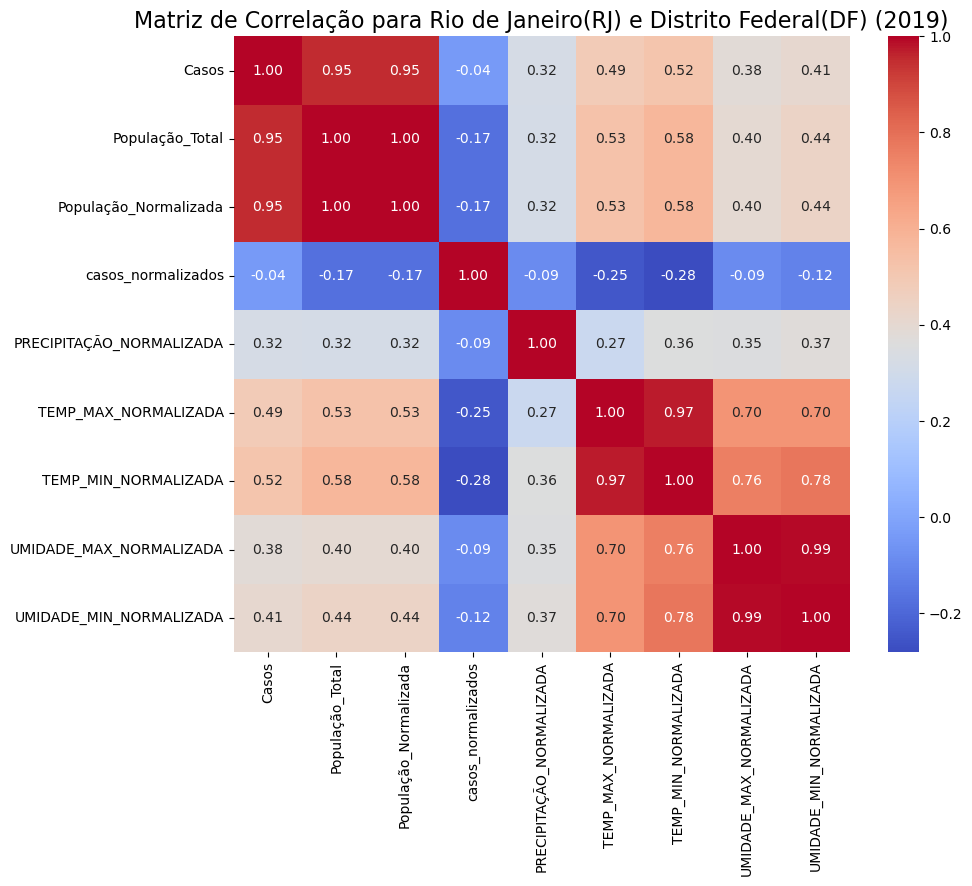

In [904]:
calcular_correlacao(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

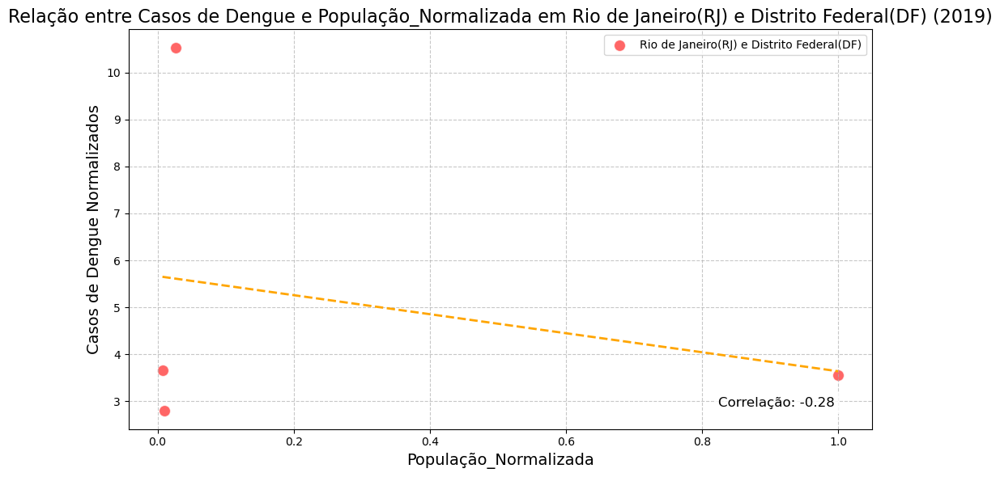

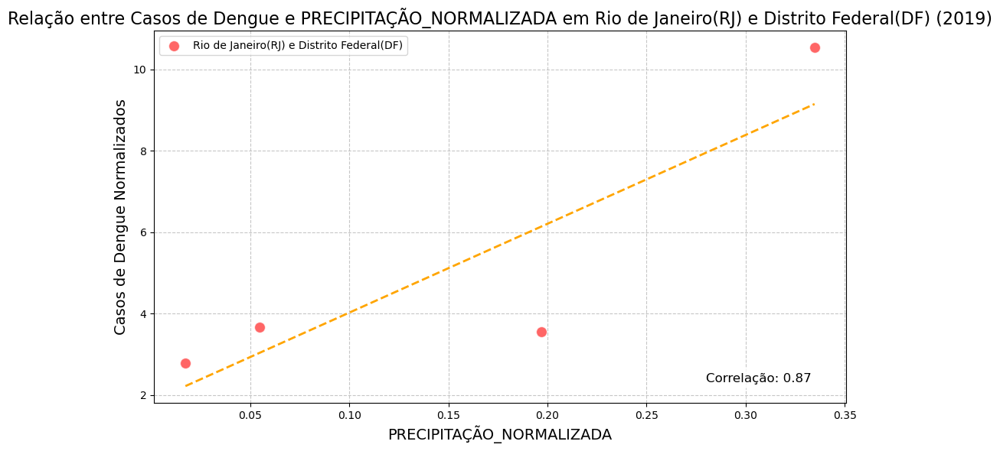

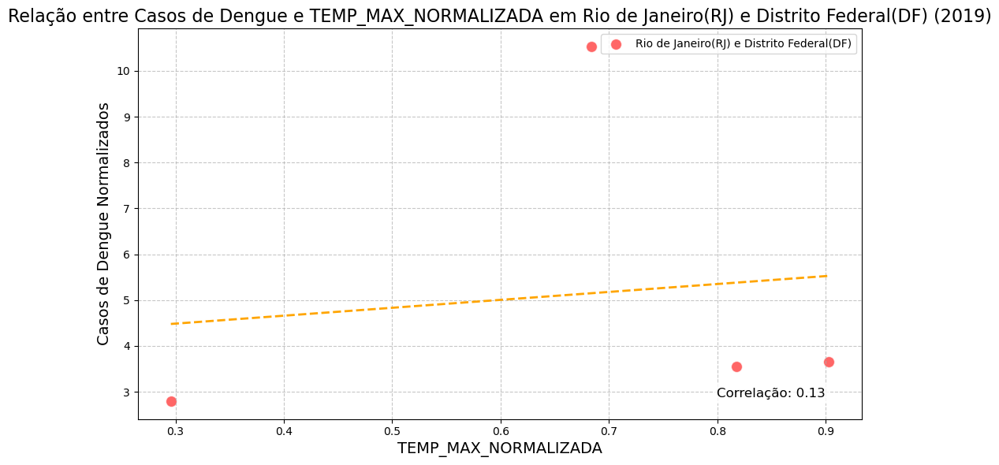

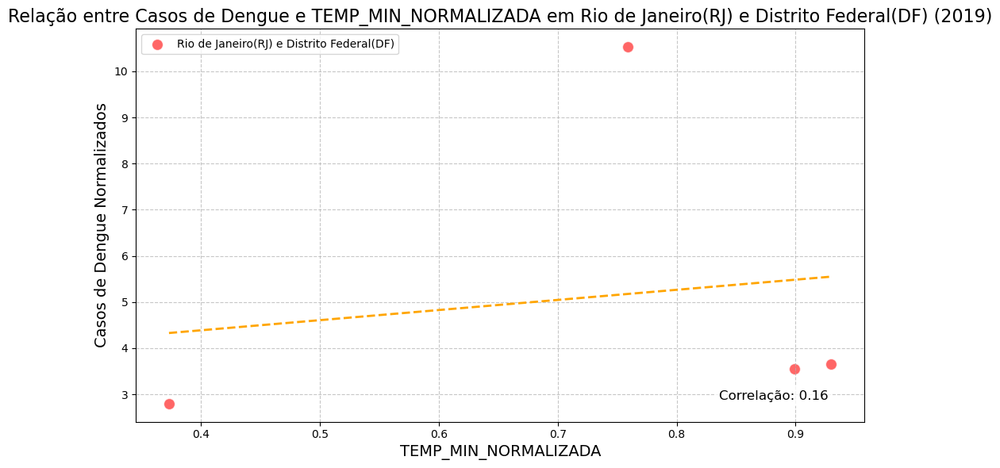

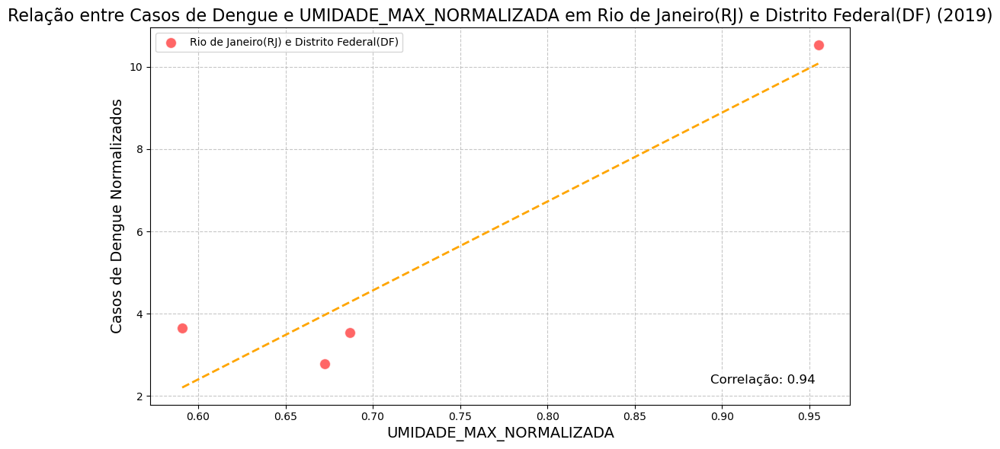

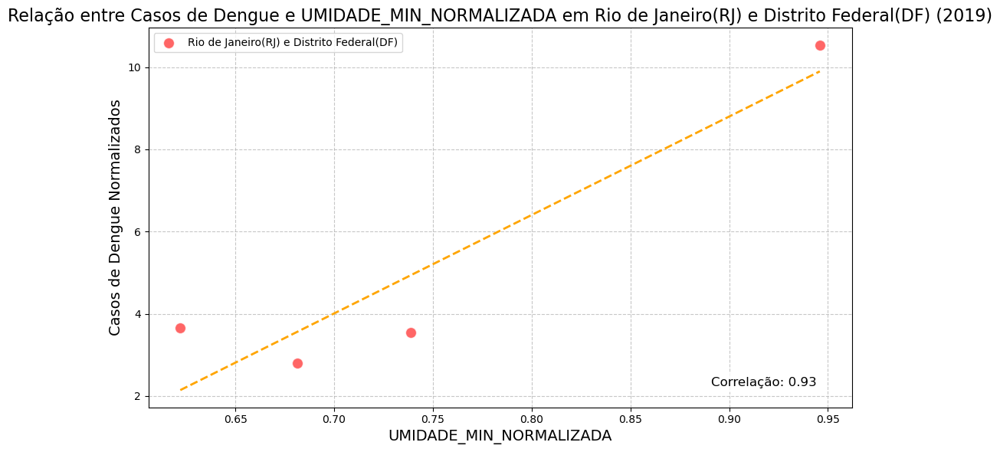

In [905]:
gerar_graficos(df_rio, features, ano, 'Rio de Janeiro(RJ) e Distrito Federal(DF)')

# **Análise Estátistica de 2020**

In [906]:
    file_path_resultados = f'tabela_saude_com_normalizacao_2020.csv'
    df = pd.read_csv(file_path_resultados)
    ano = '2020'

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

## **Distrito Federal(DF)**

In [907]:
analise_descritiva(df_df, "Distrito Federal", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,1515.290000,8350006.450000,0.010000,17.500000,0.200000,0.100000,0.140000,0.280000,0.270000
std,1500.410000,8444581.370000,0.010000,9.880000,0.050000,0.100000,0.070000,0.100000,0.090000
min,14.000000,435600.000000,0.000000,3.210000,0.160000,0.030000,0.050000,0.170000,0.160000
25%,310.000000,3110050.000000,0.000000,11.190000,0.160000,0.040000,0.100000,0.220000,0.220000
50%,648.000000,5208900.000000,0.010000,14.290000,0.170000,0.040000,0.100000,0.260000,0.260000
75%,2656.000000,11376900.000000,0.020000,21.890000,0.240000,0.130000,0.170000,0.320000,0.310000
max,5249.000000,40593200.000000,0.060000,36.690000,0.290000,0.290000,0.250000,0.490000,0.450000


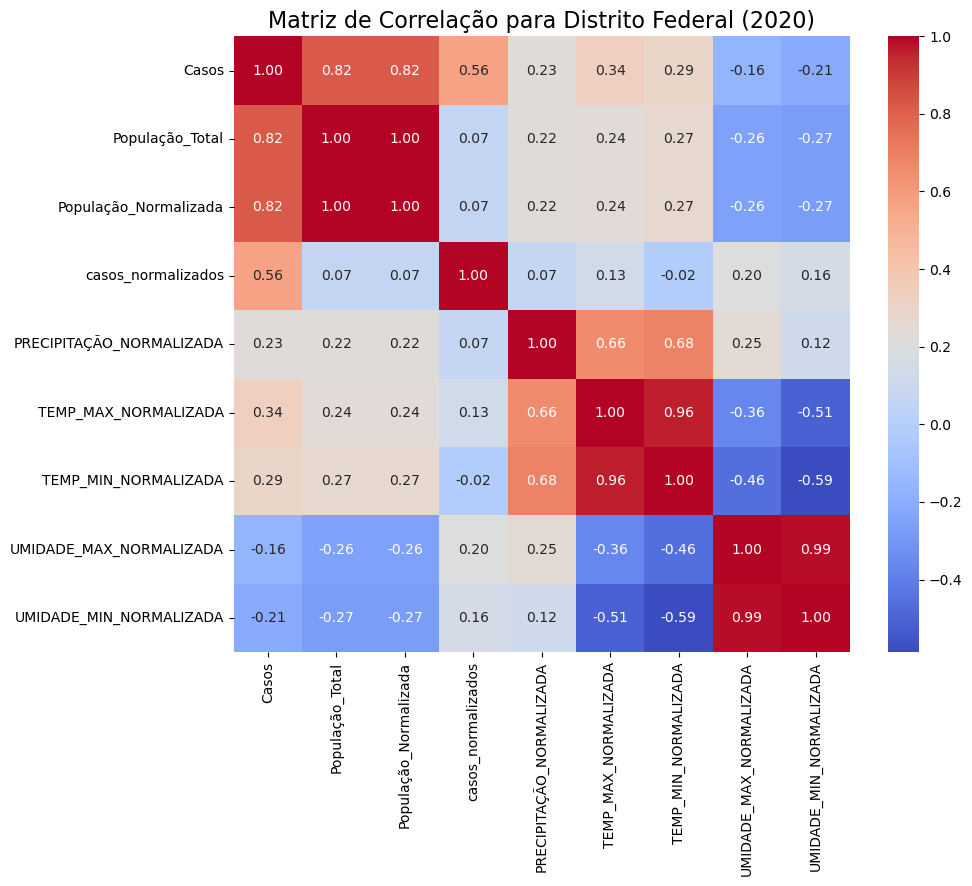

In [908]:
calcular_correlacao(df_df, "Distrito Federal", ano)

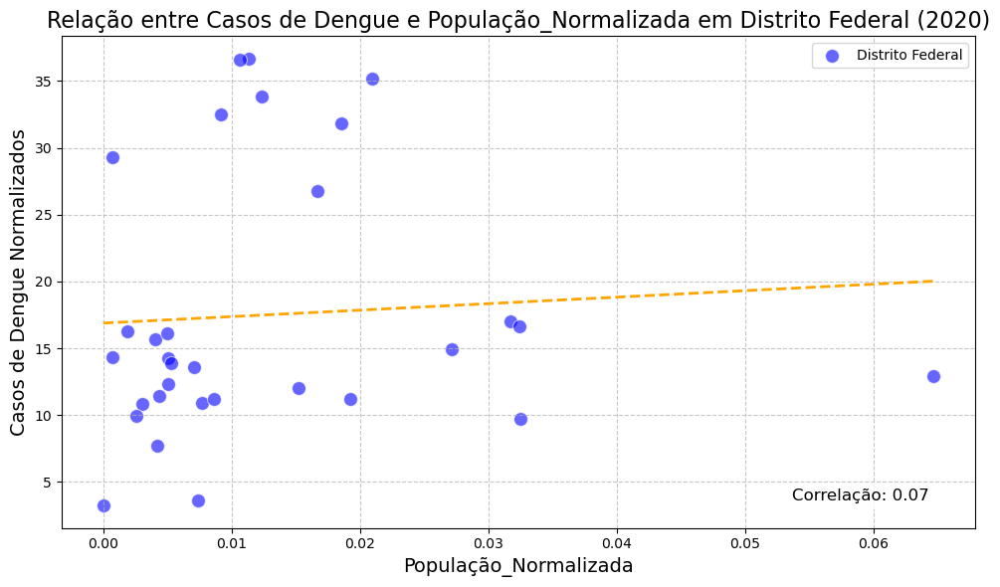

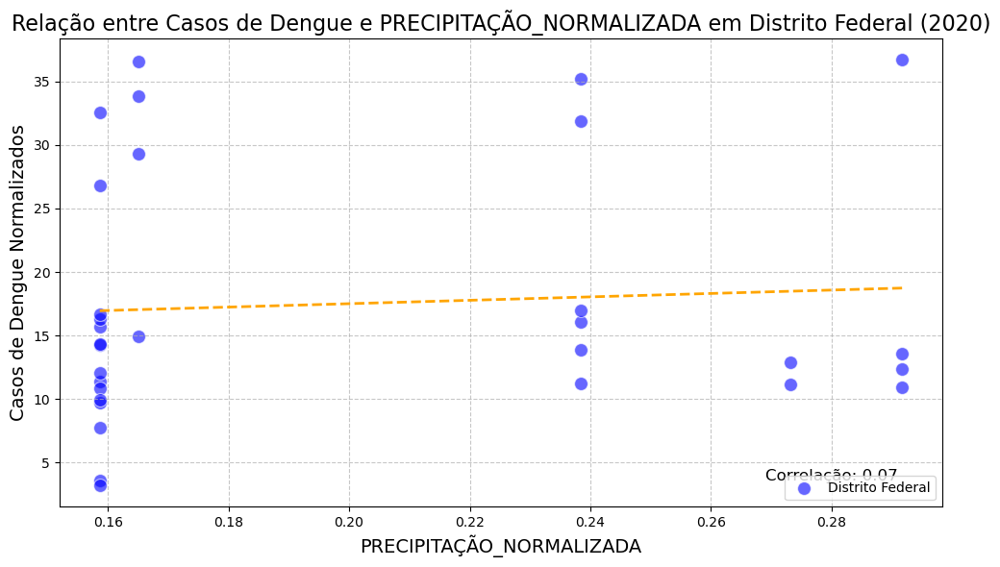

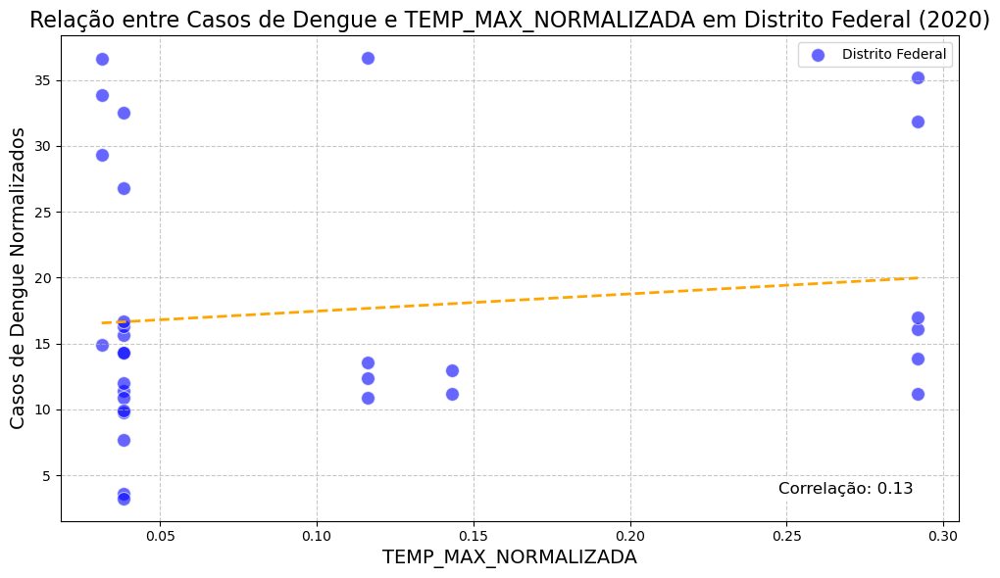

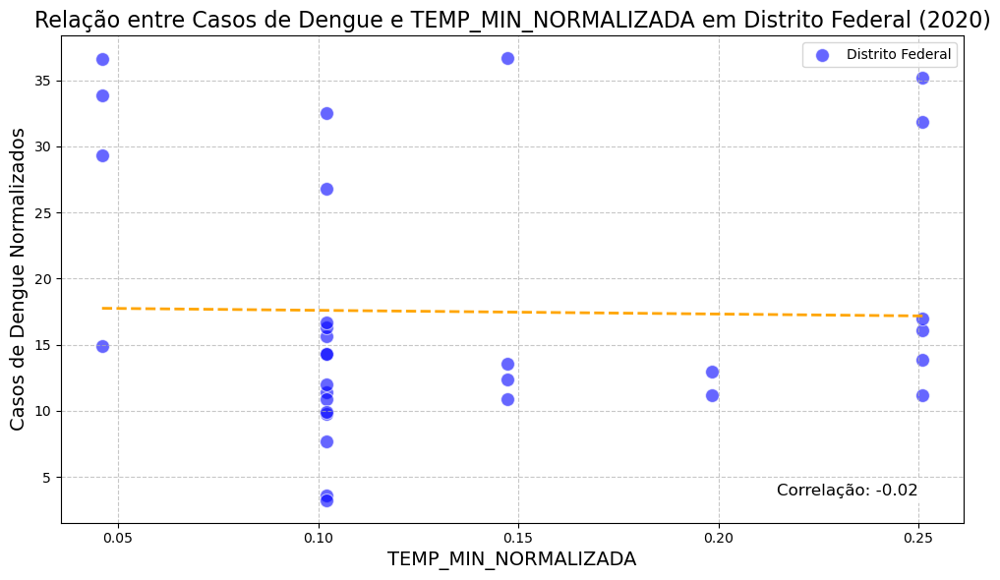

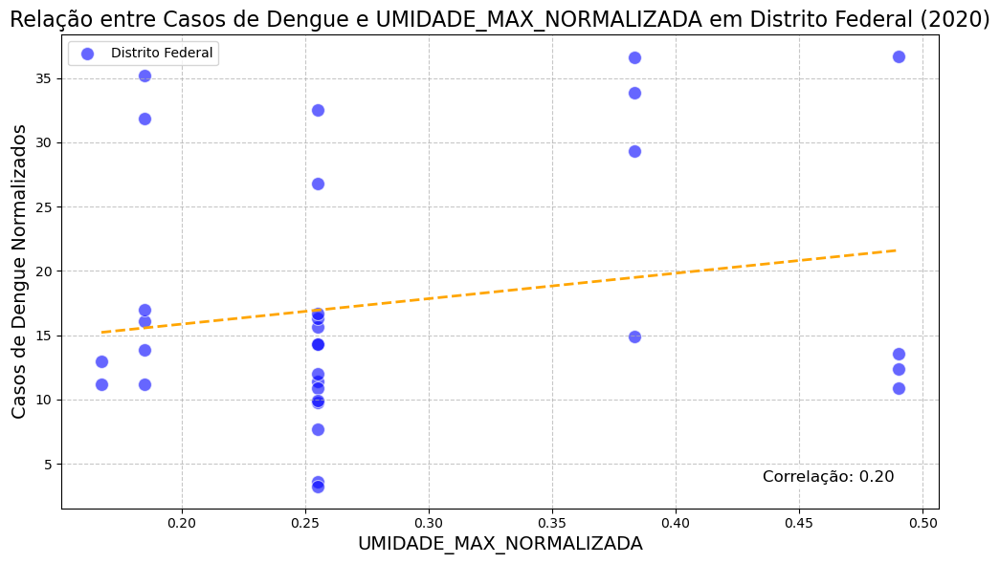

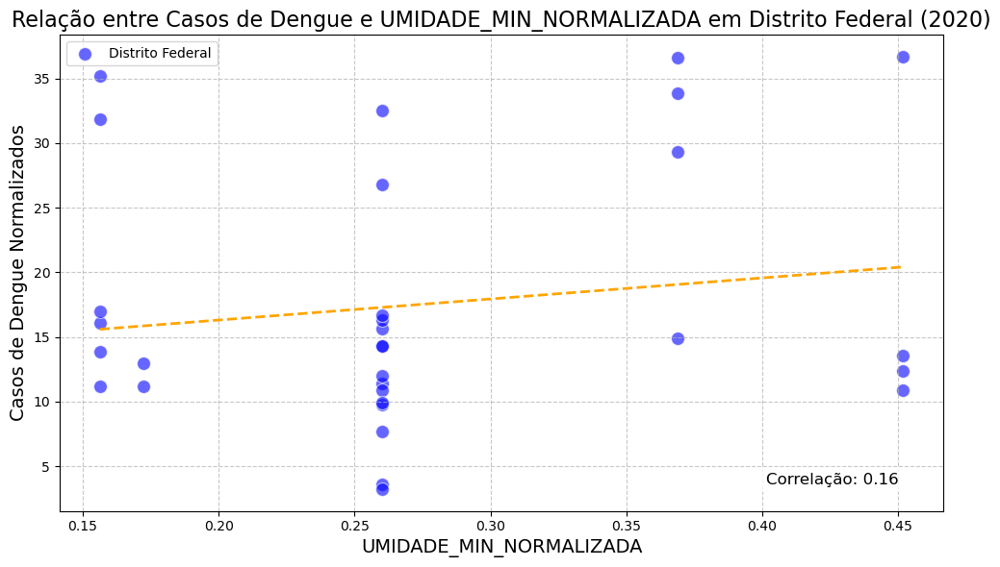

In [909]:
gerar_graficos(df_df, features, ano, 'Distrito Federal')

## **Rio de Janeiro(RJ)**

In [910]:
analise_descritiva(df_rio, "Rio de Janeiro", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,461.250000,162377475.000000,0.260000,0.820000,0.400000,0.810000,0.870000,0.810000,0.830000
std,719.810000,305874274.990000,0.490000,0.610000,0.420000,0.170000,0.140000,0.150000,0.130000
min,18.000000,4835400.000000,0.010000,0.250000,0.100000,0.640000,0.740000,0.670000,0.700000
25%,82.500000,6315450.000000,0.010000,0.340000,0.100000,0.680000,0.750000,0.700000,0.740000
50%,145.500000,11776100.000000,0.020000,0.740000,0.260000,0.810000,0.870000,0.780000,0.800000
75%,524.250000,167838125.000000,0.270000,1.220000,0.560000,0.940000,0.990000,0.880000,0.890000
max,1536.000000,621122300.000000,1.000000,1.530000,1.000000,1.000000,1.000000,1.000000,1.000000


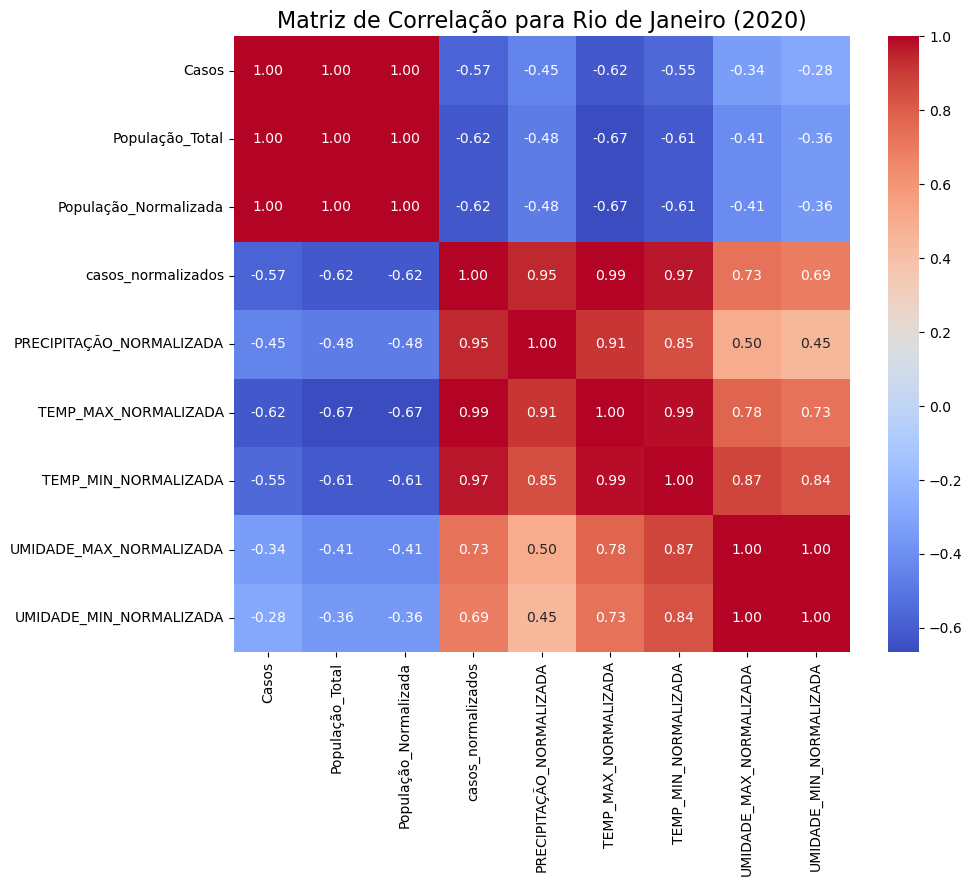

In [911]:
calcular_correlacao(df_rio, "Rio de Janeiro", ano)

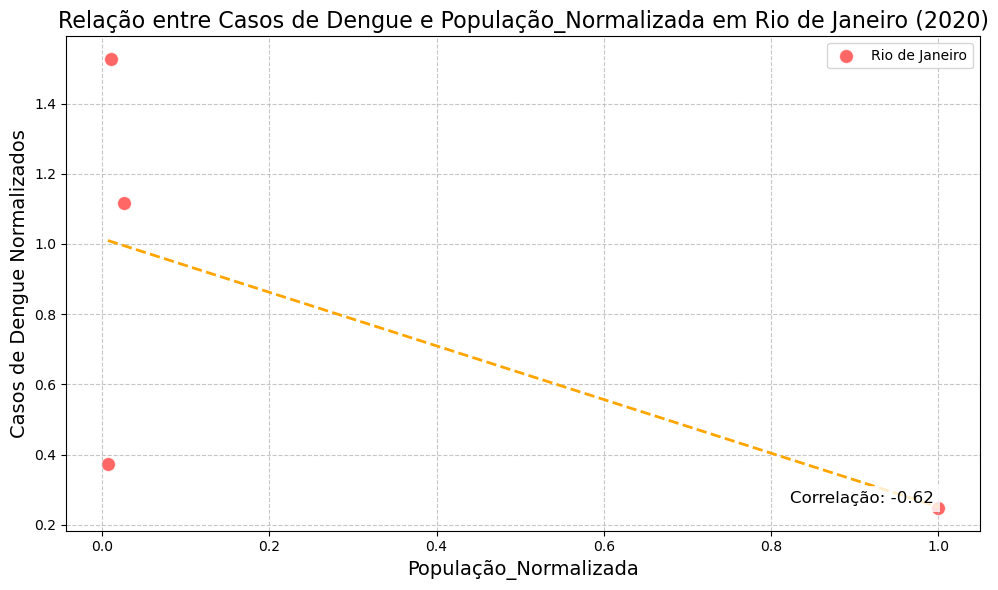

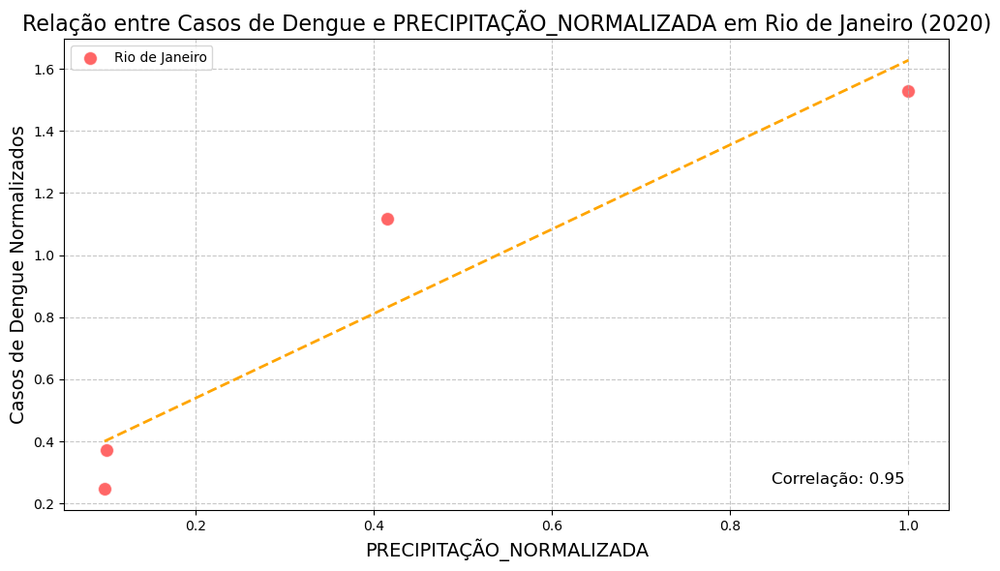

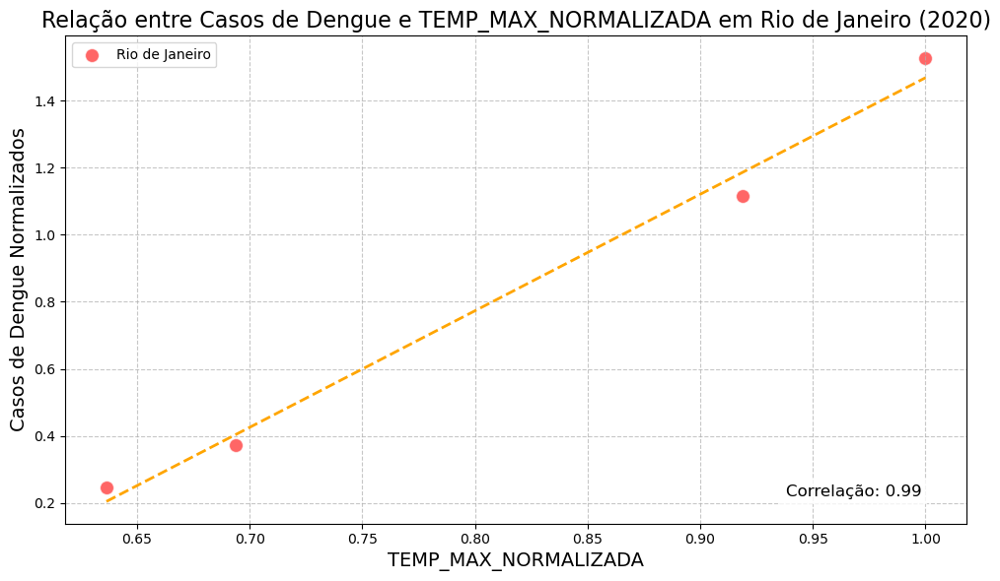

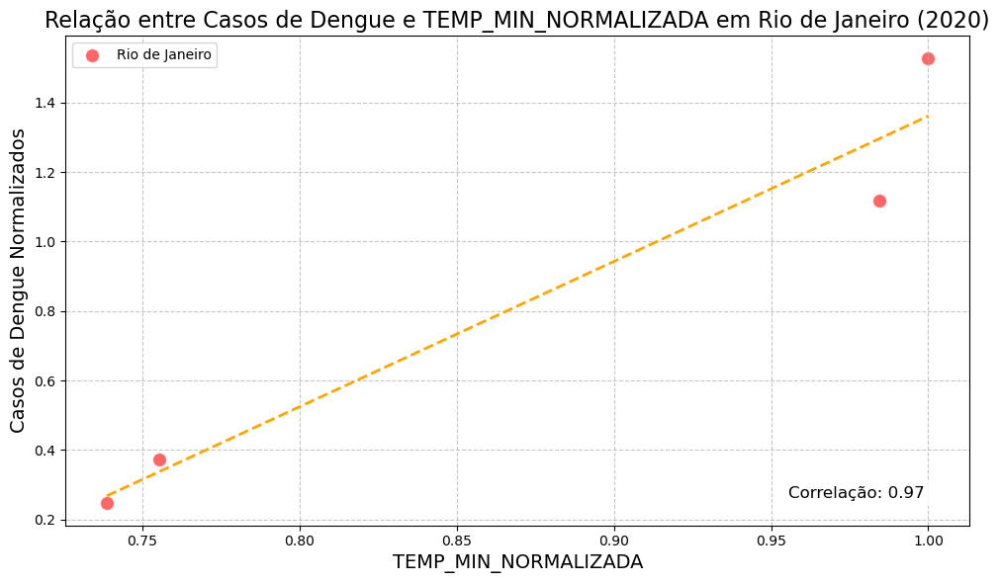

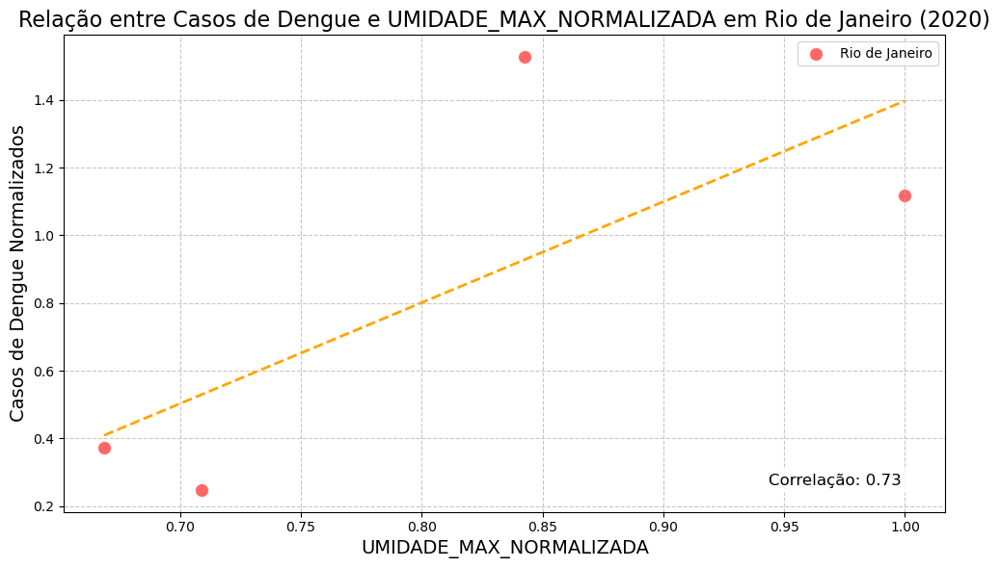

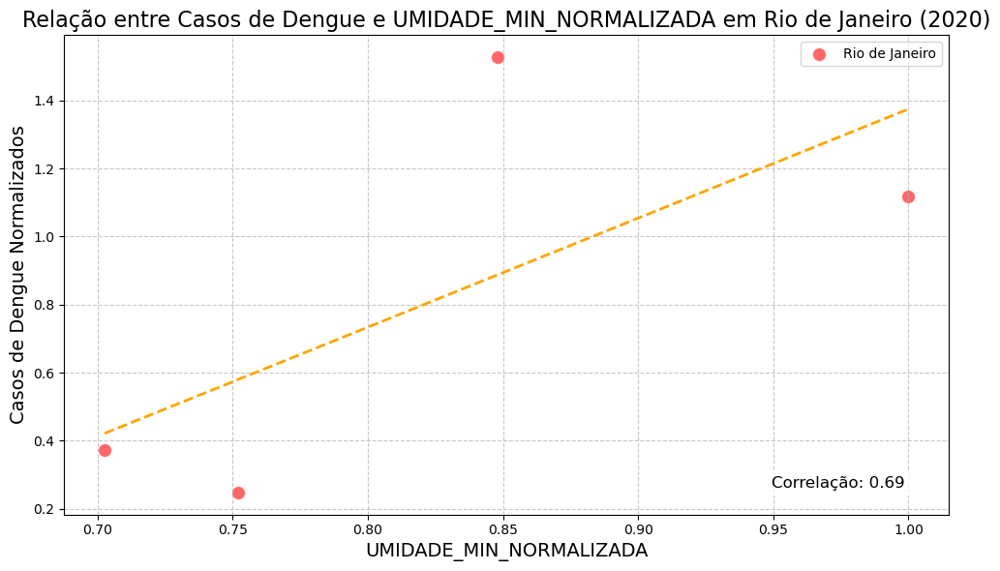

In [912]:
gerar_graficos(df_rio, features, ano, 'Rio de Janeiro')

## **Rio de Janeiro(RJ) e Distrito Federal(DF)**

In [913]:
analise_descritiva(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1394.830000,25953145.710000,0.040000,15.590000,0.220000,0.180000,0.220000,0.340000,0.340000
std,1465.560000,103876187.800000,0.170000,10.730000,0.150000,0.250000,0.250000,0.200000,0.200000
min,14.000000,435600.000000,0.000000,0.250000,0.100000,0.030000,0.050000,0.170000,0.160000
25%,254.000000,3340250.000000,0.000000,10.390000,0.160000,0.040000,0.100000,0.260000,0.260000
50%,568.000000,5797400.000000,0.010000,13.590000,0.170000,0.040000,0.100000,0.260000,0.260000
75%,2573.500000,12165300.000000,0.020000,16.830000,0.240000,0.290000,0.250000,0.380000,0.370000
max,5249.000000,621122300.000000,1.000000,36.690000,1.000000,1.000000,1.000000,1.000000,1.000000


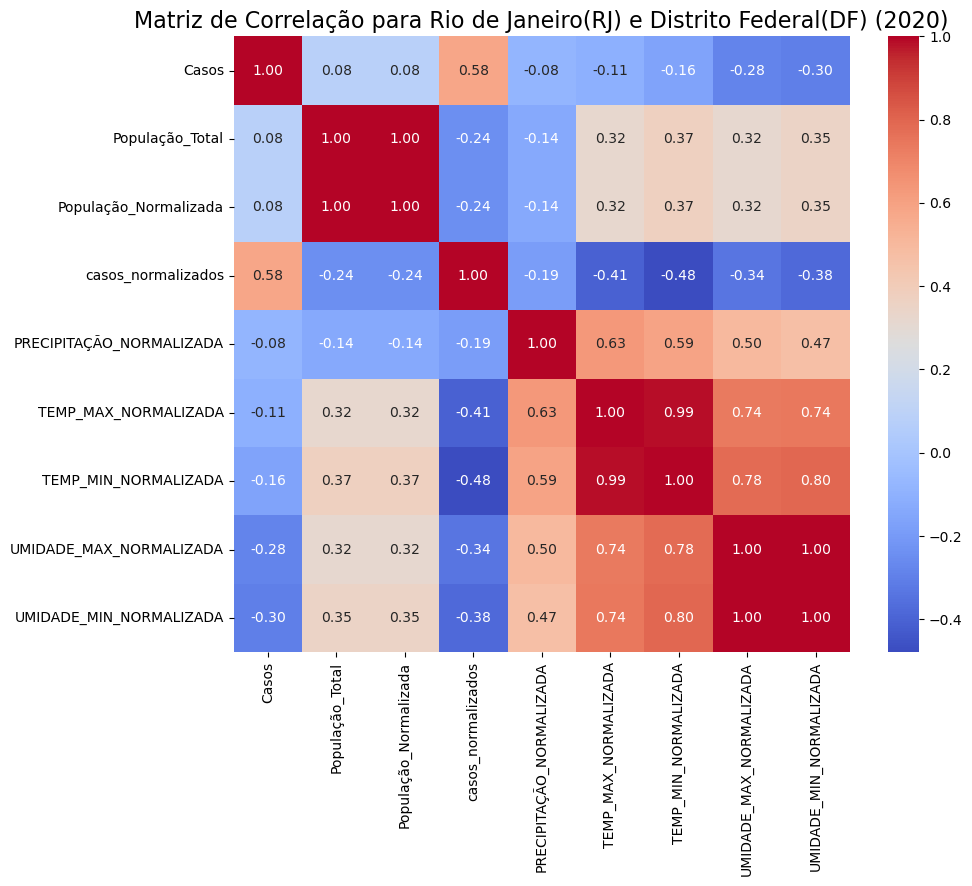

In [914]:
calcular_correlacao(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

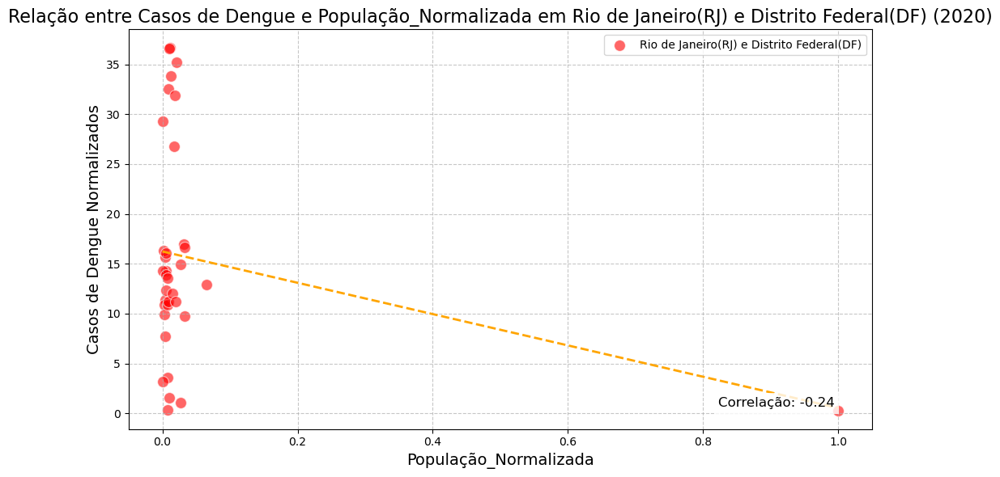

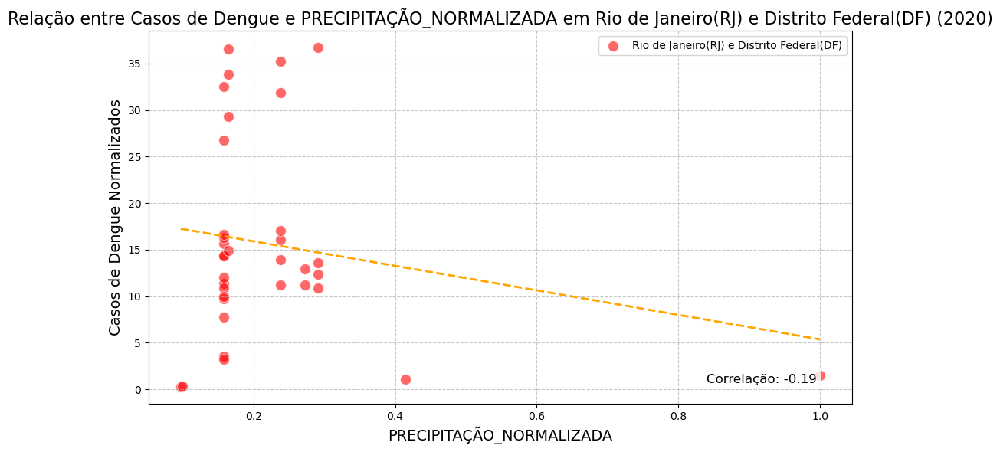

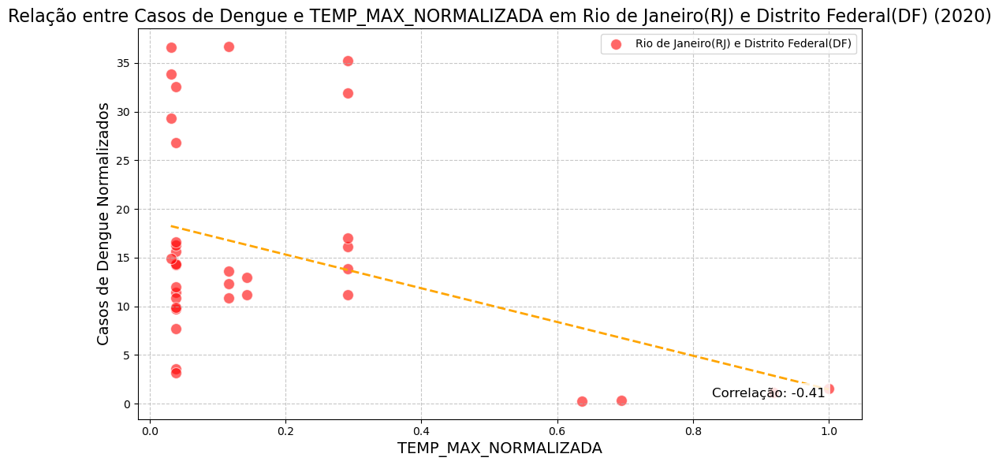

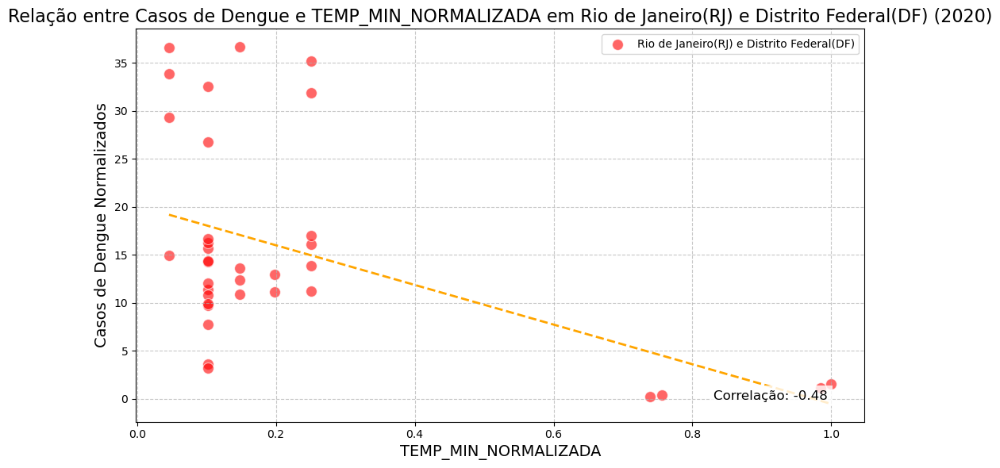

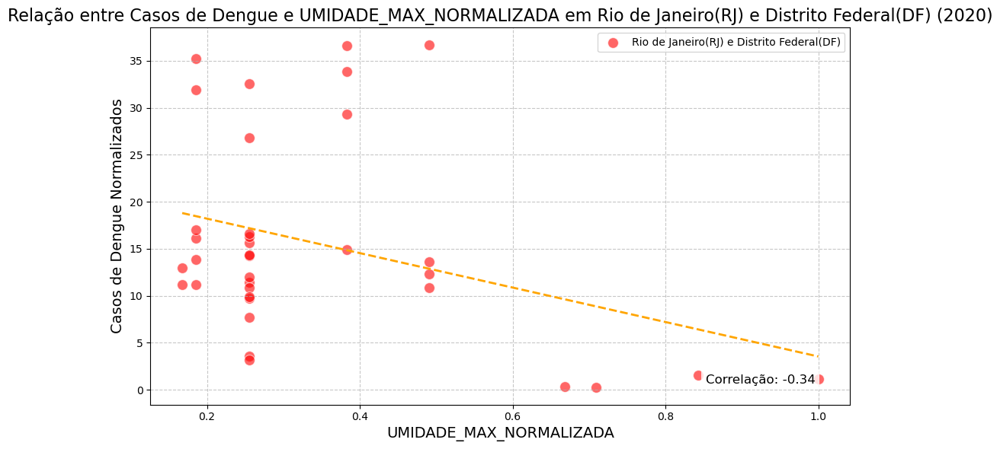

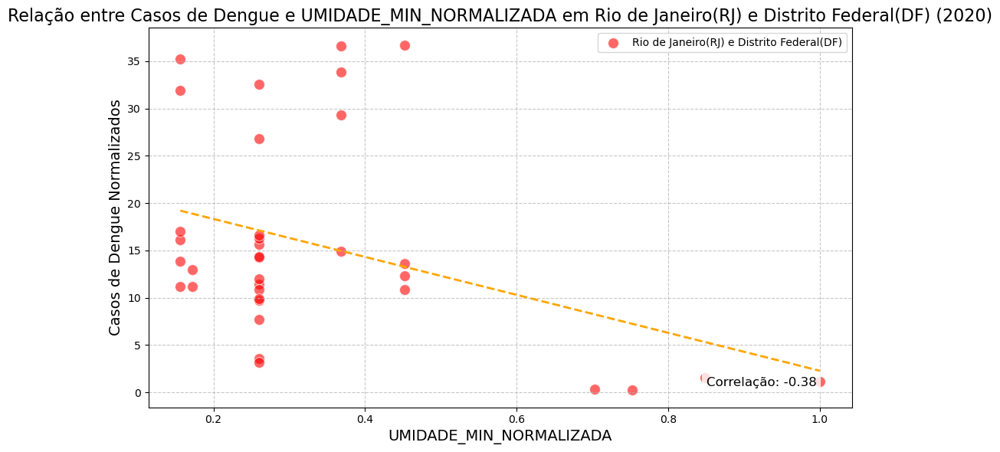

In [915]:
gerar_graficos(df_relevante, features, ano, 'Rio de Janeiro(RJ) e Distrito Federal(DF)')

# **Análise Estátistica de 2021**

In [916]:
    file_path_resultados = f'tabela_saude_com_normalizacao_2021.csv'
    df = pd.read_csv(file_path_resultados)
    ano = '2021'

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

## **Distrito Federal(DF)**

In [917]:
analise_descritiva(df_df, "Distrito Federal", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,523.610000,8350006.450000,0.010000,6.210000,0.210000,0.080000,0.100000,0.200000,0.180000
std,695.890000,8444581.370000,0.010000,5.320000,0.060000,0.100000,0.070000,0.080000,0.070000
min,12.000000,435600.000000,0.000000,1.810000,0.130000,0.000000,0.000000,0.080000,0.080000
25%,100.500000,3110050.000000,0.000000,2.940000,0.130000,0.010000,0.060000,0.150000,0.140000
50%,244.000000,5208900.000000,0.010000,4.040000,0.250000,0.010000,0.060000,0.200000,0.190000
75%,655.000000,11376900.000000,0.020000,7.530000,0.250000,0.140000,0.180000,0.240000,0.230000
max,3395.000000,40593200.000000,0.060000,22.960000,0.260000,0.260000,0.210000,0.330000,0.300000


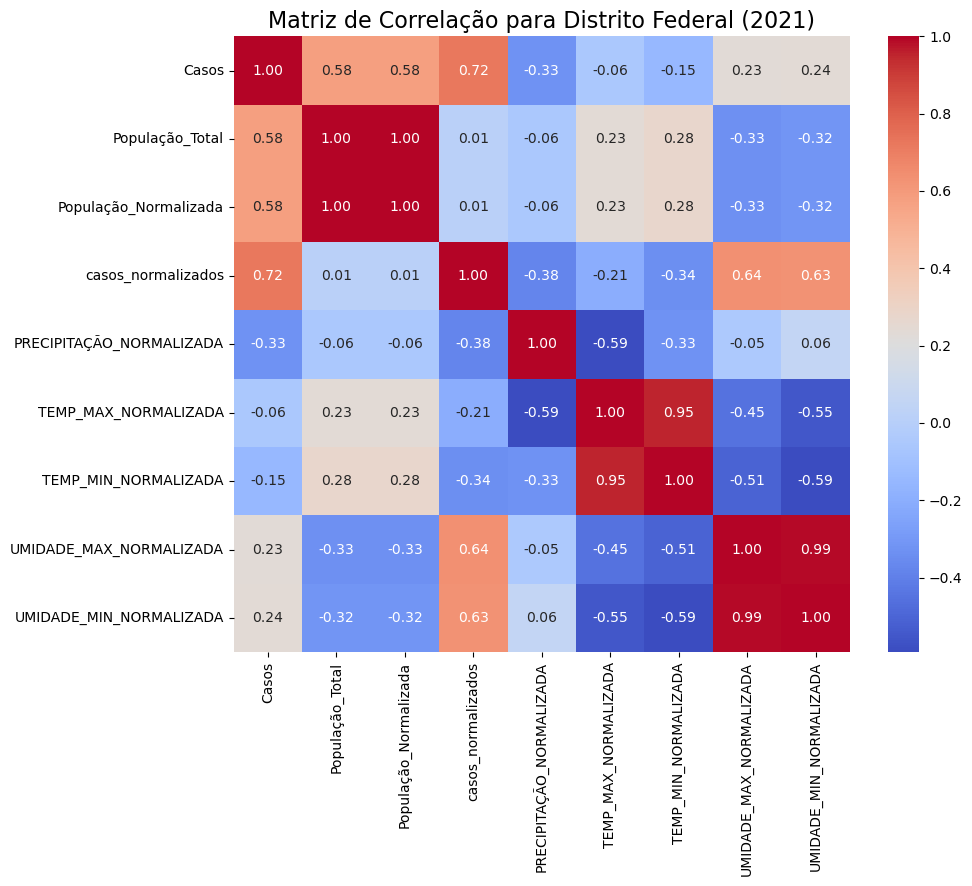

In [918]:
calcular_correlacao(df_df, "Distrito Federal", ano)

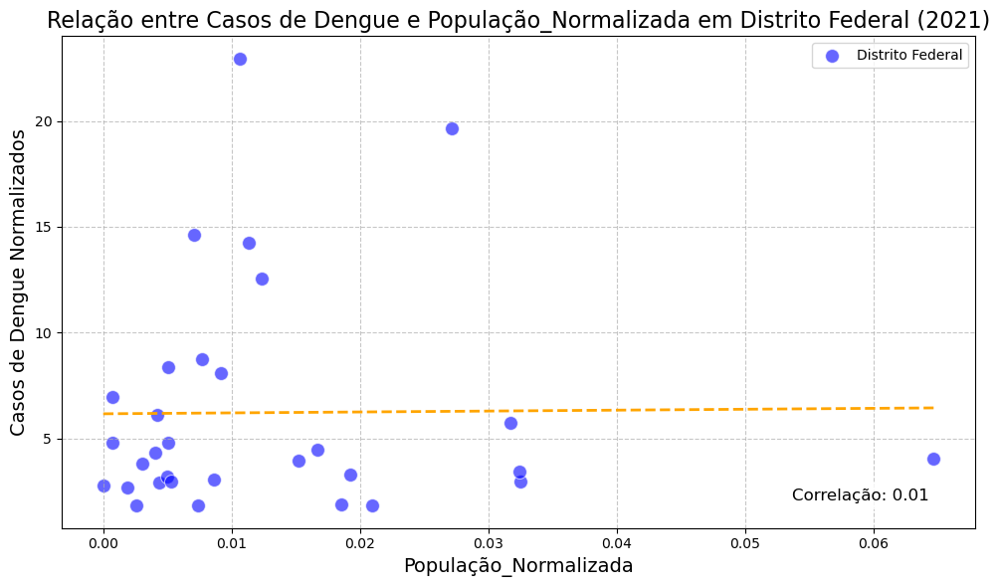

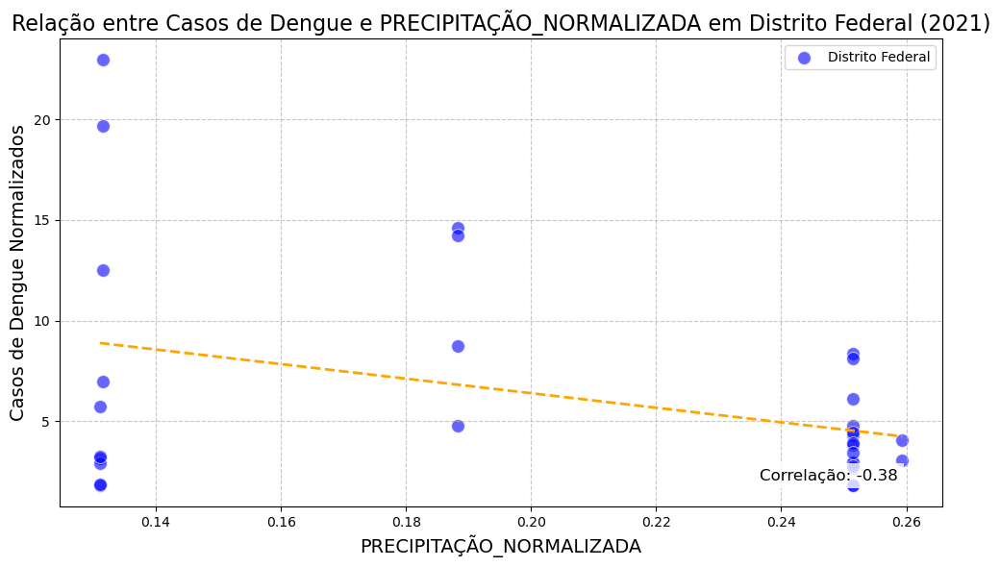

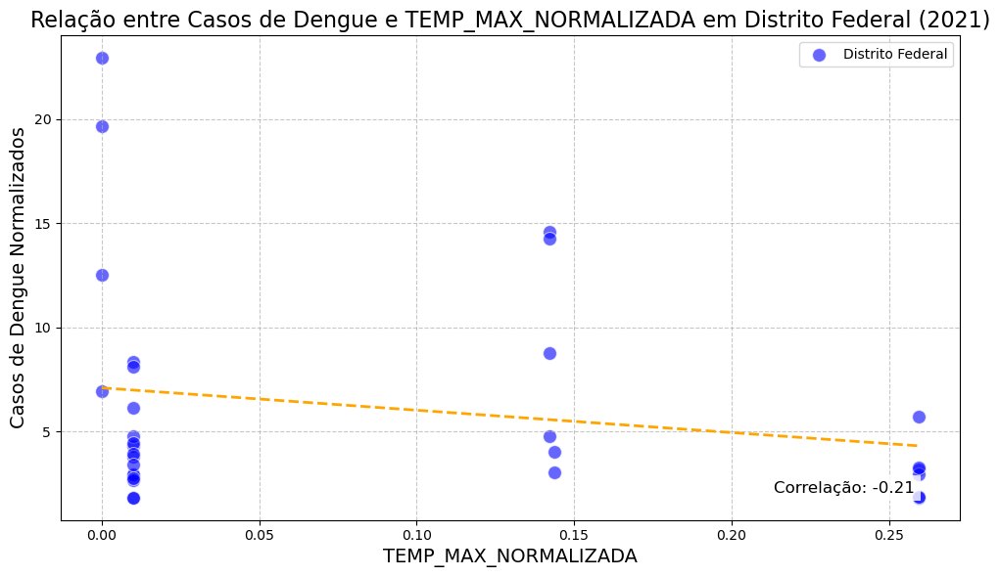

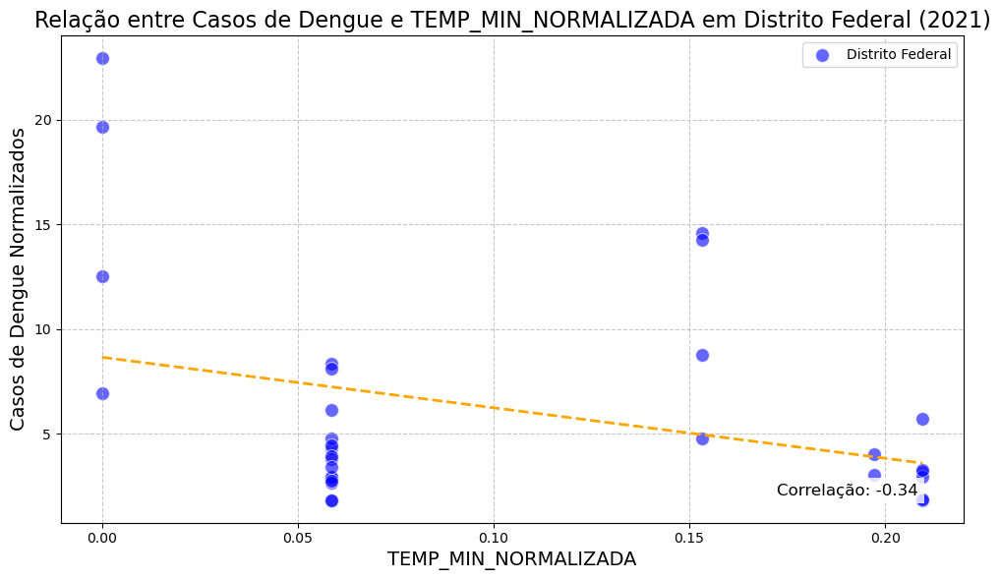

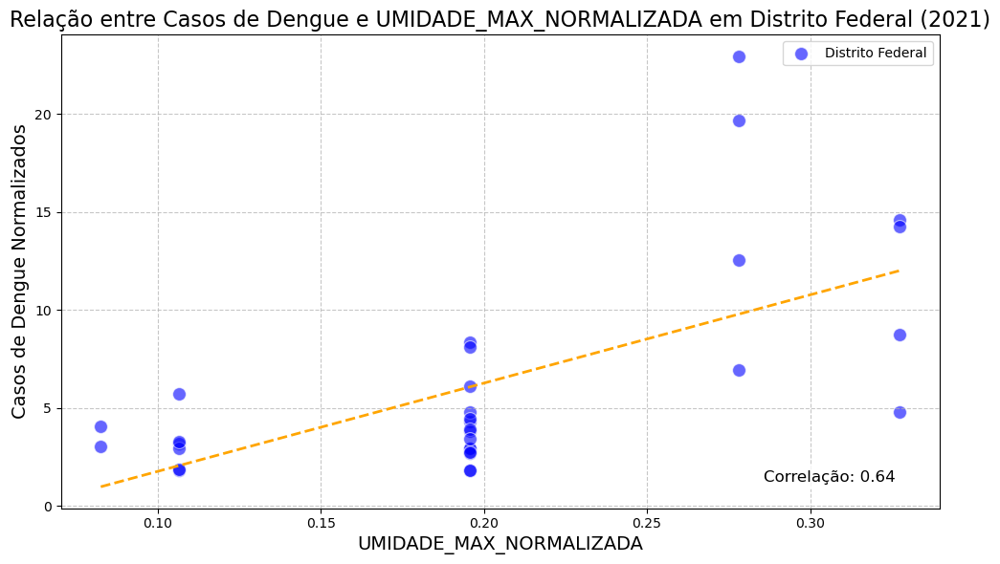

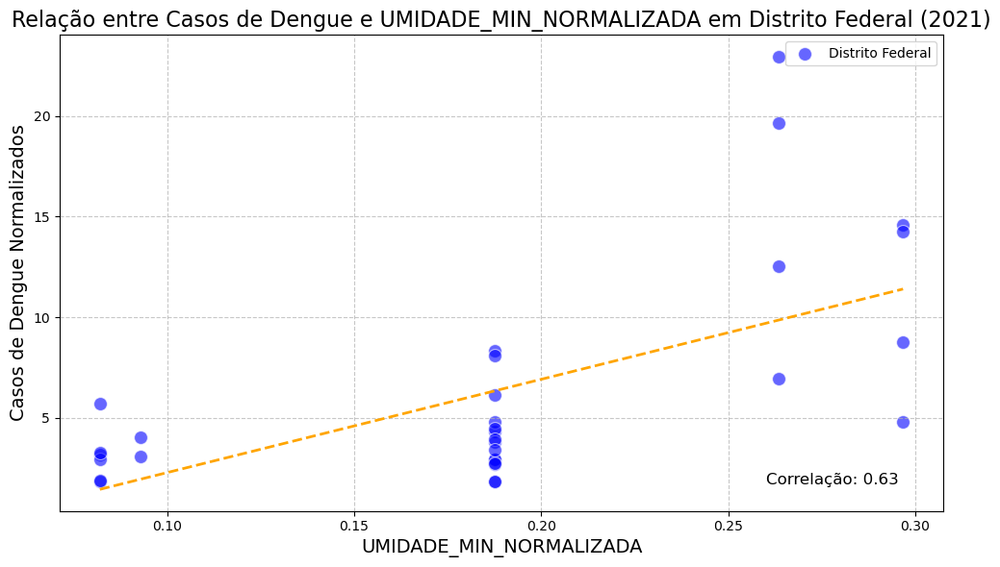

In [919]:
gerar_graficos(df_df, features, ano, 'Distrito Federal')

## **Rio de Janeiro(RJ)**

In [920]:
analise_descritiva(df_rio, "Rio de Janeiro", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,386.000000,162377475.000000,0.260000,1.030000,0.100000,0.420000,0.500000,0.740000,0.750000
std,579.360000,305874274.990000,0.490000,0.770000,0.040000,0.290000,0.260000,0.080000,0.050000
min,91.000000,4835400.000000,0.010000,0.200000,0.080000,0.000000,0.110000,0.680000,0.700000
25%,93.250000,6315450.000000,0.010000,0.520000,0.080000,0.360000,0.470000,0.680000,0.700000
50%,99.000000,11776100.000000,0.020000,0.980000,0.090000,0.530000,0.610000,0.720000,0.750000
75%,391.750000,167838125.000000,0.270000,1.490000,0.110000,0.590000,0.650000,0.770000,0.790000
max,1255.000000,621122300.000000,1.000000,1.940000,0.160000,0.620000,0.670000,0.840000,0.800000


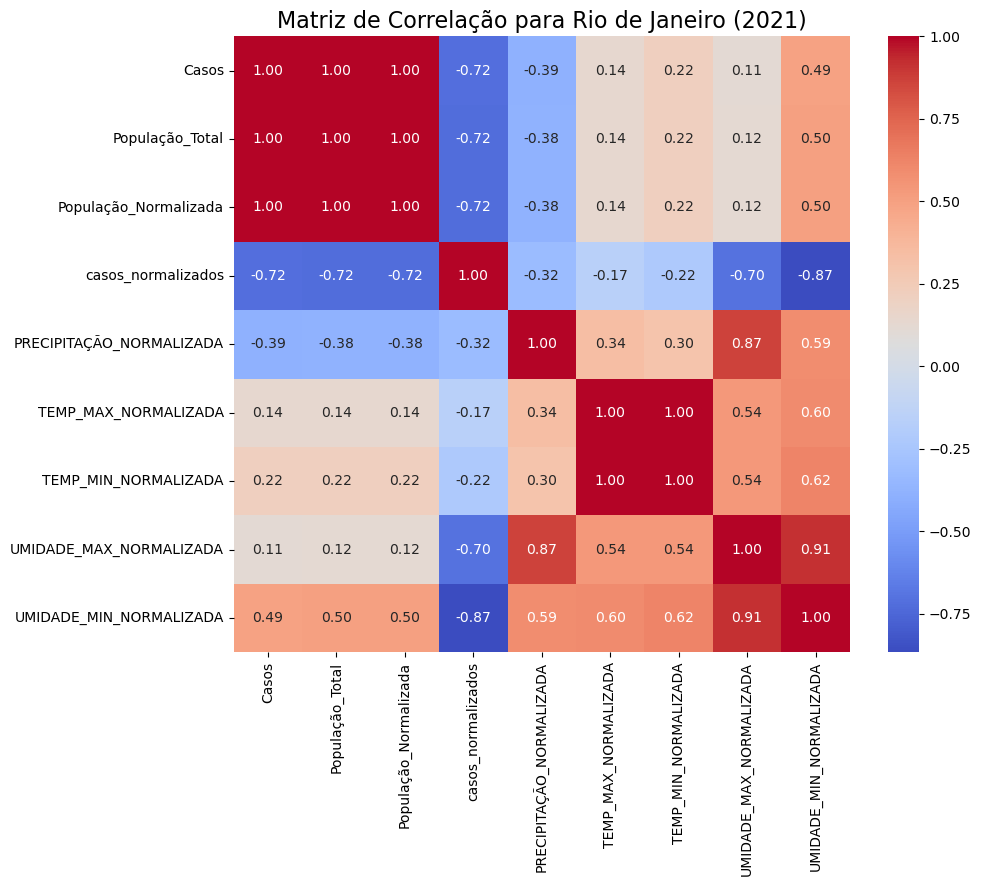

In [921]:
calcular_correlacao(df_rio, "Rio de Janeiro", ano)

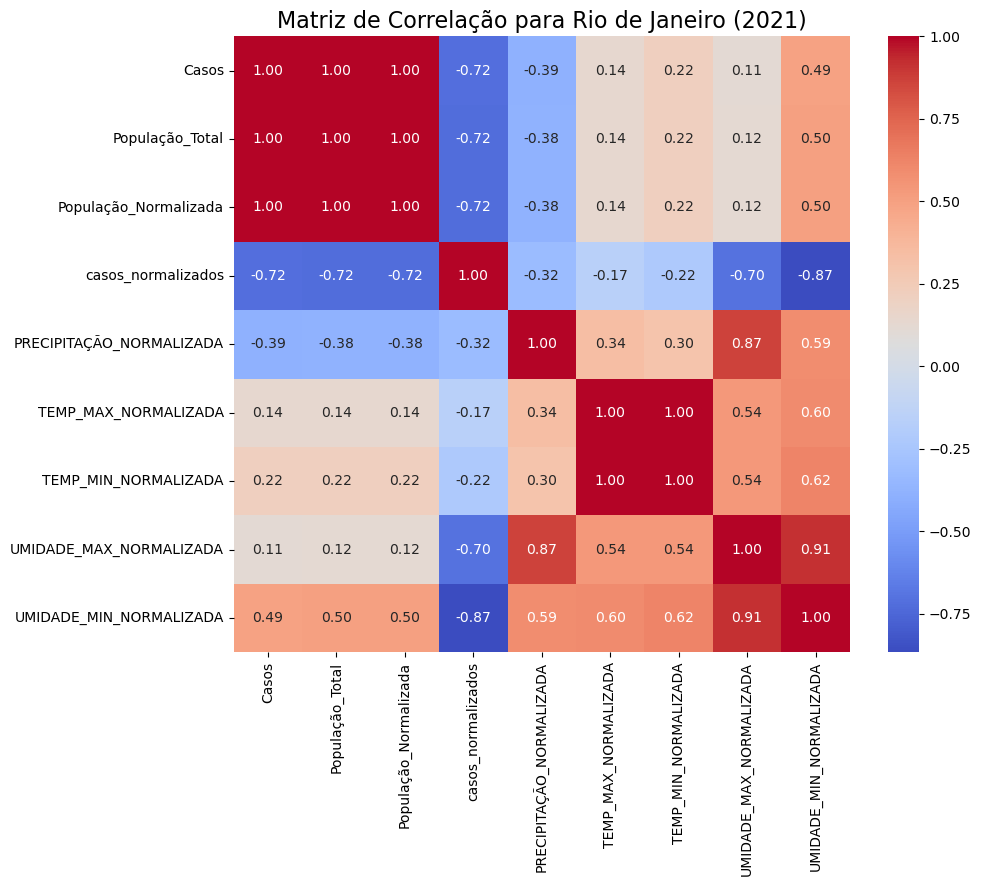

In [922]:
calcular_correlacao(df_rio, "Rio de Janeiro", ano)

## **Rio de Janeiro(RJ) e Distrito Federal(DF)**

In [923]:
analise_descritiva(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,507.890000,25953145.710000,0.040000,5.620000,0.190000,0.120000,0.150000,0.260000,0.250000
std,677.410000,103876187.800000,0.170000,5.270000,0.060000,0.170000,0.170000,0.190000,0.190000
min,12.000000,435600.000000,0.000000,0.200000,0.080000,0.000000,0.000000,0.080000,0.080000
25%,93.000000,3340250.000000,0.000000,2.720000,0.130000,0.010000,0.060000,0.200000,0.190000
50%,223.000000,5797400.000000,0.010000,3.800000,0.190000,0.010000,0.060000,0.200000,0.190000
75%,655.000000,12165300.000000,0.020000,6.540000,0.250000,0.200000,0.200000,0.280000,0.260000
max,3395.000000,621122300.000000,1.000000,22.960000,0.260000,0.620000,0.670000,0.840000,0.800000


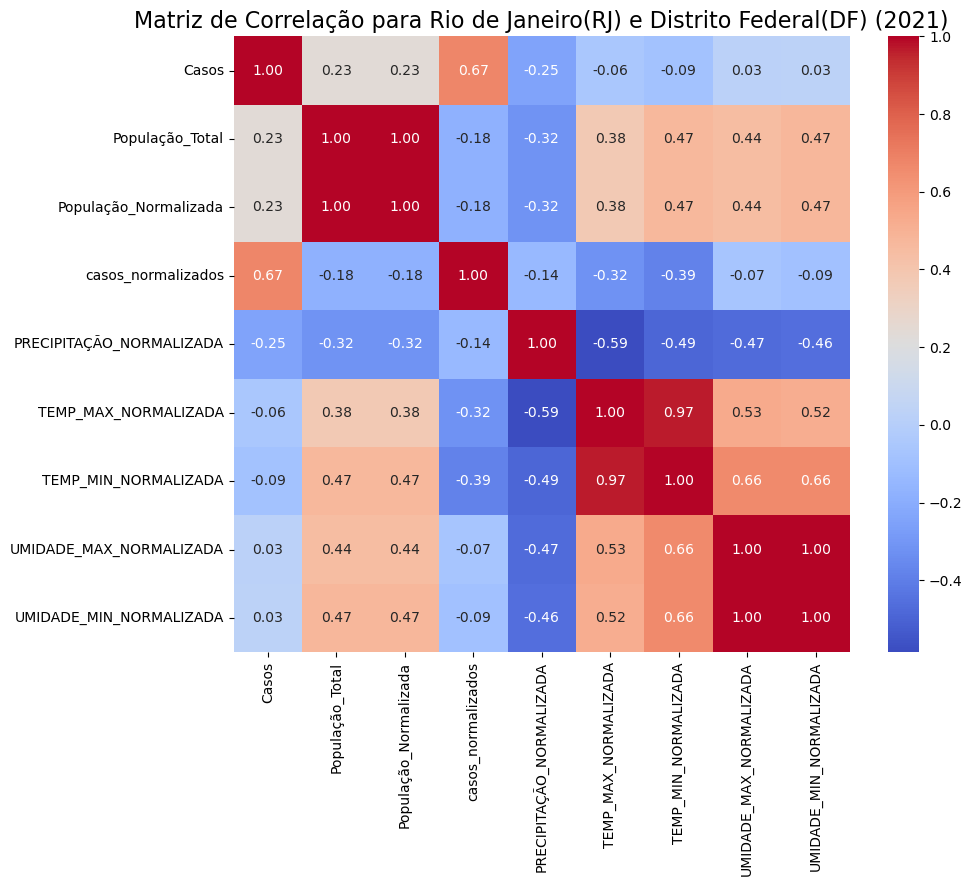

In [924]:
calcular_correlacao(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

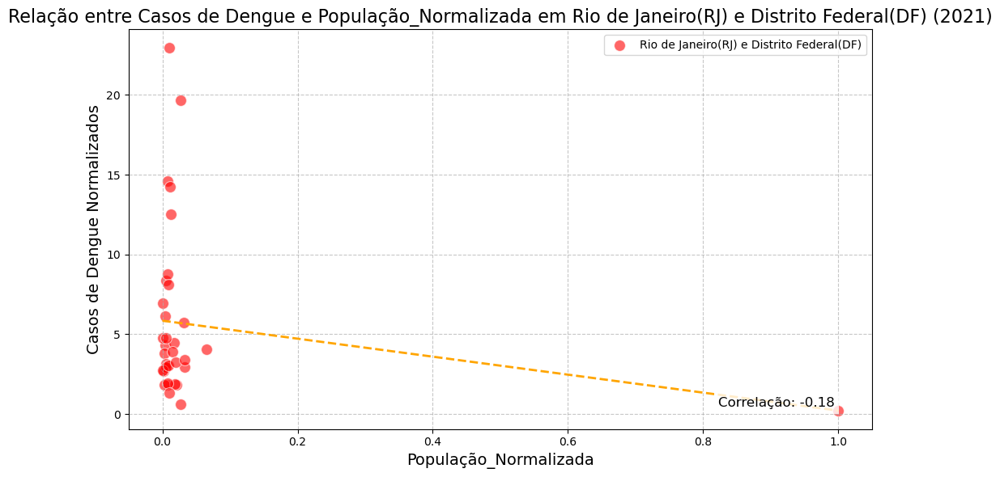

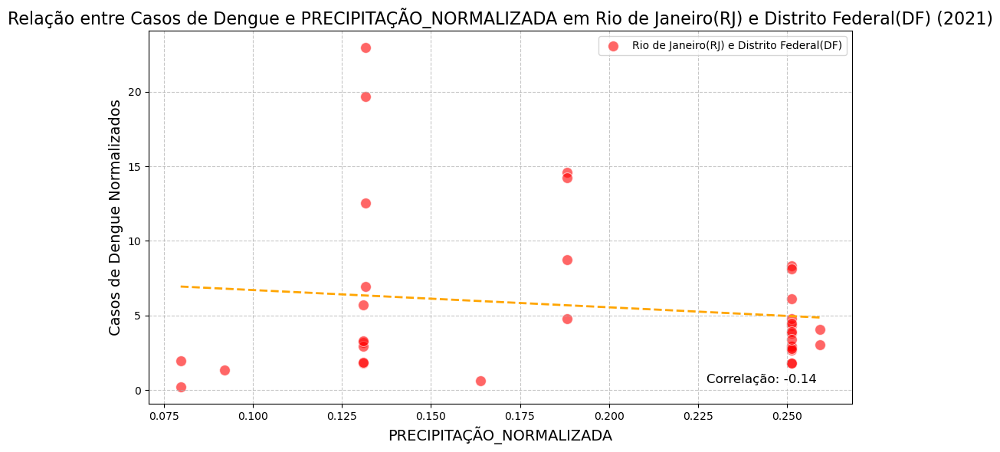

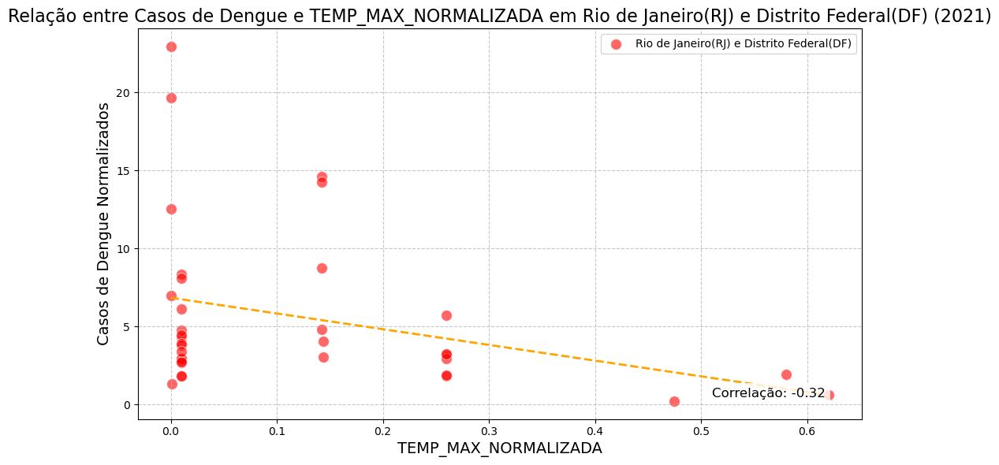

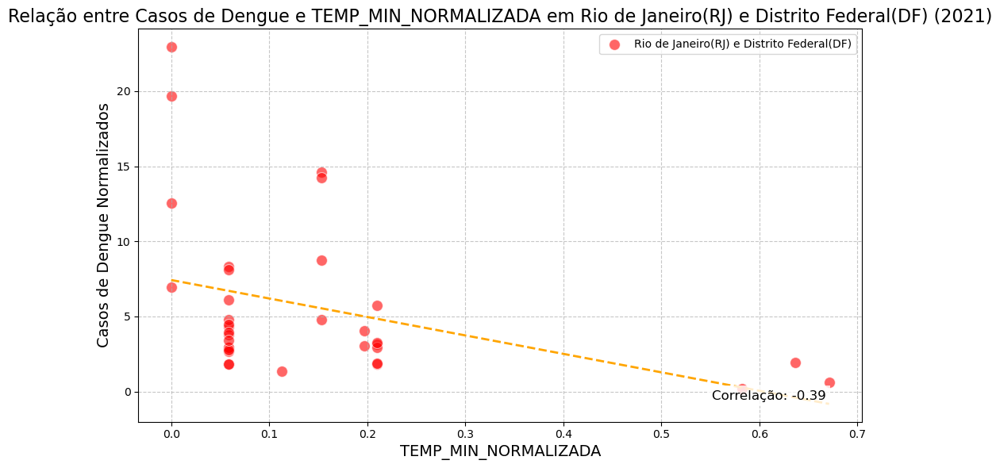

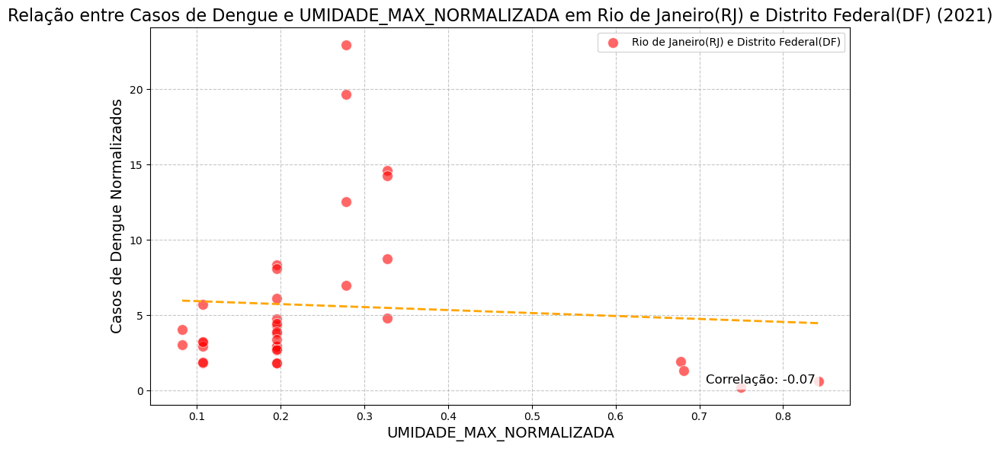

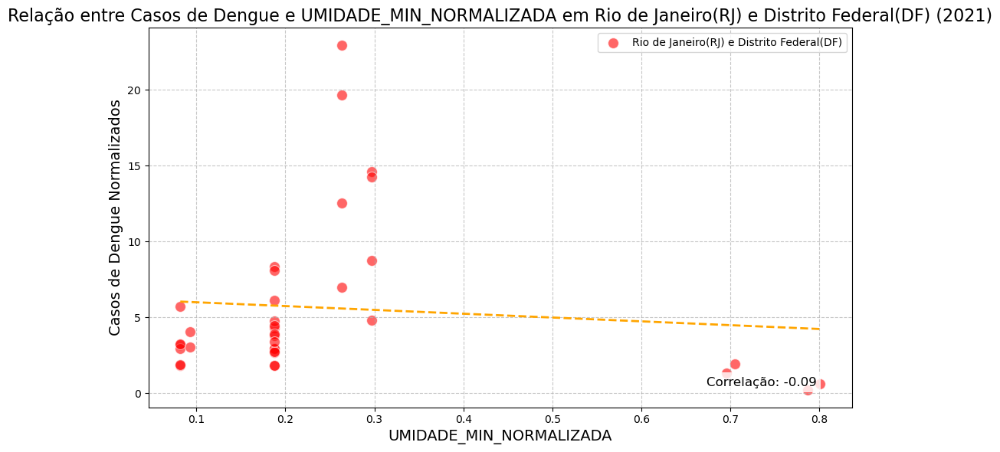

In [925]:
gerar_graficos(df_relevante, features, ano, 'Rio de Janeiro(RJ) e Distrito Federal(DF)')

# **Análise Estátistica de 2022**

In [926]:
    file_path_resultados = f'tabela_saude_com_normalizacao_2022.csv'
    df = pd.read_csv(file_path_resultados)
    ano = '2022'

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

## **Distrito Federal(DF)**

In [927]:
analise_descritiva(df_df, "Distrito Federal", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,1872.970000,8350006.450000,0.010000,20.750000,0.110000,0.090000,0.100000,0.110000,0.110000
std,2355.210000,8444581.370000,0.010000,11.060000,0.020000,0.100000,0.070000,0.080000,0.080000
min,11.000000,435600.000000,0.000000,2.530000,0.060000,0.010000,0.000000,0.000000,0.000000
25%,516.000000,3110050.000000,0.000000,14.490000,0.110000,0.020000,0.060000,0.060000,0.070000
50%,848.000000,5208900.000000,0.010000,18.280000,0.110000,0.020000,0.060000,0.100000,0.110000
75%,2316.500000,11376900.000000,0.020000,26.790000,0.120000,0.120000,0.150000,0.160000,0.150000
max,11499.000000,40593200.000000,0.060000,45.820000,0.130000,0.270000,0.220000,0.250000,0.230000


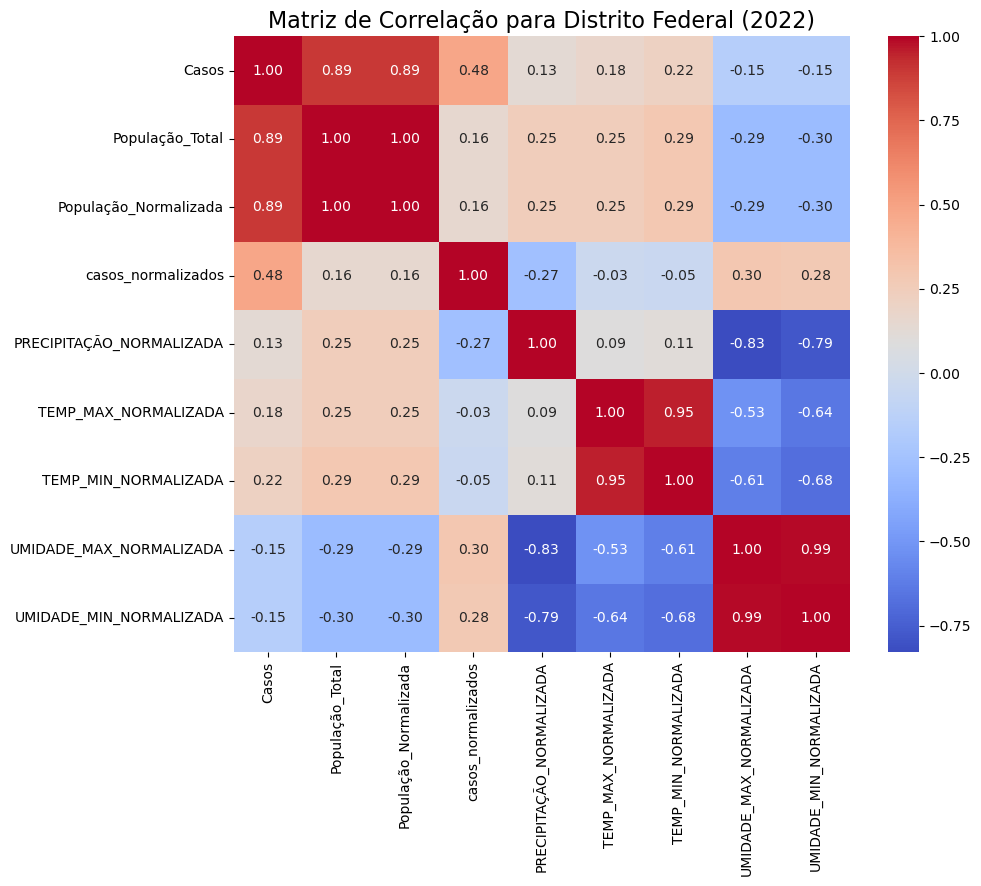

In [928]:
calcular_correlacao(df_df, "Distrito Federal", ano)

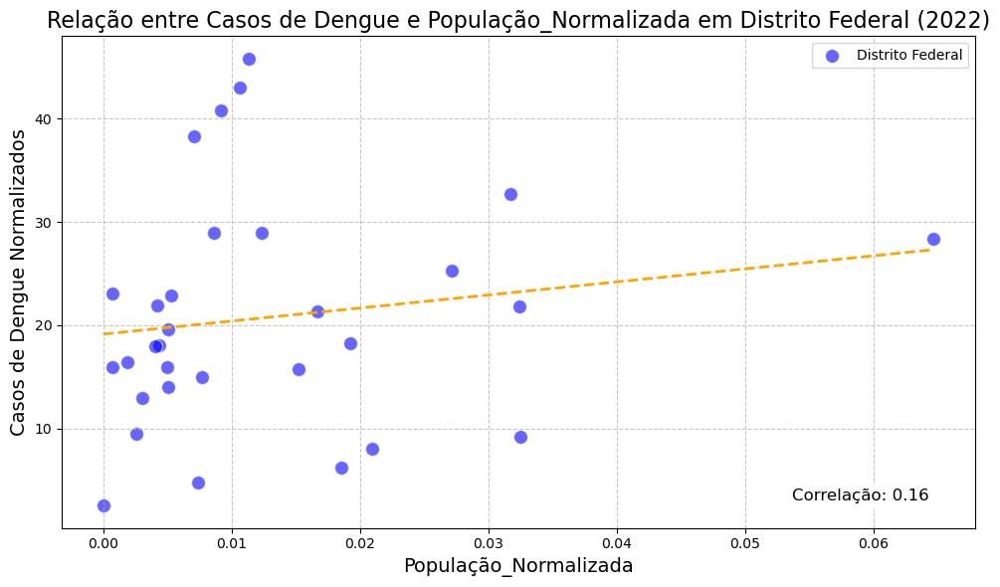

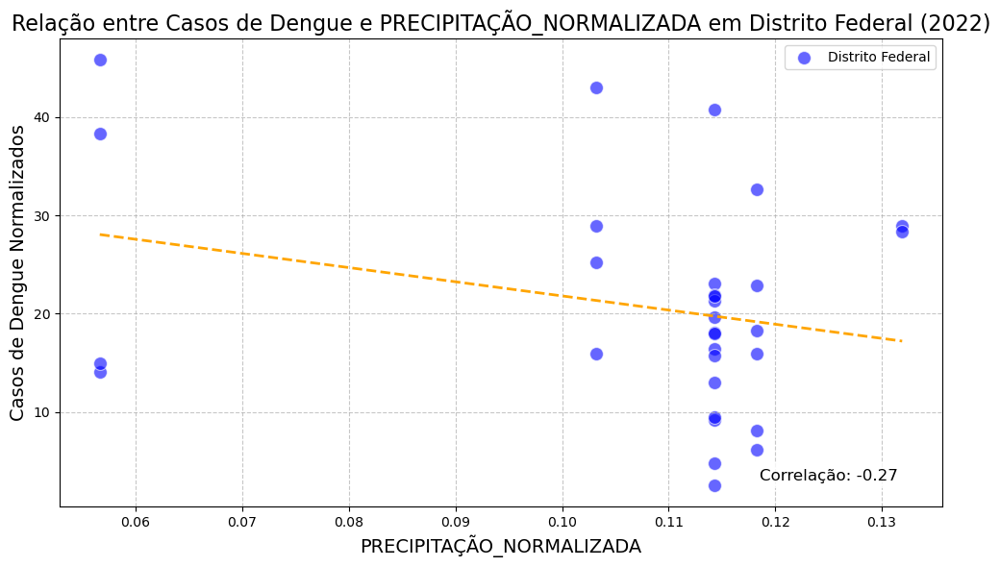

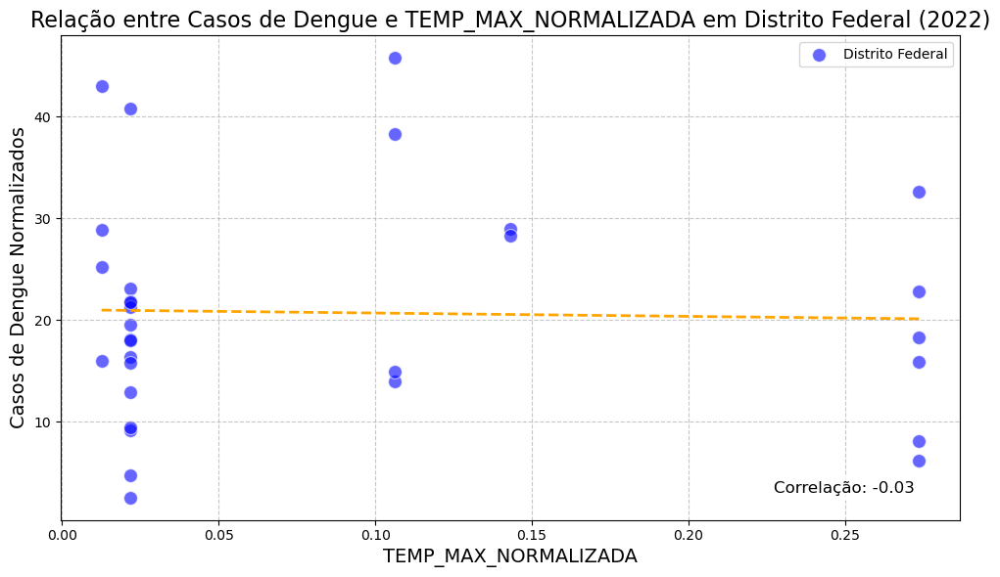

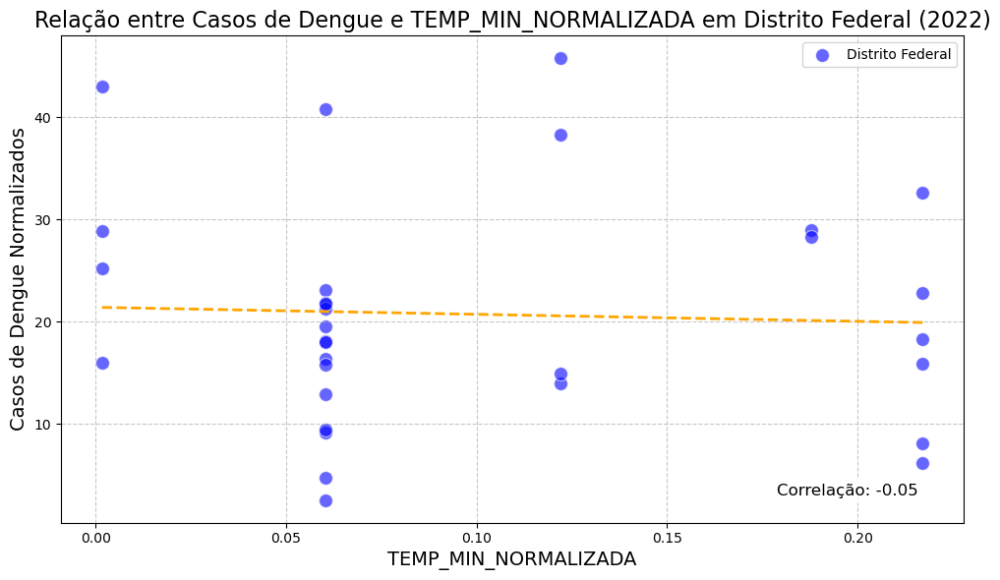

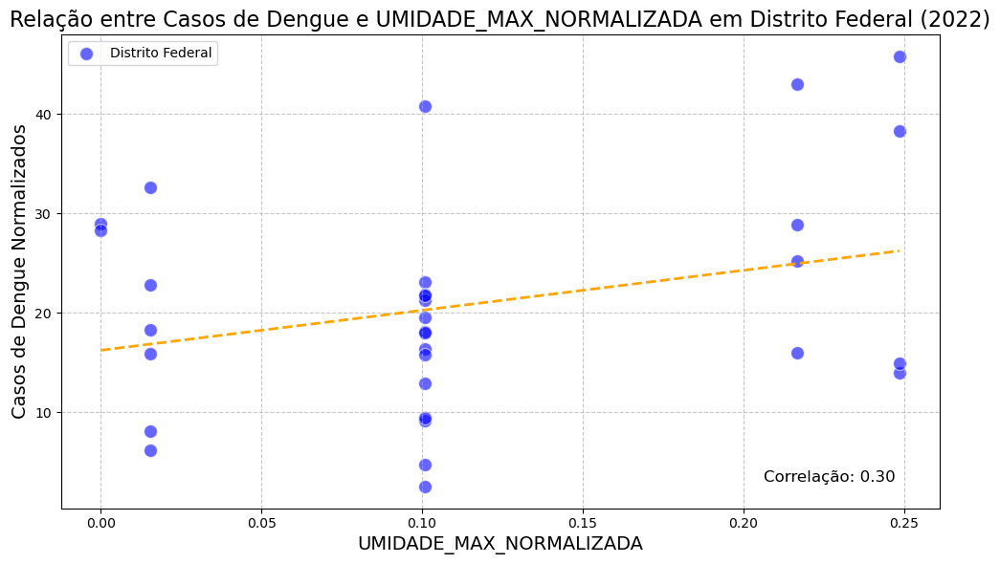

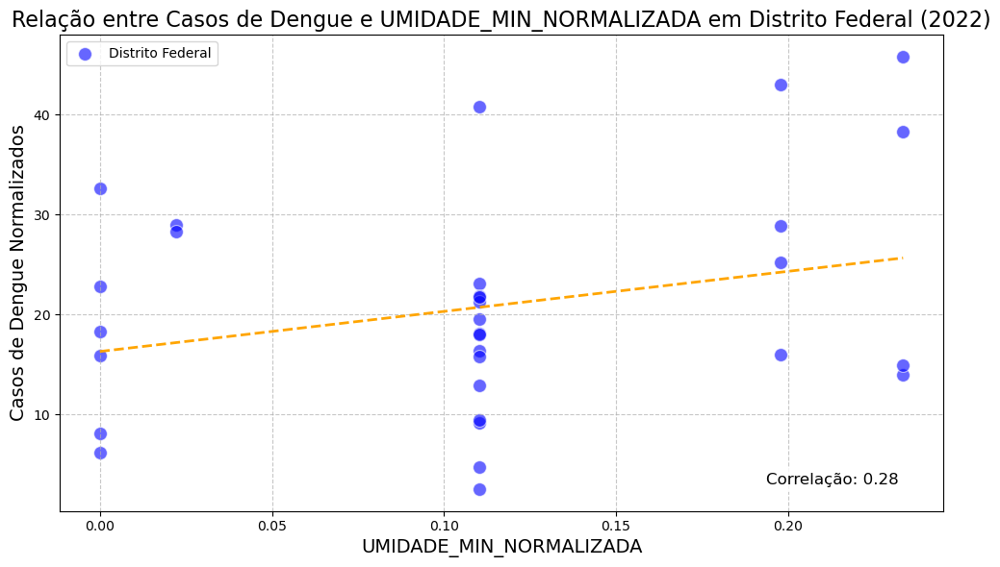

In [929]:
gerar_graficos(df_df, features, ano, 'Distrito Federal')

## **Rio de Janeiro(RJ)**

In [930]:
analise_descritiva(df_rio, "Rio de Janeiro", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,2342.000000,162377475.000000,0.260000,7.500000,0.190000,0.410000,0.510000,0.720000,0.740000
std,3513.560000,305874274.990000,0.490000,10.770000,0.160000,0.300000,0.270000,0.140000,0.120000
min,146.000000,4835400.000000,0.010000,1.220000,0.070000,0.000000,0.120000,0.600000,0.650000
25%,414.500000,6315450.000000,0.010000,1.910000,0.090000,0.290000,0.420000,0.620000,0.660000
50%,823.000000,11776100.000000,0.020000,2.580000,0.140000,0.490000,0.600000,0.680000,0.690000
75%,2750.500000,167838125.000000,0.270000,8.160000,0.240000,0.610000,0.700000,0.770000,0.770000
max,7576.000000,621122300.000000,1.000000,23.620000,0.420000,0.680000,0.730000,0.910000,0.910000


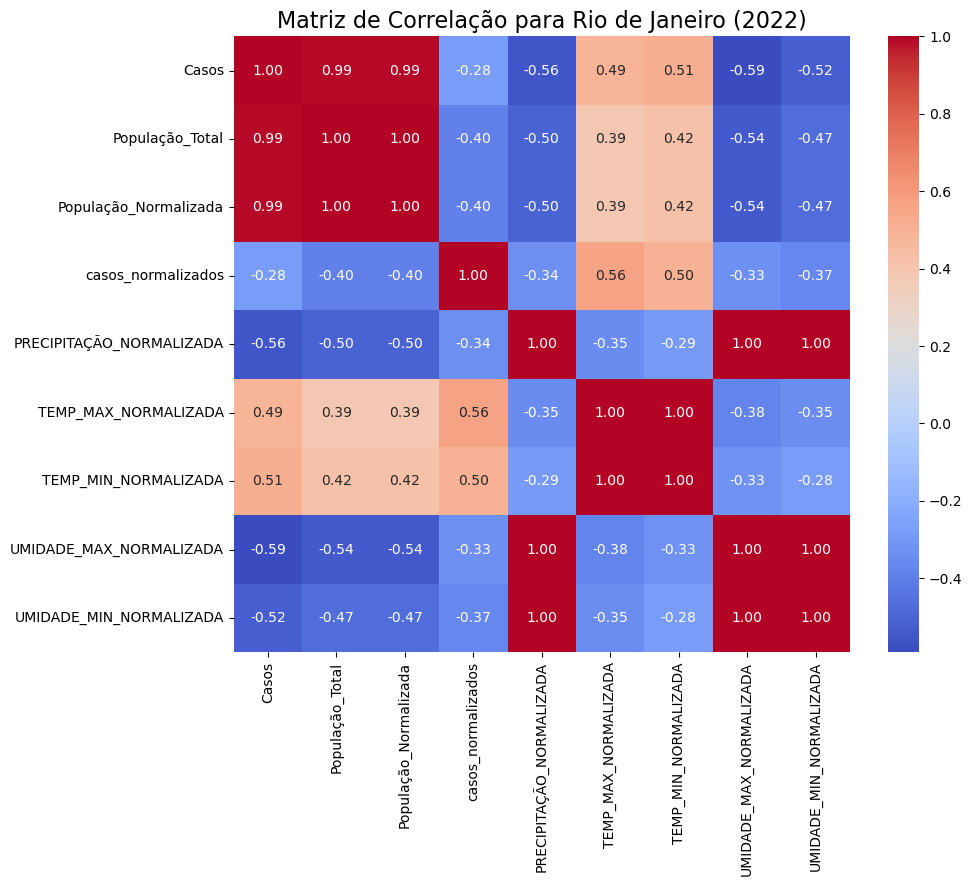

In [931]:
calcular_correlacao(df_rio, "Rio de Janeiro", ano)

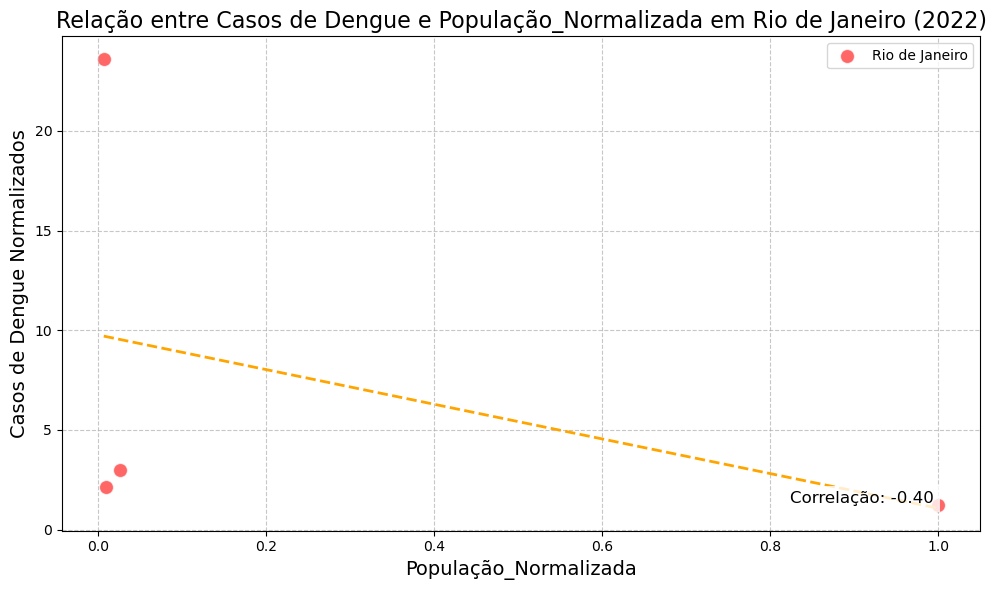

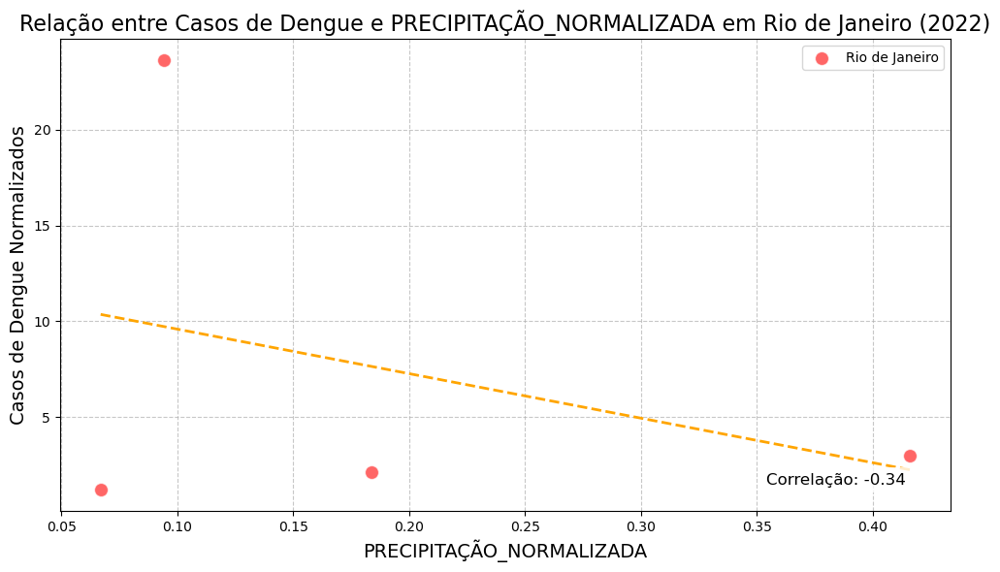

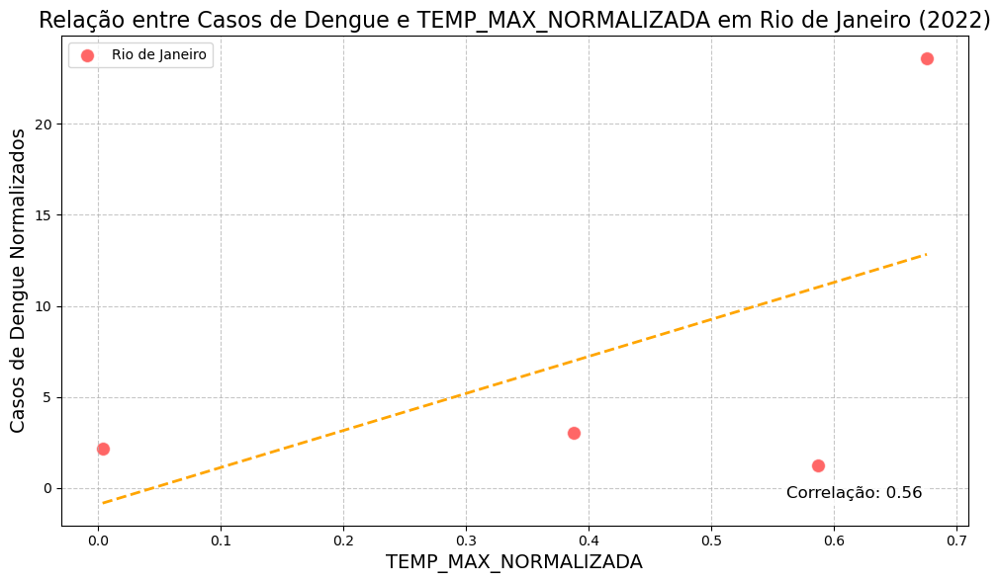

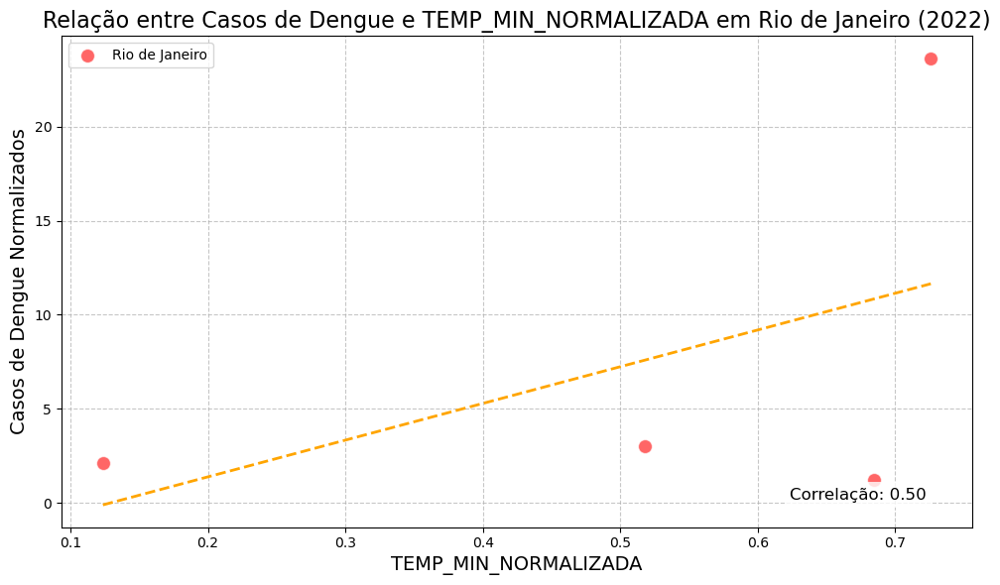

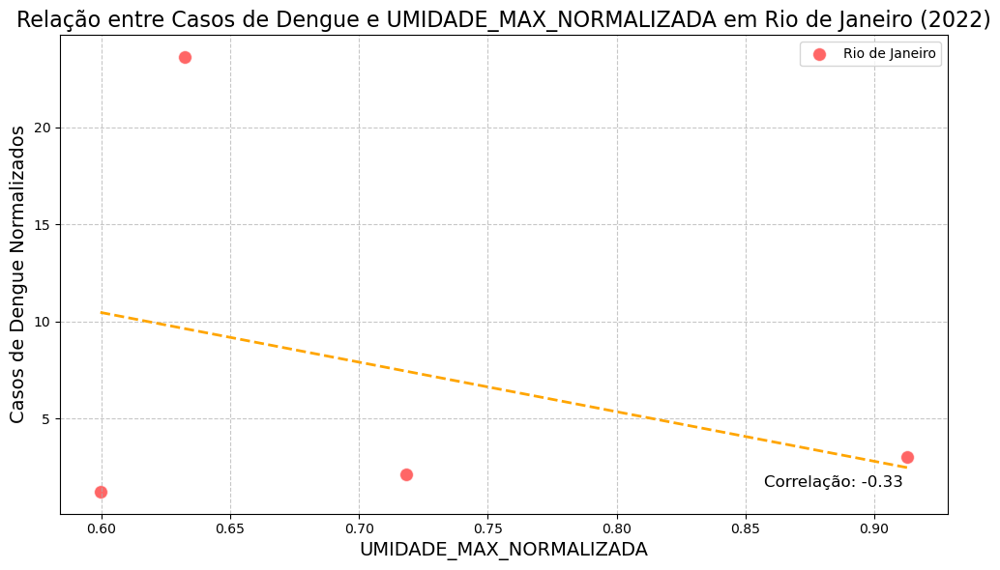

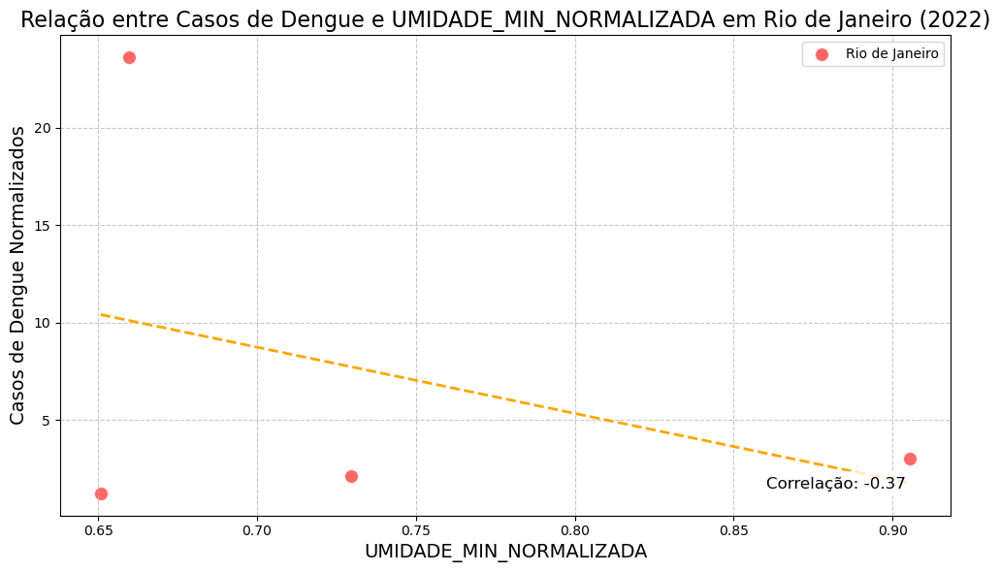

In [932]:
gerar_graficos(df_rio, features, ano, 'Rio de Janeiro')

## **Rio de Janeiro(RJ) e Distrito Federal(DF)**

In [933]:
analise_descritiva(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,1926.570000,25953145.710000,0.040000,19.230000,0.120000,0.130000,0.150000,0.180000,0.180000
std,2450.840000,103876187.800000,0.170000,11.680000,0.060000,0.170000,0.170000,0.210000,0.220000
min,11.000000,435600.000000,0.000000,1.220000,0.060000,0.000000,0.000000,0.000000,0.000000
25%,503.500000,3340250.000000,0.000000,11.230000,0.100000,0.020000,0.060000,0.100000,0.110000
50%,848.000000,5797400.000000,0.010000,18.090000,0.110000,0.020000,0.060000,0.100000,0.110000
75%,2316.500000,12165300.000000,0.020000,24.430000,0.120000,0.210000,0.200000,0.220000,0.200000
max,11499.000000,621122300.000000,1.000000,45.820000,0.420000,0.680000,0.730000,0.910000,0.910000


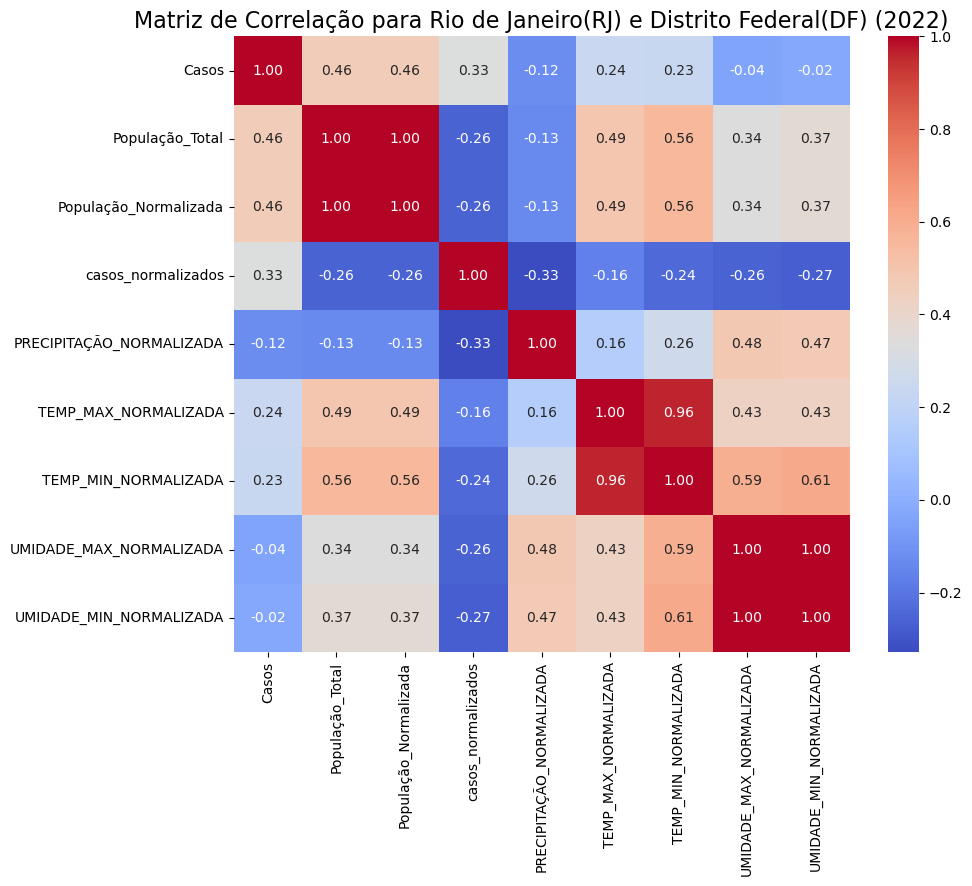

In [934]:
calcular_correlacao(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

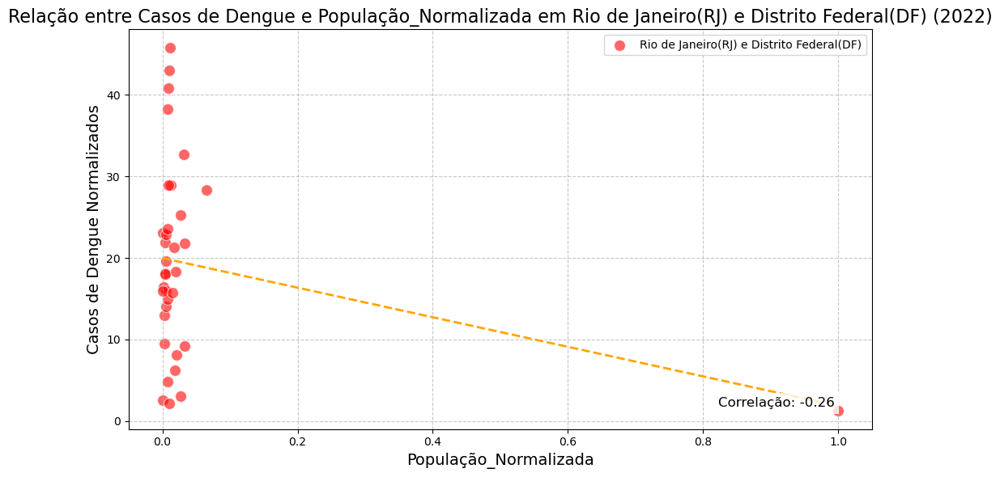

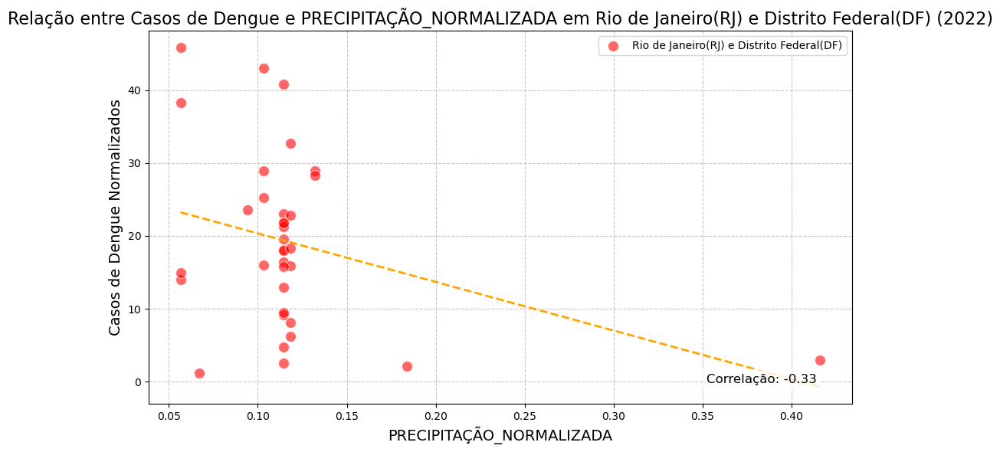

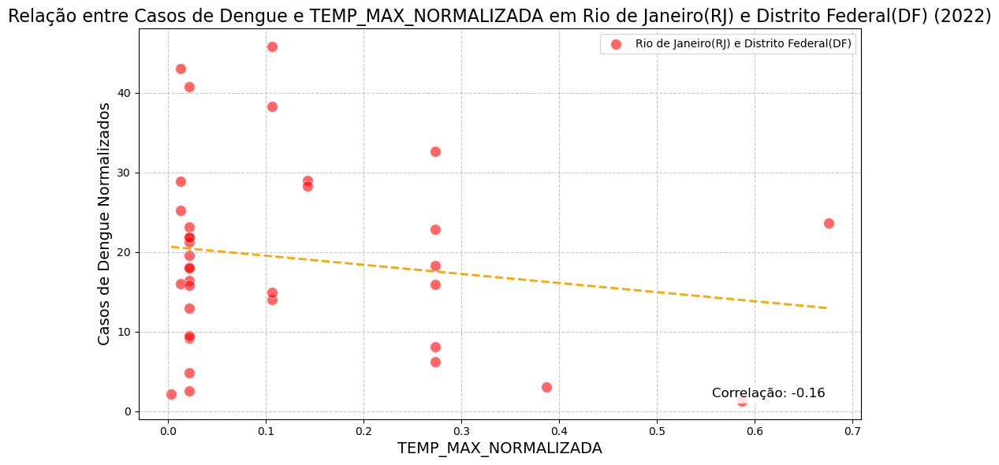

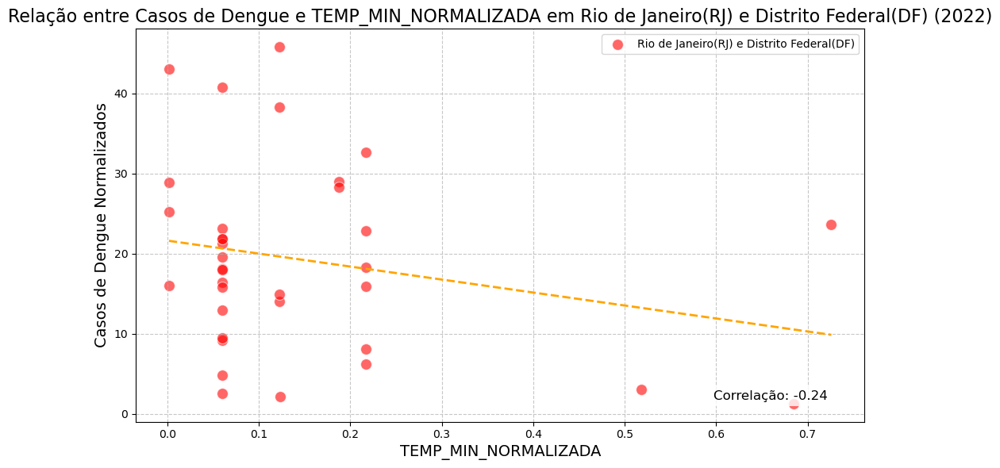

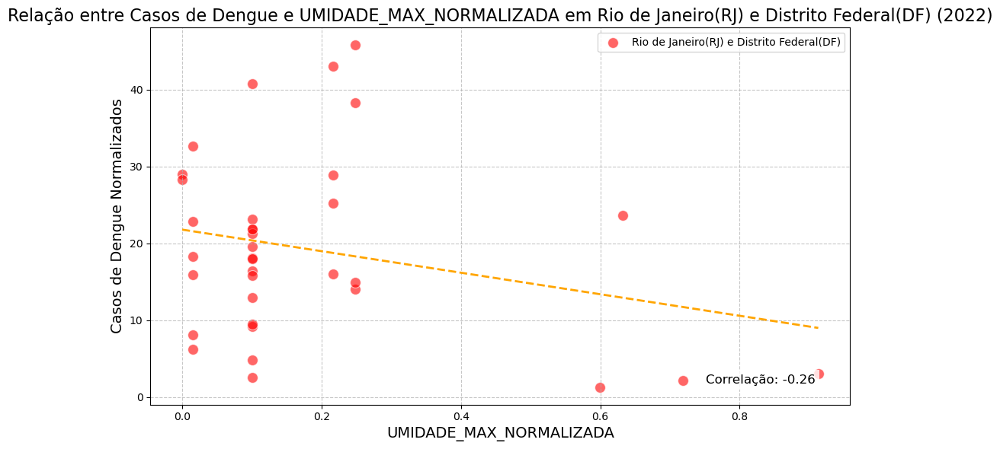

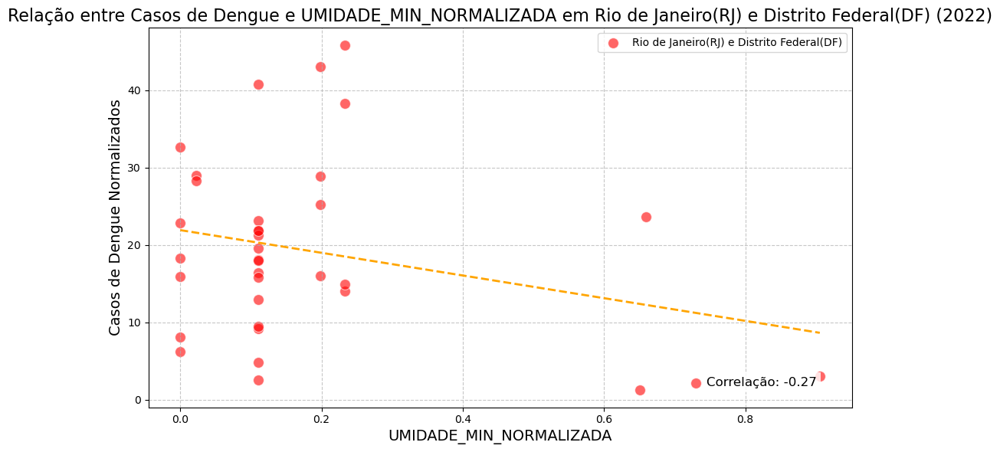

In [935]:
gerar_graficos(df_relevante, features, ano, 'Rio de Janeiro(RJ) e Distrito Federal(DF)')

# **Análise Estátistica de 2023**

In [936]:
    file_path_resultados = f'tabela_saude_com_normalizacao_2023.csv'
    df = pd.read_csv(file_path_resultados)
    ano = '2023'

    df_relevante = df.drop(columns=['COD_CIDADE', 'COD_REG'])

    df_relevante.columns = df_relevante.columns.str.replace(' ', '_').str.replace('á', 'a').str.replace('é', 'e').str.replace('í', 'i').str.replace('ó', 'o').str.replace('ú', 'u')

    df_rio = df_relevante.iloc[-4:].copy()  # Últimos 4 registros para Rio de Janeiro
    df_df = df_relevante.iloc[:-4].copy()   # Todos os registros menos os últimos 4

    features = [
        'População_Normalizada',
        'PRECIPITAÇÃO_NORMALIZADA', 
        'TEMP_MAX_NORMALIZADA',
        'TEMP_MIN_NORMALIZADA', 
        'UMIDADE_MAX_NORMALIZADA',
        'UMIDADE_MIN_NORMALIZADA'
    ]

## **Distrito Federal(DF)**

In [937]:
analise_descritiva(df_df, "Distrito Federal", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,1059.680000,8350006.450000,0.010000,12.110000,0.060000,0.320000,0.290000,0.170000,0.140000
std,1201.750000,8444581.370000,0.010000,9.150000,0.030000,0.080000,0.060000,0.070000,0.070000
min,8.000000,435600.000000,0.000000,1.840000,0.030000,0.240000,0.240000,0.020000,0.020000
25%,211.000000,3110050.000000,0.000000,6.310000,0.040000,0.240000,0.240000,0.130000,0.100000
50%,725.000000,5208900.000000,0.010000,8.620000,0.040000,0.310000,0.250000,0.180000,0.150000
75%,1396.500000,11376900.000000,0.020000,15.240000,0.070000,0.380000,0.360000,0.190000,0.160000
max,5280.000000,40593200.000000,0.060000,43.900000,0.110000,0.450000,0.380000,0.280000,0.250000


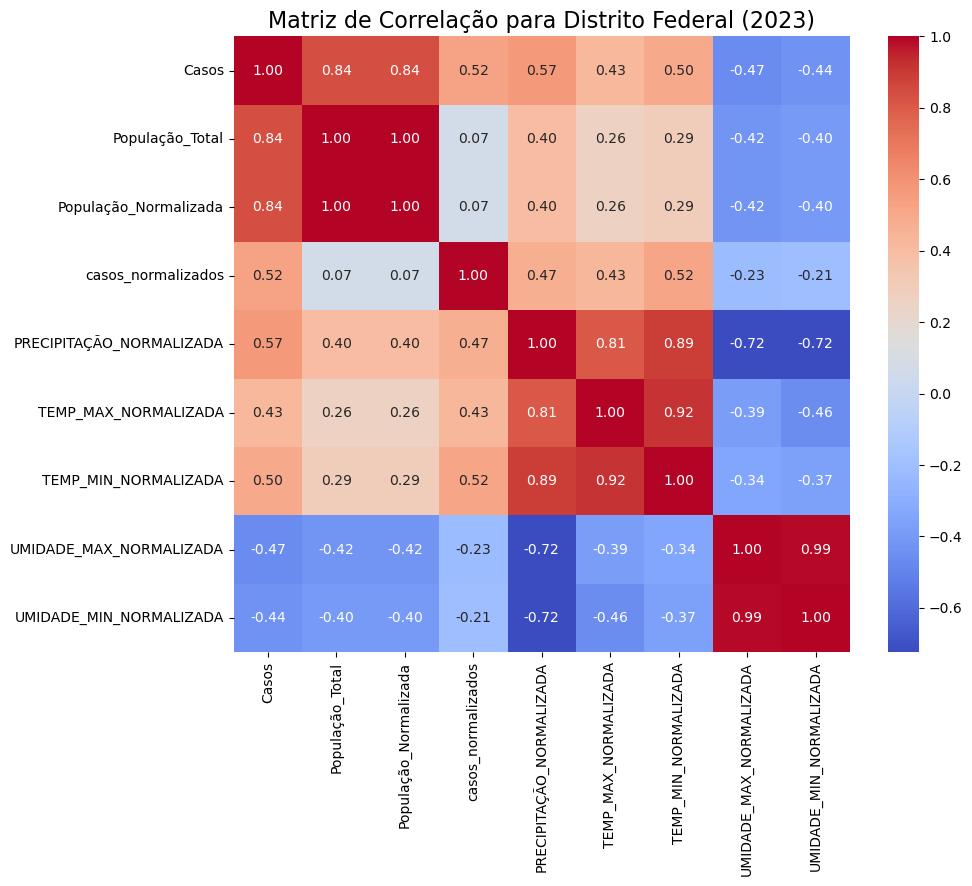

In [938]:
calcular_correlacao(df_df, "Distrito Federal", ano)

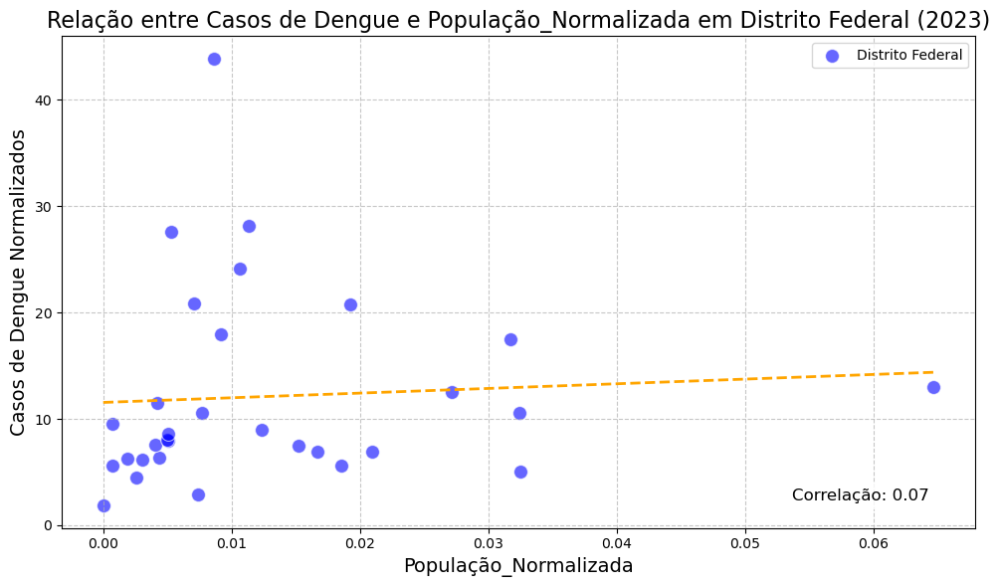

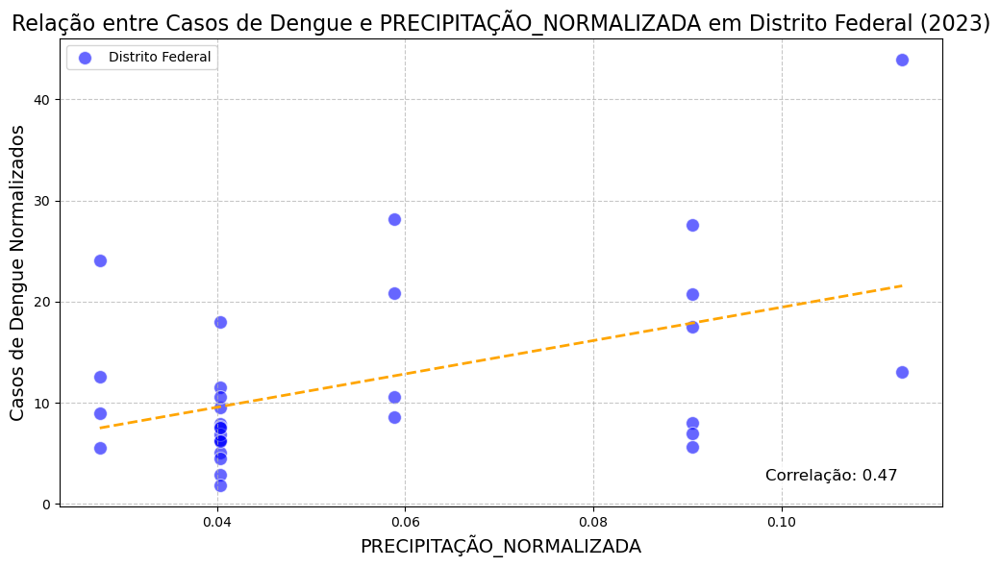

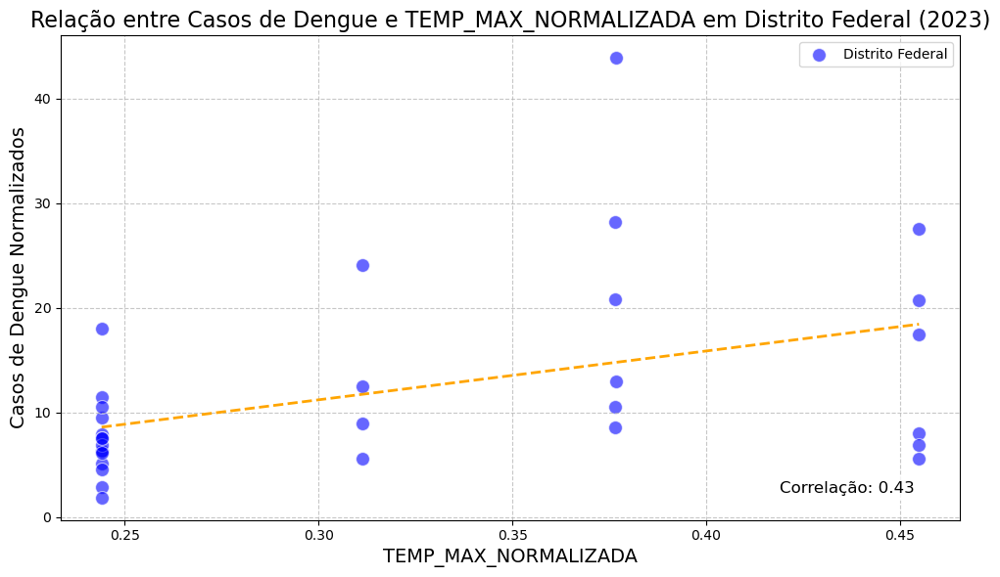

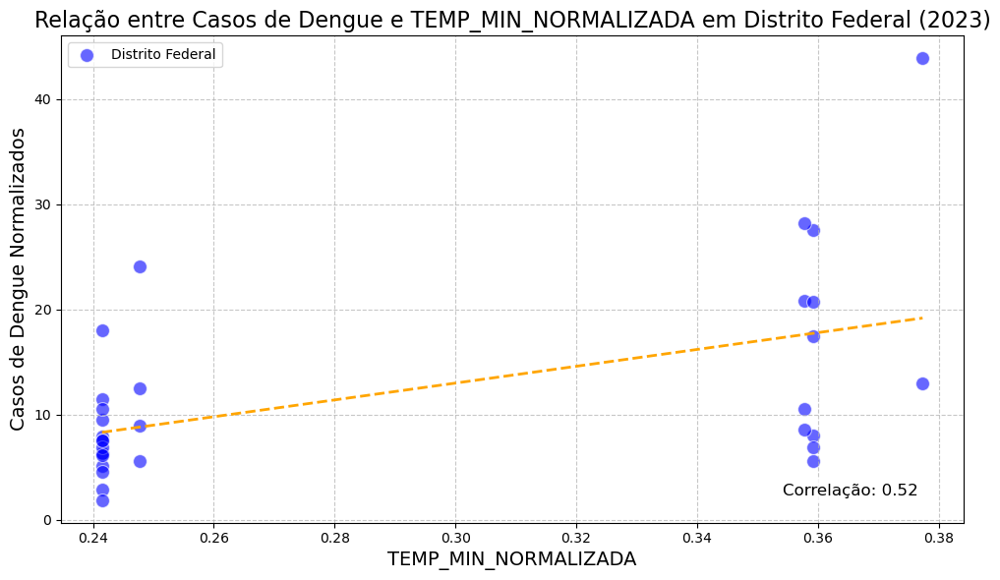

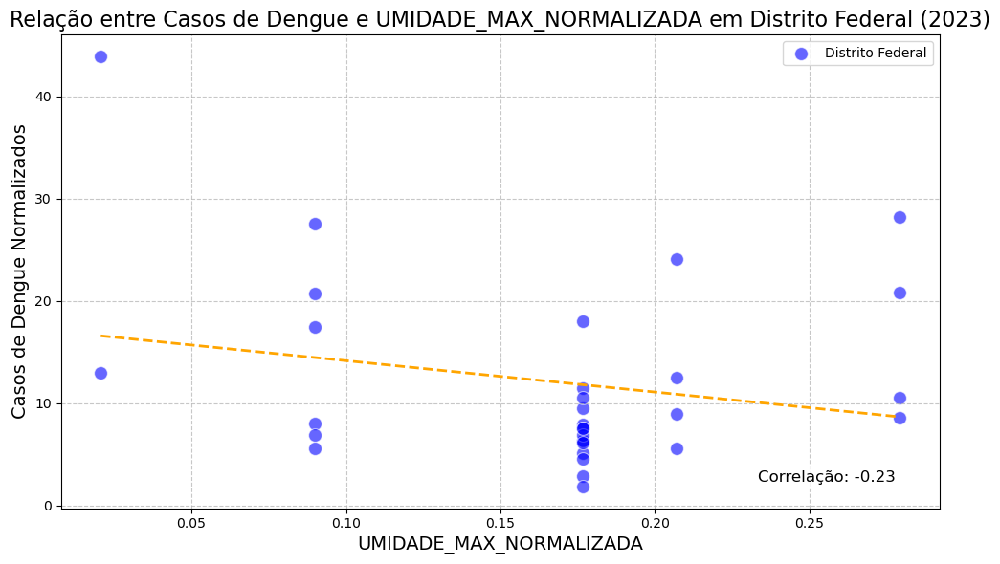

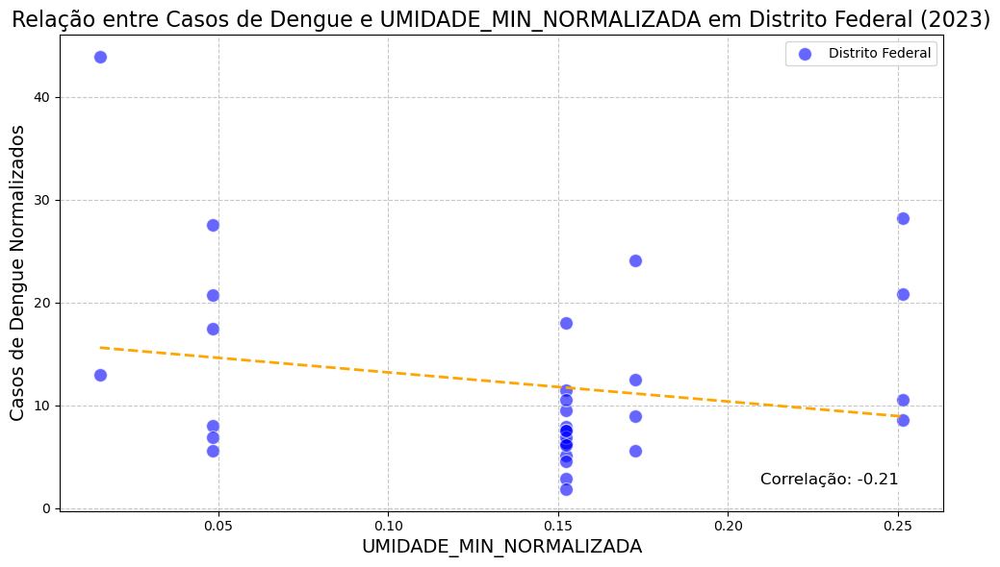

In [939]:
gerar_graficos(df_df, features, ano, 'Distrito Federal')

## **Rio de Janeiro(RJ)**

In [940]:
analise_descritiva(df_rio, "Rio de Janeiro", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
mean,13805.000000,162377475.000000,0.260000,49.810000,0.120000,0.650000,0.720000,0.650000,0.660000
std,20144.450000,305874274.990000,0.490000,81.580000,0.120000,0.260000,0.240000,0.210000,0.220000
min,80.000000,4835400.000000,0.010000,1.170000,0.000000,0.300000,0.380000,0.370000,0.360000
25%,2456.000000,6315450.000000,0.010000,5.560000,0.050000,0.550000,0.630000,0.570000,0.590000
50%,5774.000000,11776100.000000,0.020000,13.210000,0.100000,0.720000,0.790000,0.680000,0.710000
75%,17123.000000,167838125.000000,0.270000,57.460000,0.170000,0.820000,0.880000,0.750000,0.780000
max,43592.000000,621122300.000000,1.000000,171.650000,0.270000,0.870000,0.900000,0.870000,0.860000


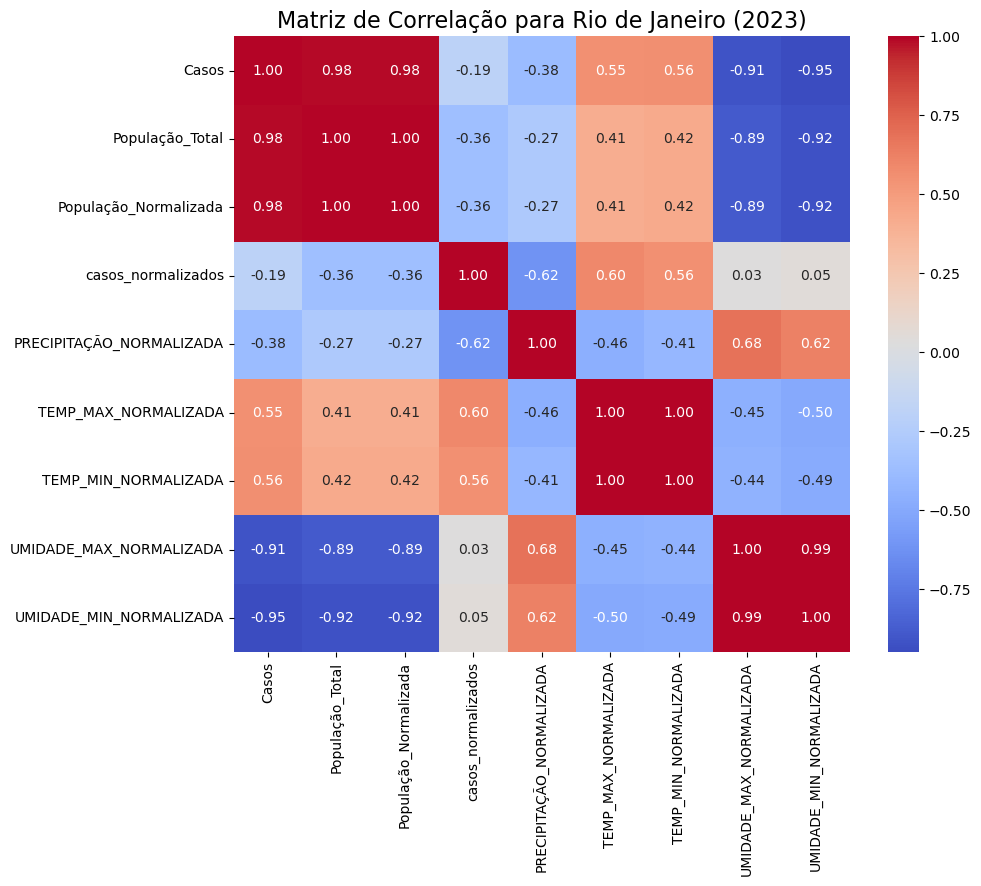

In [941]:
calcular_correlacao(df_rio, "Rio de Janeiro", ano)

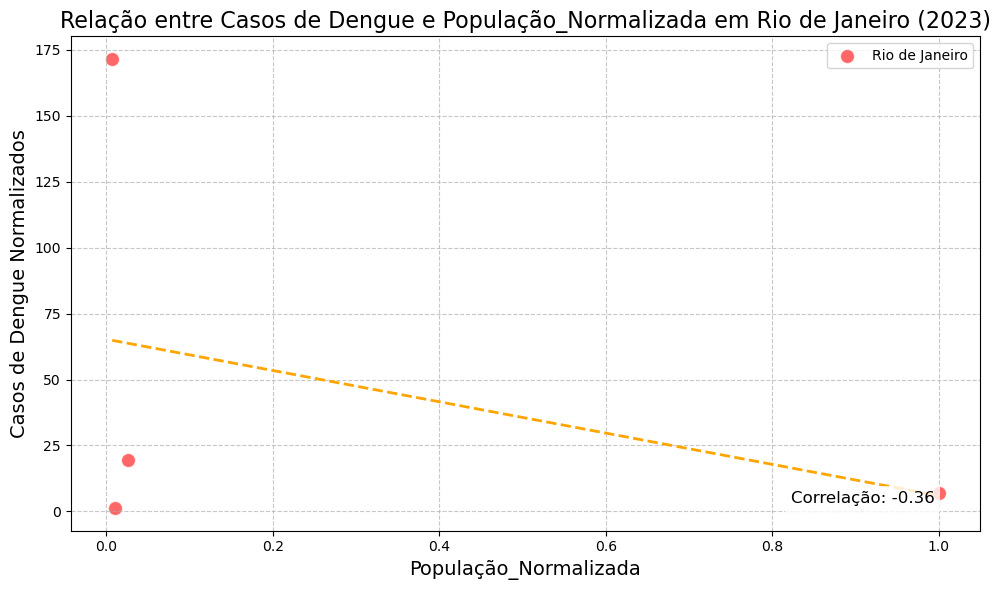

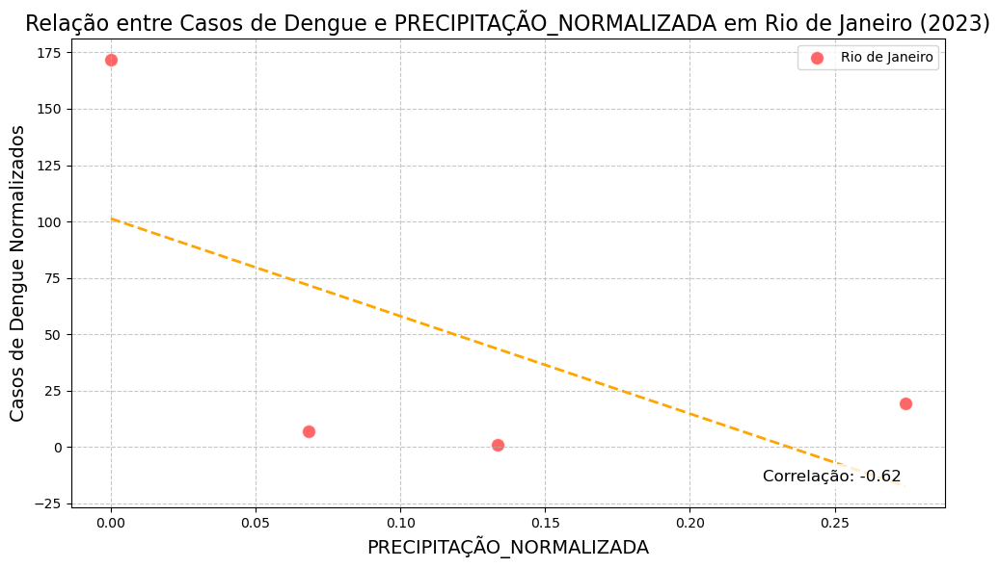

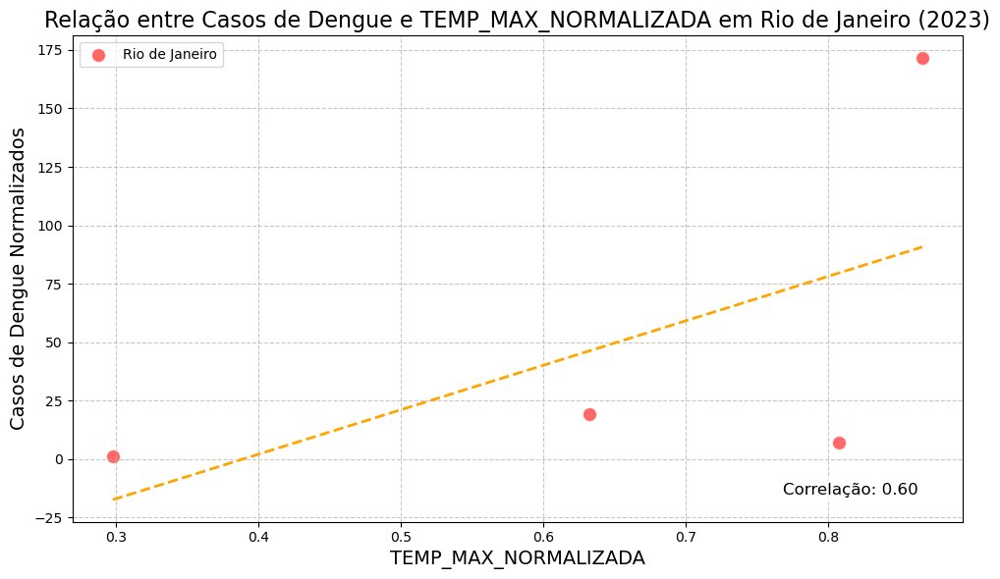

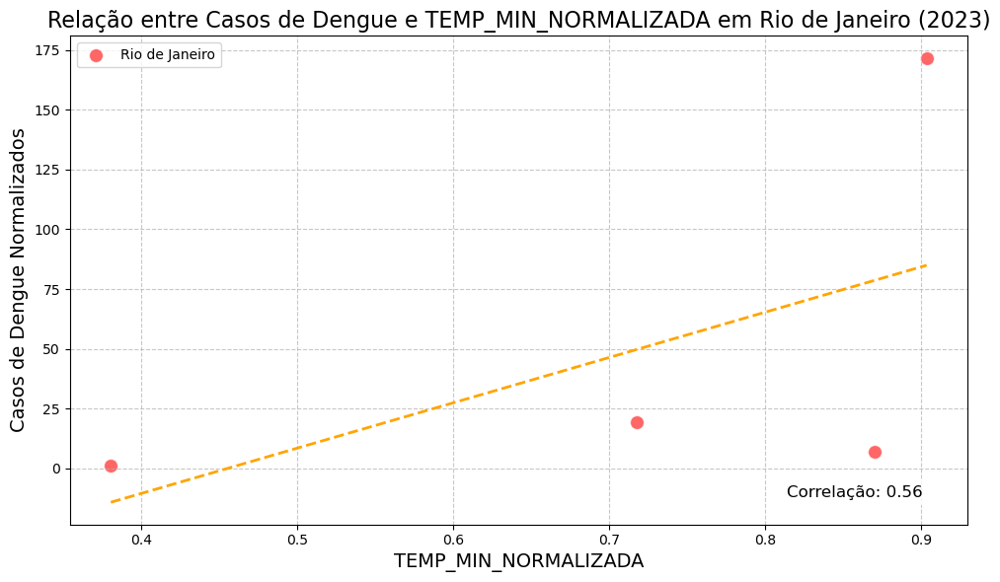

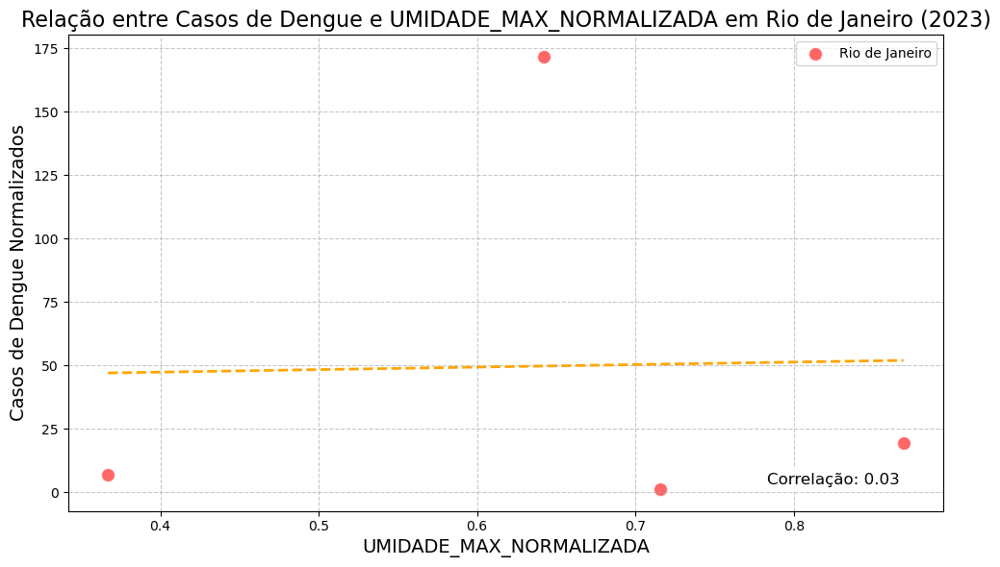

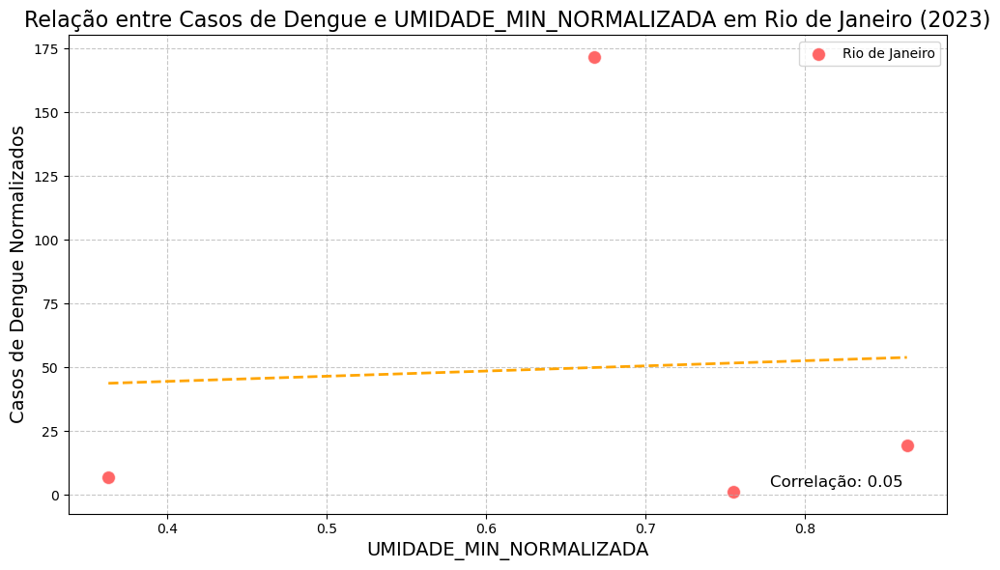

In [942]:
gerar_graficos(df_rio, features, ano, 'Rio de Janeiro')

## **Rio de Janeiro(RJ) e Distrito Federal(DF)**

In [943]:
analise_descritiva(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

,Casos,População_Total,População_Normalizada,casos_normalizados,PRECIPITAÇÃO_NORMALIZADA,TEMP_MAX_NORMALIZADA,TEMP_MIN_NORMALIZADA,UMIDADE_MAX_NORMALIZADA,UMIDADE_MIN_NORMALIZADA
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000
mean,2516.290000,25953145.710000,0.040000,16.420000,0.060000,0.360000,0.340000,0.220000,0.200000
std,7348.940000,103876187.800000,0.170000,28.450000,0.050000,0.150000,0.170000,0.180000,0.190000
min,8.000000,435600.000000,0.000000,1.170000,0.000000,0.240000,0.240000,0.020000,0.020000
25%,211.000000,3340250.000000,0.000000,6.310000,0.040000,0.240000,0.240000,0.180000,0.150000
50%,743.000000,5797400.000000,0.010000,8.620000,0.040000,0.310000,0.250000,0.180000,0.150000
75%,2131.500000,12165300.000000,0.020000,17.740000,0.090000,0.420000,0.360000,0.210000,0.170000
max,43592.000000,621122300.000000,1.000000,171.650000,0.270000,0.870000,0.900000,0.870000,0.860000


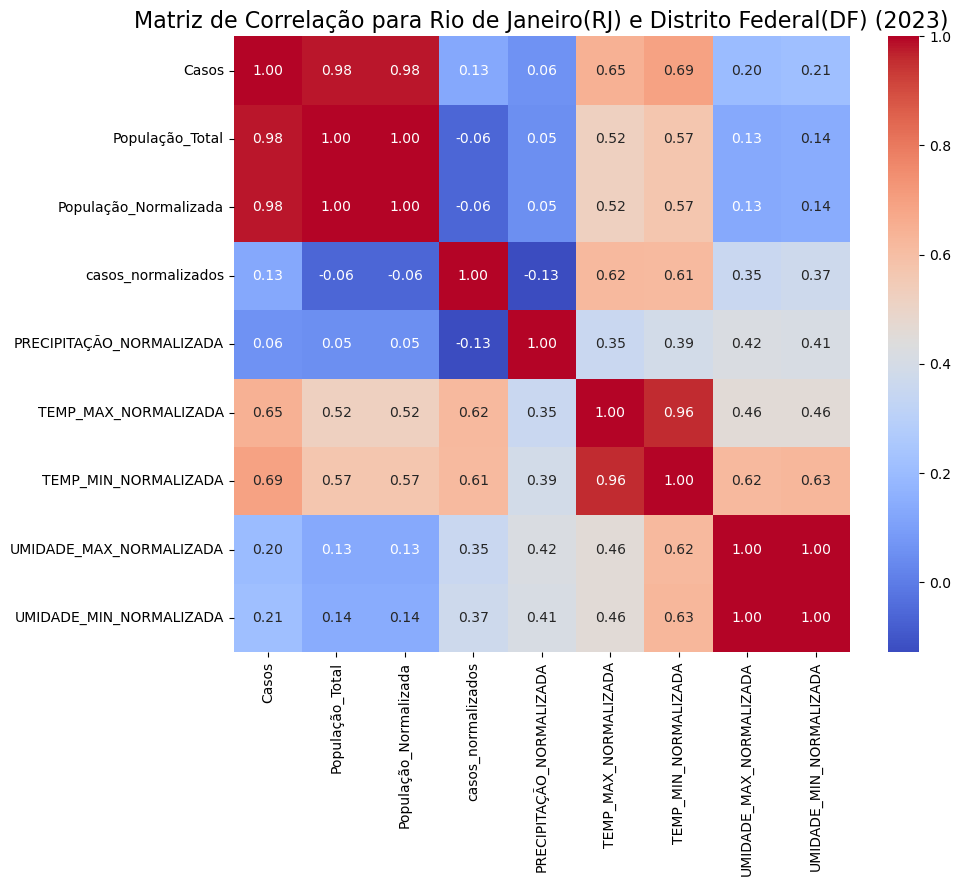

In [944]:
calcular_correlacao(df_relevante, "Rio de Janeiro(RJ) e Distrito Federal(DF)", ano)

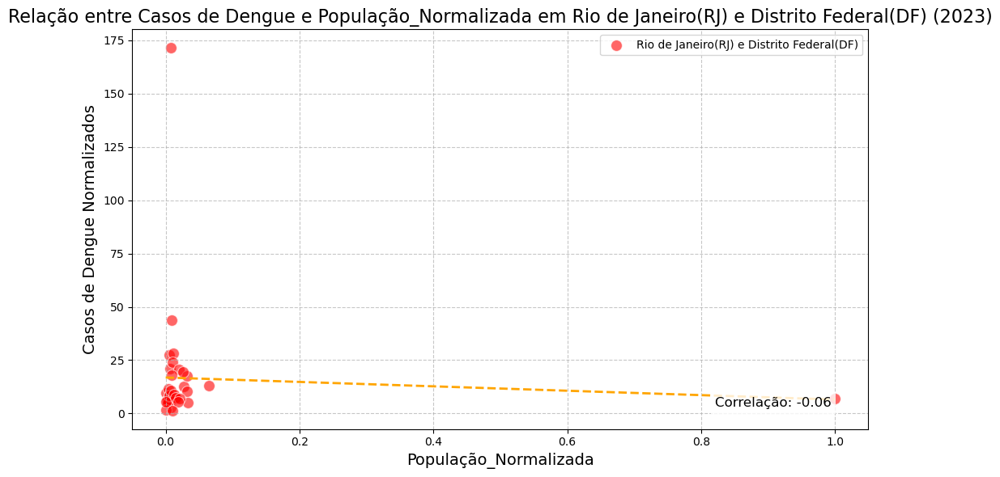

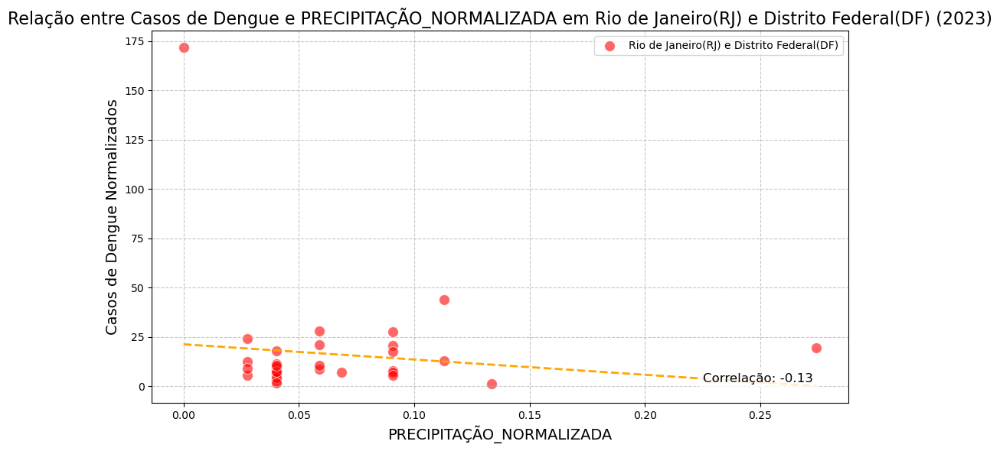

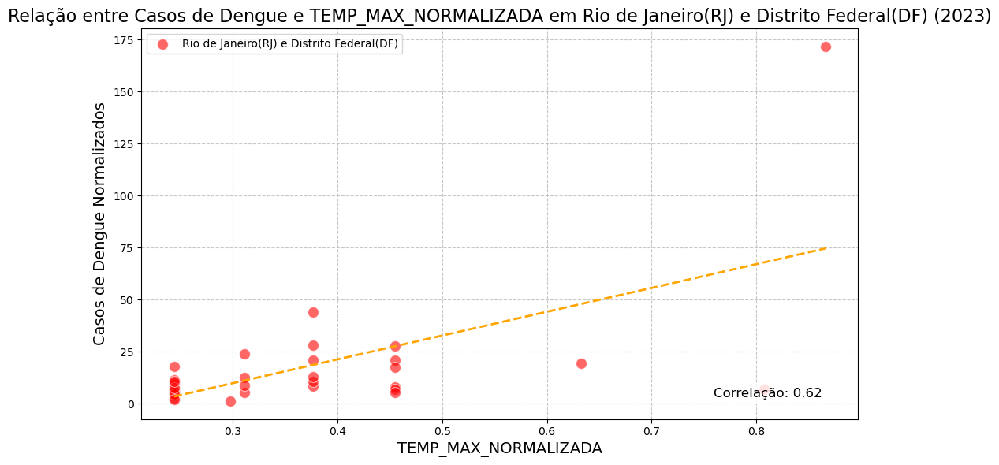

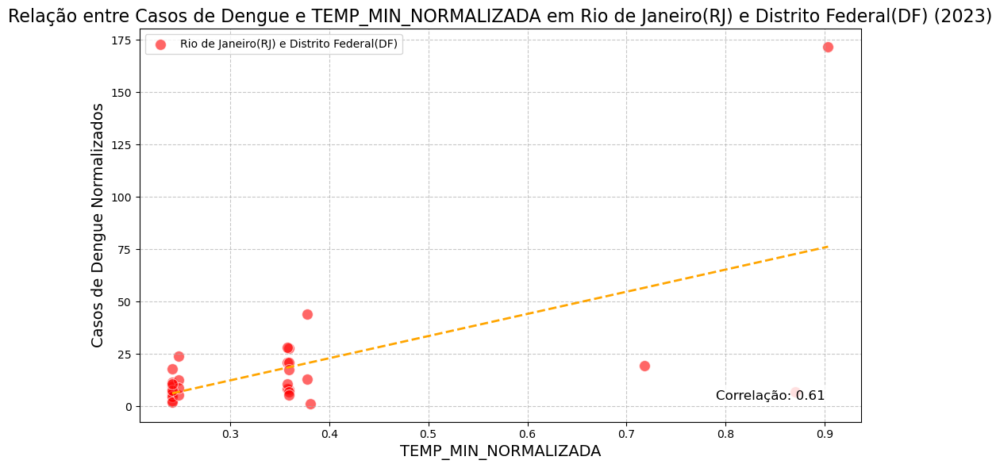

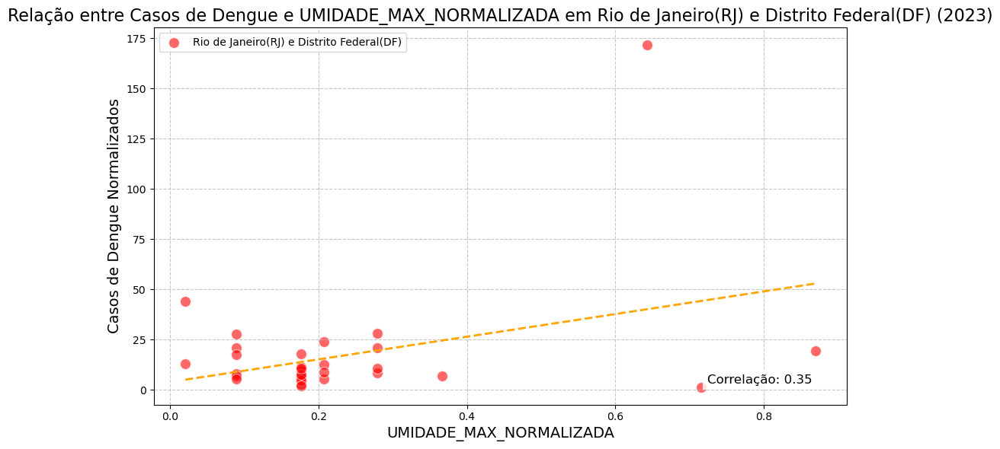

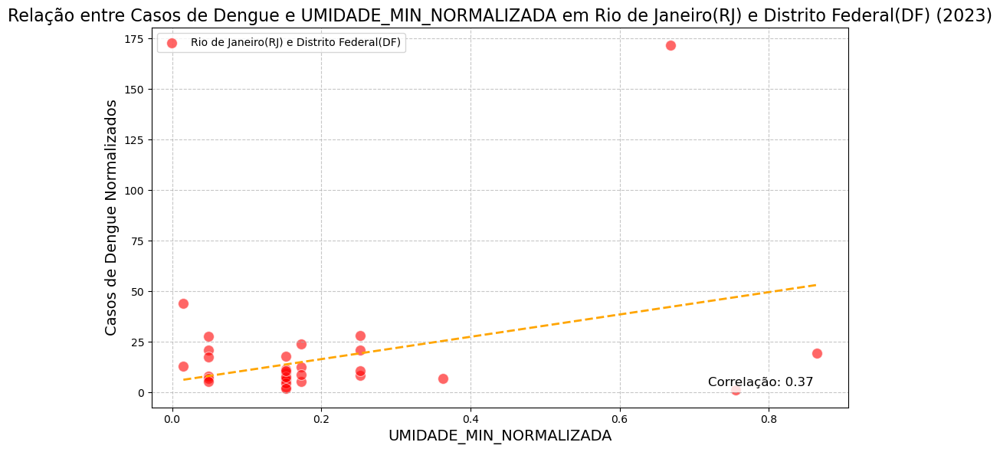

In [945]:
gerar_graficos(df_relevante, features, ano, 'Rio de Janeiro(RJ) e Distrito Federal(DF)')

# **Análise Estátistica: Casos vs Features(2019 a 2023)**


**Função para plotar gráfico de dispersão (scatter plot) comparando casos de dengue normalizados
    com uma variável normalizada.**

    Parâmetros:
    - df_consolidado: DataFrame consolidado contendo os dados de dengue e variáveis normalizadas.
    - x_variable: A coluna do DataFrame a ser usada no eixo x (exemplo: 'TEMP_MAX_NORMALIZADA').
    - x_label: Rótulo do eixo x para o gráfico.
    - title: Título do gráfico.
   

In [946]:
def plot_dengue_vs_variable(df_consolidado, x_variable, x_label, title):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df_consolidado, x=x_variable, y='casos_normalizados', hue='Ano', palette='viridis', alpha=0.6)
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel('Casos de Dengue')
    plt.legend(title='Ano')
    plt.show()

## **Gráfico de Casos de Dengue vs. Precipitação**

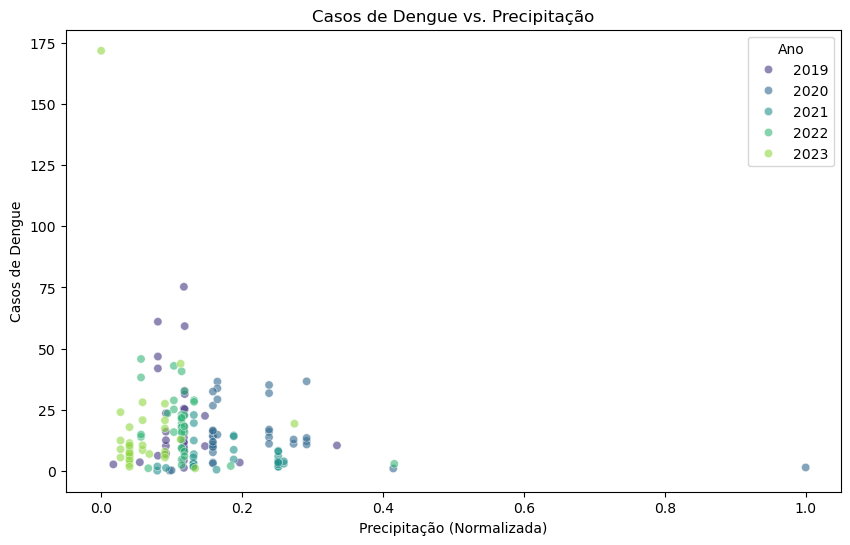

In [947]:
plot_dengue_vs_variable(pd.concat(tabelas_dengue), 'PRECIPITAÇÃO_NORMALIZADA', 'Precipitação (Normalizada)', 'Casos de Dengue vs. Precipitação')

## **Gráfico de Casos de Dengue vs. Temperatura Máxima**

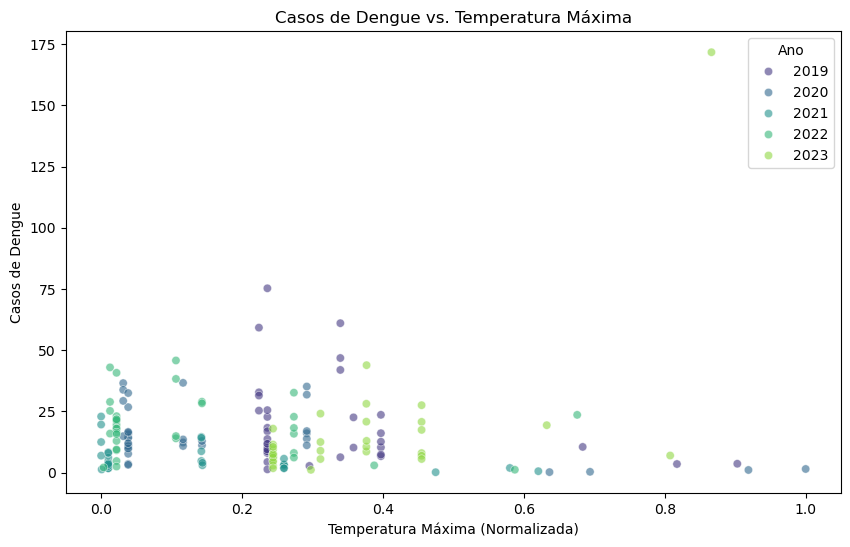

In [948]:
plot_dengue_vs_variable(pd.concat(tabelas_dengue), 'TEMP_MAX_NORMALIZADA', 'Temperatura Máxima (Normalizada)', 'Casos de Dengue vs. Temperatura Máxima')


## **Gráfico de Casos de Dengue vs. Temperatura Mínima**

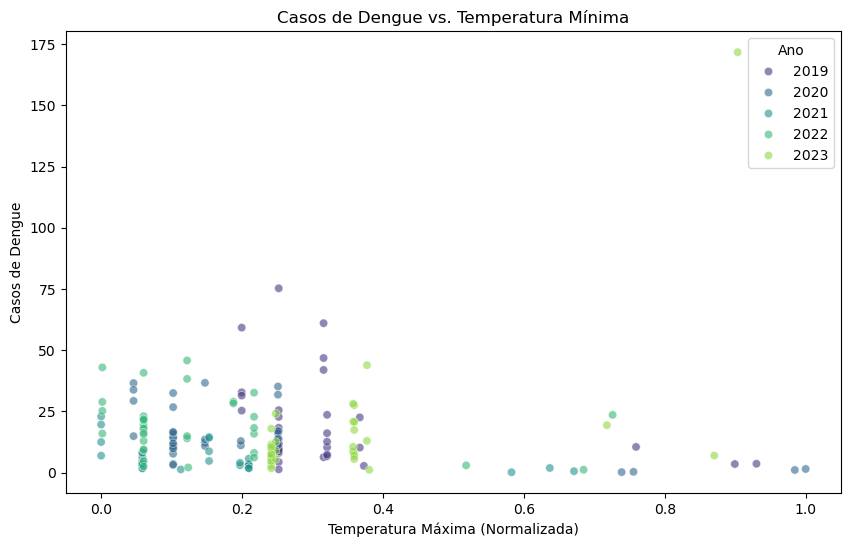

In [949]:
plot_dengue_vs_variable(pd.concat(tabelas_dengue), 'TEMP_MIN_NORMALIZADA', 'Temperatura Máxima (Normalizada)', 'Casos de Dengue vs. Temperatura Mínima')


## **Gráfico de Casos de Dengue vs. Umidade Mínima**

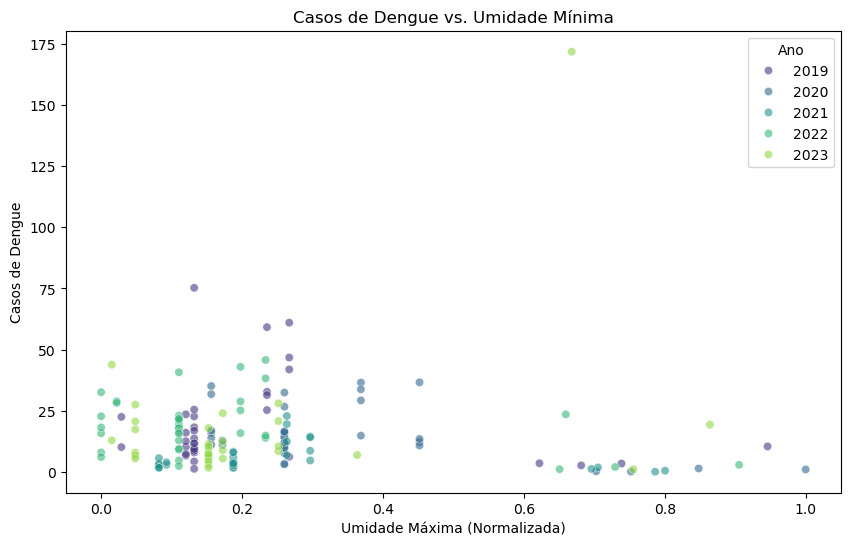

In [950]:
plot_dengue_vs_variable(pd.concat(tabelas_dengue), 'UMIDADE_MIN_NORMALIZADA', 'Umidade Máxima (Normalizada)', 'Casos de Dengue vs. Umidade Mínima')


## **Gráfico de Casos de Dengue vs. Umidade Máxima**

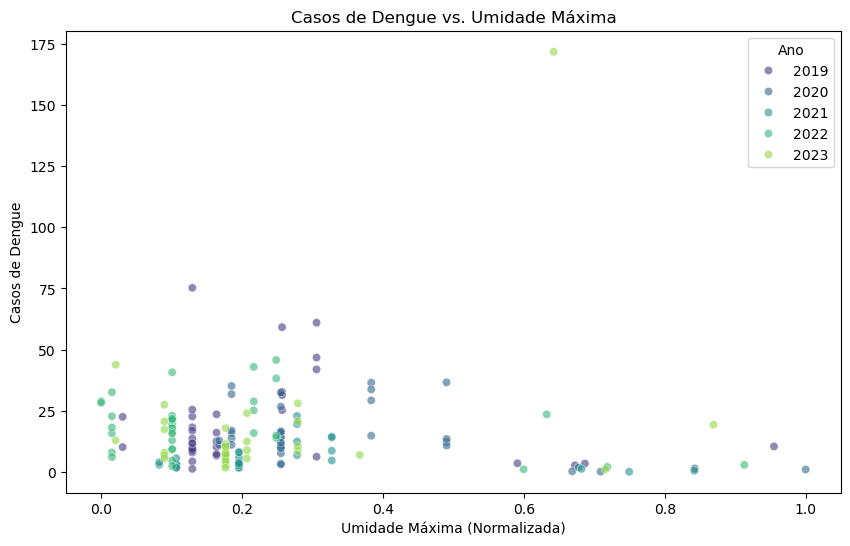

In [951]:
plot_dengue_vs_variable(pd.concat(tabelas_dengue), 'UMIDADE_MAX_NORMALIZADA', 'Umidade Máxima (Normalizada)', 'Casos de Dengue vs. Umidade Máxima')


# **Testes de Fisher e Análise de contingência (2019 a 2023)**

Tabela de Contingência para Umidade Mínima:
Umidade Mínima_Categoria  Baixa  Alta
Dengue_Categoria                     
Ausente                      72    40
Presente                     44    19

Odds Ratio para Umidade Mínima: 0.7773, p-valor: 0.5075
Interpretação para Umidade Mínima:
- O Odds Ratio de 0.7773 indica que as chances de ter dengue são 0.7773 vezes maiores em condições de 'Umidade Mínima' baixa em comparação com condições de 'Umidade Mínima' alta.
- O p-valor de 0.5075 indica que o resultado é não significativo, sugerindo que a relação entre Umidade Mínima e dengue pode estatisticamente relevante.



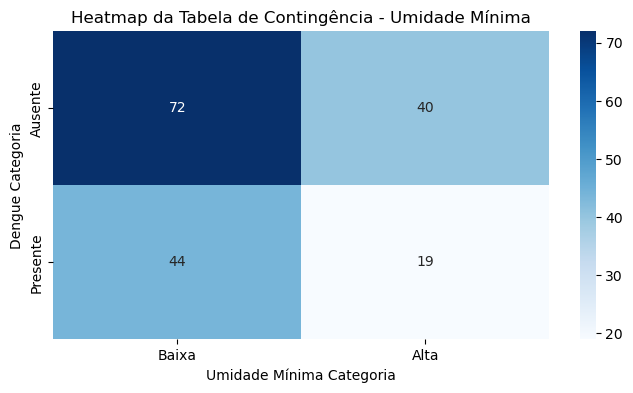

Tabela de Contingência para Umidade Máxima:
Umidade Máxima_Categoria  Baixa  Alta
Dengue_Categoria                     
Ausente                      70    42
Presente                     38    25

Odds Ratio para Umidade Máxima: 1.0965, p-valor: 0.8715
Interpretação para Umidade Máxima:
- O Odds Ratio de 1.0965 indica que as chances de ter dengue são 1.0965 vezes maiores em condições de 'Umidade Máxima' baixa em comparação com condições de 'Umidade Máxima' alta.
- O p-valor de 0.8715 indica que o resultado é não significativo, sugerindo que a relação entre Umidade Máxima e dengue pode estatisticamente relevante.



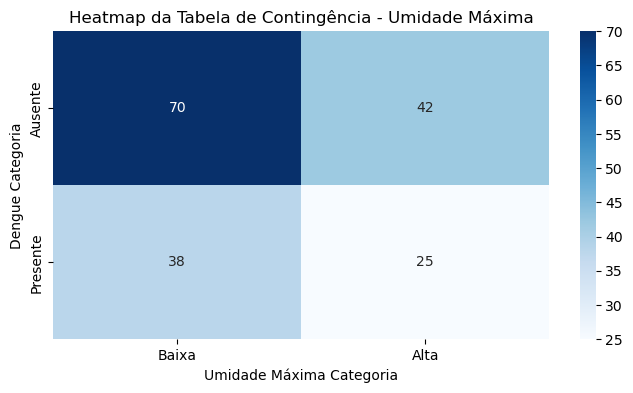

Tabela de Contingência para Temperatura Máxima:
Temperatura Máxima_Categoria  Baixa  Alta
Dengue_Categoria                         
Ausente                          48    64
Presente                         29    34

Odds Ratio para Temperatura Máxima: 0.8793, p-valor: 0.7517
Interpretação para Temperatura Máxima:
- O Odds Ratio de 0.8793 indica que as chances de ter dengue são 0.8793 vezes maiores em condições de 'Temperatura Máxima' baixa em comparação com condições de 'Temperatura Máxima' alta.
- O p-valor de 0.7517 indica que o resultado é não significativo, sugerindo que a relação entre Temperatura Máxima e dengue pode estatisticamente relevante.



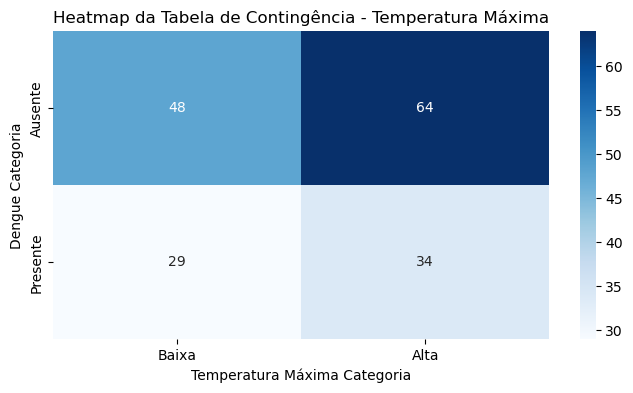

Tabela de Contingência para Temperatura Mínima:
Temperatura Mínima_Categoria  Baixa  Alta
Dengue_Categoria                         
Ausente                          56    56
Presente                         37    26

Odds Ratio para Temperatura Mínima: 0.7027, p-valor: 0.2749
Interpretação para Temperatura Mínima:
- O Odds Ratio de 0.7027 indica que as chances de ter dengue são 0.7027 vezes maiores em condições de 'Temperatura Mínima' baixa em comparação com condições de 'Temperatura Mínima' alta.
- O p-valor de 0.2749 indica que o resultado é não significativo, sugerindo que a relação entre Temperatura Mínima e dengue pode estatisticamente relevante.



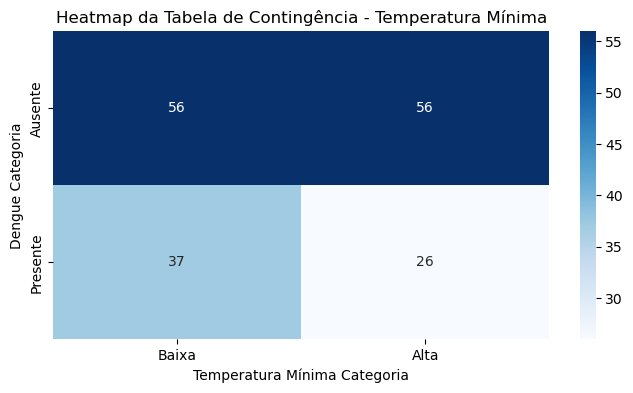

Tabela de Contingência para Precipitação:
Precipitação_Categoria  Baixa  Alta
Dengue_Categoria                   
Ausente                    65    47
Presente                   48    15

Odds Ratio para Precipitação: 0.4322, p-valor: 0.0209
Interpretação para Precipitação:
- O Odds Ratio de 0.4322 indica que as chances de ter dengue são 0.4322 vezes maiores em condições de 'Precipitação' baixa em comparação com condições de 'Precipitação' alta.
- O p-valor de 0.0209 indica que o resultado é significativo, sugerindo que a relação entre Precipitação e dengue é estatisticamente relevante.



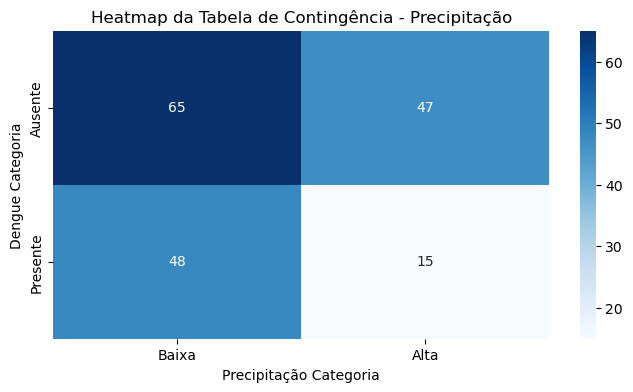

In [952]:

dfs = []

for ano in anos:
    df = pd.read_csv(f'tabela_saude_com_normalizacao_{ano}.csv')
    dfs.append(df)

df_consolidado = pd.concat(dfs, ignore_index=True)

def analisar_variavel(df, coluna, nome_variavel, inverso=False):
    media = df[coluna].mean()
    
    if inverso:
        df[f'{nome_variavel}_Categoria'] = pd.cut(df[coluna], 
                                                   bins=[-float('inf'), media, float('inf')], 
                                                   labels=['Alta', 'Baixa'])  # Invertido
    else:
        df[f'{nome_variavel}_Categoria'] = pd.cut(df[coluna], 
                                                   bins=[-float('inf'), media, float('inf')], 
                                                   labels=['Baixa', 'Alta'])  # Normal

    tabela_contingencia = pd.crosstab(df['Dengue_Categoria'], df[f'{nome_variavel}_Categoria'])

    print(f'Tabela de Contingência para {nome_variavel}:\n{tabela_contingencia}\n')

    if tabela_contingencia.shape[0] == 2 and tabela_contingencia.shape[1] == 2:
        odds_ratio, p_valor = fisher_exact(tabela_contingencia)
        print(f'Odds Ratio para {nome_variavel}: {odds_ratio:.4f}, p-valor: {p_valor:.4f}')
        
        print(f"Interpretação para {nome_variavel}:")
        if inverso:
            print(f"- O Odds Ratio de {odds_ratio:.4f} indica que as chances de ter dengue são {odds_ratio:.4f} vezes maiores em condições de '{nome_variavel}' alta em comparação com condições de '{nome_variavel}' baixa.")
        else:
            print(f"- O Odds Ratio de {odds_ratio:.4f} indica que as chances de ter dengue são {odds_ratio:.4f} vezes maiores em condições de '{nome_variavel}' baixa em comparação com condições de '{nome_variavel}' alta.")
        
        print(f"- O p-valor de {p_valor:.4f} indica que o resultado é {'significativo' if p_valor < 0.05 else 'não significativo'}, sugerindo que a relação entre {nome_variavel} e dengue {'pode' if p_valor >= 0.05 else 'é'} estatisticamente relevante.\n")
    else:
        print(f"A tabela de contingência para {nome_variavel} não é 2x2.")

    
    plt.figure(figsize=(8, 4))
    sns.heatmap(tabela_contingencia, annot=True, fmt='d', cmap='Blues', cbar=True)
    plt.title(f'Heatmap da Tabela de Contingência - {nome_variavel}')
    plt.xlabel(f'{nome_variavel} Categoria')
    plt.ylabel('Dengue Categoria')
    plt.show()

media_dengue = df_consolidado['casos_normalizados'].mean()
df_consolidado['Dengue_Categoria'] = pd.cut(df_consolidado['casos_normalizados'], 
                                             bins=[-float('inf'), media_dengue, float('inf')], 
                                             labels=['Ausente', 'Presente'])

variaveis = {
    'UMIDADE MIN NORMALIZADA': ('Umidade Mínima', True),  # Invertida
    'UMIDADE MAX NORMALIZADA': ('Umidade Máxima', False),
    'TEMP MAX NORMALIZADA': ('Temperatura Máxima', False),
    'TEMP MIN NORMALIZADA': ('Temperatura Mínima', True),  # Invertida
    'PRECIPITAÇÃO NORMALIZADA': ('Precipitação', False)
}

for coluna, (nome_variavel, inverso) in variaveis.items():
    analisar_variavel(df_consolidado, coluna, nome_variavel, inverso)
